This notebook aims to conduct feature engineering for our PD Model. Order of feature engineering is as followed: 

1) Creation of Features 
2) Feature Selection via IV  <-> WoE binning selected features

This sequence is chosen due to the following reasons: 
- Reduce chance of discarding features, which may only become useful after feature engineering
- Generating interaction features allow me to rank / select variables which are relevant and useful for PD Modeling
- Multicollinearity checks can be conducted once, instead of being repeated multiple times 


# 0. Import Libraries 

In [92]:

# === Standard libraries ===
import os


# === WandB Logging  ===
import wandb
wandb.login(key=os.getenv("WANDB_API_KEY"))


# === Spark Session & Functions ===
from init_spark import start_spark
spark = start_spark()
from pyspark.sql.functions import (
    col, when, count, desc, isnan, isnull, lit, length, trim, lower, upper, to_date, concat_ws,  regexp_extract, mean 
)
from pyspark.sql.types import (
    StructType, StructField, StringType, DoubleType, IntegerType, DateType, NumericType, FloatType, LongType
)


# === Pandas Dataframe & WoE Binning === 
import pandas as pd
from tabulate import tabulate
from optbinning import OptimalBinning
import numpy as np 

# == Visualisation 
import matplotlib.pyplot as plt
import seaborn as sns 
import seaborn as sns
import matplotlib.pyplot as plt

# === Machine Learning === 
from sklearn.linear_model import LogisticRegression as SkLogisticRegression
from sklearn.metrics import (
    roc_auc_score, f1_score, precision_score, recall_score, accuracy_score, classification_report, 
    confusion_matrix, precision_recall_curve, ConfusionMatrixDisplay
)

# == Optbinning == 
from optbinning import OptimalPWBinning


# === Load Environment Variables ===
from dotenv import load_dotenv
load_dotenv()

# == Global Functions ==
from functions import * 
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/lunlun/.netrc


4.0.0


25/08/11 00:04:44 WARN SparkSession: Using an existing Spark session; only runtime SQL configurations will take effect.


In [93]:
# ============ Constants ======================

TARGET_COL = "default_status"
SAMPLE_FRAC = 0.1
SEED = 42
NOTEBOOK_RUN_NAME = 'Feature Engineering'

IV_THRESHOLDS = {
    "useless (< 0.02)": 0.02,
    "weak (< 0.1)": 0.1,
    "medium (< 0.3)": 0.3,
    "strong (< 0.5)": 0.5,
}

# === Feature Categorisation === 
iv_categories = {
    "useless (< 0.02)": [],
    "weak (< 0.1)": [],
    "medium (< 0.3)": [],
    "strong (< 0.5)": [],
    "suspicious": [],
    "no_variation": [],
}

In [94]:
# ============ Reusable Functions ======================

# == 1. Feature Engineering == 

def add_ratio_with_flag(df, numerator, denominator, ratio_col, flag_col, fill_value=-1):
    """
    Adds flag column to indicate invalid value upon division. Adds engineered feature column, and fills -1 upon invalid 
    division operation. 
    
    Parameters 
    ----------
    df: str 
        Spark Dataframe
        
    numerator: str 
        Numerator Column Name
    denominator: str 
        Denominator Column Name
    
    ratio_col: str 
        Engineered Feature Name (Create Yourself)
        
    flag_col: str 
        For e.g. annual_inc/loan_ratio_invalid
        
    fill_value: int 
        Default: -1 (Placeholder in flag column, if invalid division operation)
        
    Returns 
    ------- 
    Spark Dataframe with new columns (flag and divided column)
    """
    # ==  invalid denom (null or <= 0) -> 0 or -1 will be in flag columnis == 
    df = df.withColumn(
    flag_col,
    when((col(denominator).isNull()) | (col(denominator) <= 0), 1)  # invalid → 1
    .otherwise(0)                                                  # valid → 0
)
    
    # == safe ratio: real divide only when valid, else sentinel == 
    df = df.withColumn(ratio_col, when(col(flag_col) == 0, col(numerator) / col(denominator)).otherwise(lit(fill_value)))
    return df

# == 2. Feature Selection (WoE & IV) == 

def get_numerical_cols(df, target_col):
    """Gets all numerical columns, excluding target column"""
    return [
        f.name for f in df.schema.fields
        if isinstance(f.dataType, NumericType)
        and f.name != target_col
    ]

def get_categorical_cols(df, target_col):
    return [
        f.name for f in df.schema.fields
        if isinstance(f.dataType, StringType)
        and f.name != target_col
    ]
        
def classify_iv(feature, iv_score):
    """Adds 1 feature into respective IV categories of iv_categories dictionary"""
    for label, threshold in IV_THRESHOLDS.items():
        if iv_score < threshold:
            iv_categories[label].append((feature, iv_score))
            return
        
    iv_categories["suspicious"].append((feature, iv_score))
    
def first_bin_and_classify_feature(feature, x, y, dtype="numerical", 
                             monotonic_trend_type='auto', min_bin_size=0.05,
                             max_n_bins=5):
    """
        Sample first before usage. Ensure only train_df is fed into optbinning
        
        Conducts Optimal Binning on a feature (for the 1st time) -> Outputs WoE table & Plot (to observe monotonic trend)
        Categorises 1 feature into `iv_categories` dictionary
        Inputs: 
        - feature: name of feature (String)
        - x: features (Series) 
        - y: default_status (Series)
        - dtype: numerical (continuous & discrete & ordinal variables) / nominal (strings) 
        - monotonic_trend_type= can set to auto_asc_dsc or auto
    """

        # Fit binning with automatic solver 
    optb = OptimalBinning(
        name=feature,
        dtype=dtype,
        monotonic_trend=monotonic_trend_type,
        min_bin_size=min_bin_size, # min bin size is 1% (majority of our features have >= 1% outliers ... )
        solver="cp", 
        max_n_bins=max_n_bins
    )
    optb.fit(x, y)

        
    bin_table = optb.binning_table.build()
    
    #  Format binning table to display bins WoE & IV
    bin_df = pd.DataFrame({
        "Bin": bin_table["Bin"].astype(str),
        "Count": round(bin_table["Count"], 4),
        "Default Rate (%)": round(bin_table["Event rate"], 4),
        "WOE": bin_table["WoE"],
        "IV": bin_table["IV"]
    })
    
    # Get total IV for feature 
    bin_df = bin_df[~bin_df["Bin"].str.contains("Total", na=False)]
    total_iv = bin_df.iloc[-1]["IV"]
    print(f"✅ Total IV for {feature}: {total_iv:.4f}")

    
    # Add feature to iv_categories
    classify_iv(feature, total_iv)
    
    
    # Print binning table 
    print(tabulate(bin_df, headers="keys", tablefmt="fancy_grid", showindex=False))
    
    # Plot curve 
    optb.binning_table.plot(metric="woe", figsize=(7,4)) 
    
def tx_grade(df): 
    # == Grade = Ordinal -> Dtype = `numerical` ==
    grade_map = {
        "A": 1,
        "B": 2,
        "C": 3,
        "D": 4,
        "E": 5,
        "F": 6,
        "G": 7
    }
    df["grade_numeric"] = df["grade"].map(grade_map)
    
    return df

def get_updated_iv_categories(iv_categories, train_df): 
    
    updated_iv_categories = {}
    for key, value in iv_categories.items(): 
        new_list = []
        if len(value) > 0 and key != 'no_variation': 
            for feature, iv_value in value: 
                if feature in train_df.columns: 
                    new_list.append((feature, iv_value)) 
            updated_iv_categories[key] = new_list
        else: 
            continue
    
    return updated_iv_categories

def plot_iv_by_category(iv_categories):
    # === 1. Flatten into a clean DataFrame ===
    rows = []
    for category, items in iv_categories.items():
        for it in items:
            if isinstance(it, (tuple, list)) and len(it) >= 2:
                feature, iv = it[0], it[1]
                rows.append({"Feature": feature, "IV": float(iv), "Category": category})
            elif isinstance(it, str):
                rows.append({"Feature": it, "IV": 0.0, "Category": category})

    df_iv = pd.DataFrame(rows).sort_values(by='Feature')

    # === 2. Create faceted plots, showing only relevant features in each ===
    g = sns.catplot(
        data=df_iv,
        kind="bar",
        x="IV",
        y="Feature",
        col="Category",
        col_wrap=2,
        height=6,
        aspect=1.2,
        sharex=False,       # <== allow different x scales
        sharey=False,       # <== allow different features per facet
        palette="Set2"
    )
    
    g.figure.subplots_adjust(top=0.9, wspace=0.9)

    # === 3. Annotate bars ===
    for ax in g.axes.flat:
        for bar in ax.patches:
            width = bar.get_width()
            if width > 0:
                y = bar.get_y() + bar.get_height() / 2
                ax.text(width + 0.002, y, f"{width:.3f}", va='center', fontsize=8)

    # === 4. Final polish ===
    g.set_titles(col_template="{col_name}")
    g.set_xlabels("IV Score")
    g.set_ylabels("Feature")
    g.figure.suptitle("Information Value (IV) by Feature Category", fontsize=16)
    plt.show()
    return g




def woe_bin_transform(df, non_mono_cols, target_col=TARGET_COL, monotonic='auto'): 
    """
    Transforms variables to WoE using OptimalBinning fitted on input df (train).
    Optionally returns dictionary of fitted binners for reuse on test data.
    """
    
    excluded_columns = ['id', 'issue_d', 'default_status', 'earliest_cr_line']
    loop_cols = [feature for feature in df.columns if feature not in excluded_columns]
    
    optb_dict = {}

    for column in loop_cols: 
        # == Check if we should enforce monotonic trend on current feature == 
        if column in non_mono_cols: 
            monotonic_trend = 'auto_asc_desc'
        else:
            monotonic_trend = monotonic

        # == Determine dtype of current column == 
        if df[column].dtype == 'object': 
            dtype = 'categorical'
        elif pd.api.types.is_numeric_dtype(df[column]):
            dtype = 'numerical'
        else:
            continue  # skip unknown types

        optb = OptimalBinning(name=column, dtype=dtype, monotonic_trend=monotonic_trend, solver='cp', 
                              min_bin_size=0.05, max_n_bins=5)

        try:
            optb.fit(df[column], df[target_col])
            df[column + "_woe"] = optb.transform(df[column].to_numpy(), metric="woe")
            df = df.drop(column, axis=1)
            optb_dict[column] = optb  
            
        except Exception as e:
            print(f"❌ Error fitting {column}: {e}")

    return (df, optb_dict) 

def apply_woe_transform(df, optb_dict):
    """Meant to apply woe transform to a test_df using predefined trained optbinners"""
    for column, optb in optb_dict.items():
        df[column + "_woe"] = optb.transform(df[column].to_numpy(), metric="woe")
        df = df.drop(columns=[column])
    return df


In [95]:
# == Remove all existing runs every time I run this notebook == 
NOTEBOOK_RUN_NAME = 'PD Model Building II'
api = wandb.Api()
for run in api.runs(f"wlunlun1212-singapore-management-university/Credit Risk Modeling"):                      
    if run.group == NOTEBOOK_RUN_NAME:
        run.delete()

In [96]:
df = spark.read.format("delta")\
    .load("../data/gold/feature_selection_next")
    
df.limit(10).toPandas()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,emp_length,home_ownership,annual_inc,...,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,credit_history_years,fico_score
0,7369532,33425.0,33425.0,60,15.10,796.94,C,4,RENT,75000.0,...,100.0,0.0,0.0,0.0,11649.0,5657.0,5000.0,0.0,10,742.0
1,6965099,7000.0,7000.0,36,18.25,253.95,D,4,OWN,50000.0,...,86.0,0.0,0.0,0.0,40127.0,4598.0,8400.0,27627.0,21,672.0
2,6975765,20000.0,20000.0,36,6.03,608.72,A,10,MORTGAGE,200000.0,...,98.0,0.0,0.0,0.0,527579.0,25040.0,51900.0,43306.0,40,782.0
3,6919540,2000.0,2000.0,36,9.71,64.27,B,10,MORTGAGE,40000.0,...,96.0,0.0,0.0,0.0,63733.0,9832.0,9600.0,19683.0,12,742.0
4,7091151,6075.0,6075.0,36,12.35,202.80,B,4,MORTGAGE,50000.0,...,88.0,0.0,0.0,0.0,168962.0,27368.0,4500.0,35241.0,17,752.0
5,6835512,8800.0,8800.0,36,15.88,308.87,C,8,RENT,60000.0,...,100.0,100.0,1.0,0.0,39203.0,19942.0,6000.0,31703.0,18,662.0
6,7089001,6500.0,6500.0,36,18.85,237.78,D,3,RENT,44000.0,...,98.0,100.0,1.0,0.0,79552.0,75059.0,2300.0,76552.0,10,662.0
7,6819237,15850.0,15850.0,60,13.68,366.18,C,3,MORTGAGE,64000.0,...,93.0,100.0,0.0,0.0,386747.0,18234.0,10000.0,13465.0,16,712.0
8,7369220,11300.0,11300.0,36,11.99,375.27,B,10,RENT,34500.0,...,100.0,0.0,1.0,0.0,19898.0,12306.0,9300.0,10598.0,10,672.0
9,7048791,35000.0,35000.0,60,15.22,836.70,C,10,MORTGAGE,84308.0,...,98.0,0.0,0.0,0.0,219294.0,190674.0,20500.0,192694.0,26,777.0


In [97]:
# 1) Convert to numeric timestamp
df_ts = df.withColumn("issue_ts", unix_timestamp(col("issue_d")))

# 2) Compute the 7th percentile of that timestamp
quantiles = df_ts.approxQuantile("issue_ts", [0.8], 0.01)
cut_ts = quantiles[0]  # e.g. 1672531200

# 3) Convert back to a human date
cut_date = (
    df_ts
    .select(from_unixtime(lit(cut_ts), "yyyy-MM-dd").alias("cut_date"))
    .first()["cut_date"]
)

print(f"Splitting at ≈ {cut_date} ... ")

# 4) Train-test split
train_df = df.filter(col("issue_d") < cut_date) # train using 80% of the data before cut-off data at 80% 
test_df  = df.filter(col("issue_d") >= cut_date)
df = df.withColumn('issue_d', to_date(col('issue_d'), "yyyy-MM-dd"))
df = df.orderBy(col('issue_d').asc())
train_df = df.where(  col('issue_d') <  cut_date   )
test_df = df.where(  col('issue_d') >=  cut_date     )

print("Train Dataset Proportion:")
train_df.groupBy(col('default_status')).count().show()

print("Test Dataset Proportion:")
test_df.groupBy(col('default_status')).count().show()

CUT_DATE = pd.to_datetime(cut_date)  # or pd.to_datetime(...) — same result


Splitting at ≈ 2016-10-01 ... 
Train Dataset Proportion:
+--------------+------+
|default_status| count|
+--------------+------+
|             1|182891|
|             0|847420|
+--------------+------+

Test Dataset Proportion:
+--------------+------+
|default_status| count|
+--------------+------+
|             1| 53127|
|             0|219647|
+--------------+------+



# 1. Feature Engineering
Now, I will be creating interaction feature from base columns based on domain logic. Interaction features capture the joint effect of features, e.g. When a borrower has high `loan_amnt`, it seems OK. When he has a low `income`, he might have a higher risk. But when he has both a high `loan_amnt` and a low `income`, this may be a huge red flag. As such, combining features is extremely important for credit risk modeling, since I want my model to capture such nuances. 

We can categorise the above features into the 5 Cs in credit risk. The following categories are often assessed by credit risk modelers to check if they are eligible for a loan.

| **C**                                                                                                                            | **Relevant variables**                                                                                                                                                                                                                                                                                                                                               | **Why this mapping matters**                                                                                                                       |
| -------------------------------------------------------------------------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------ | --------------------------------------------------------------------------------------------------------------------------------------------------- |
| **Character**<br><span style="font-size:0.85em; font-weight:400">Willing-to-pay: past behaviour & credit‐seeking patterns</span> | `fico_score`, `delinq_2yrs`, `pub_rec`, `acc_now_delinq`, `collections_12_mths_ex_med`, `chargeoff_within_12_mths`, `inq_last_6mths`, `mths_since_recent_inq`, `mo_sin_rcnt_tl`, `mo_sin_rcnt_rev_tl_op`, `mo_sin_old_il_acct`, `earliest_cr_line`, `credit_history_years`, `num_accts_ever_120_pd`, `num_tl_120dpd_2m`, `num_tl_90g_dpd_24m`, `num_tl_op_past_12m`, `num_bc_tl`, `num_il_tl`, `pct_tl_nvr_dlq` | Records of delinquencies, recency of new accounts and enquiries, and depth of credit history reveal a borrower’s **intent** and reliability.         |
| **Capacity**<br><span style="font-size:0.85em; font-weight:400">Ability-to-pay: income, leverage & utilisation</span>            | `annual_inc`, `dti`, `revol_util`, `loan_amnt`, `total_bal_ex_mort`, `proportion_satisfac_accounts`, `proportion_satisfac_bc_tl`, `acc_open_past_24mths`, `bc_open_to_buy`, `total_acc`                                                                                                                                                     | These features quantify **cash-flow pressure**: debt service vs income and how heavily existing lines are used.                                     |
| **Capital**<br><span style="font-size:0.85em; font-weight:400">Net worth / borrower’s own stake</span>                           | `total_rev_hi_lim`, `tot_hi_cred_lim`, `num_bc_tl`, `revol_bal`                                                                                                                                                                                                                                                                                                                   | Higher total limits and more bank-card trades can proxy unencumbered liquidity or long-standing credit lines acting as “soft” capital reserves.      |
| **Collateral**<br><span style="font-size:0.85em; font-weight:400">Assets pledged (or proxies) for debt obligations</span>        | `home_ownership`, `mort_acc`                                                                                                                                                                                                                                                                                                   | Availability of collateral lowers borrower’s risk in defaulting.                                                                                     |
| **Conditions**<br><span style="font-size:0.85em; font-weight:400">External & loan-specific terms</span>                          | `term`, `grade`, `verification_status`, `issue_d`, `initial_list_status`, `application_type`, `installment`, `int_rate`, `pymnt_plan`                                                                                                                                                                                        | Economic cycle at origination (`issue_d`), lender-set terms (`grade`, `term`), document quality (`verification_status`) and channel flags influence default **independent** of borrower traits. |


### 1.1 Within 'C' Interaction

In [98]:

# ============================ Within 'C' Interaction Features ============================

# =======================
#       DIVISION
# =======================

specs = [
    # == A. Character ==
    ("fico_score", "delinq_2yrs",             "fico_score/delinq_2yrs"),
    ("fico_score", "acc_now_delinq",          "fico_score/acc_now_delinq"),
    ("fico_score", "inq_last_6mths",          "fico_score/inq_last_6mths"),
    ("delinq_2yrs","credit_history_years",       "delinq_2yrs/credit_history"),
    ("num_accts_ever_120_pd","credit_history_years","late_pymt_hist"),

    # == B. Capacity ==
    ("loan_amnt",  "annual_inc",              "loan_amnt/annual_inc"),
    ("revol_util", "annual_inc",              "revol_util/annual_inc"),
    ('acc_open_past_24mths', "total_acc", "acc_op_past_24mths/total_acc"), 

    # == C. Capital ==
    ("bc_open_to_buy", "annual_inc",          "bc_open_to_buy/annual_inc"),
]

for num, den, ratio in specs:
    df = add_ratio_with_flag(
        df,
        numerator=num,
        denominator=den,
        ratio_col=ratio,
        flag_col=f"{ratio}_invalid",   # e.g., "loan_amnt/annual_inc_invalid"
    )
    
# =======================
#       PRODUCT
# =======================

# == A. Character == 
df = df.withColumn('inq_last6mths_x_tl_op_past_12m', col('inq_last_6mths') * col('num_tl_op_past_12m') )

# == B. Capacity == 
df = df.withColumn('dti_x_revol_util', col('dti') * col('revol_util'))

# =======================
#       REST 
# =======================
df = df.withColumn('avail_ratio', lit(1) - col('bc_util'))

df = (
    df
    .withColumn("delinq2yrs_flag", (F.col("delinq_2yrs") > 0).cast("int"))
    .withColumn("pubrec_flag", (F.col("pub_rec") > 0).cast("int"))
    .withColumn("acc_now_delinq_flag", (F.col("acc_now_delinq") > 0).cast("int"))
)


Explanation for creation of the above features are explained below (Within 'C'): 
- **Character**
    - `fico_score/delinq_2yrs`: High credit score relative to few past delinquencies signals strong repayment character.
    - `fico_score/acc_now_delinq`: Low fico scores with high number of accounts currently delinquent signals high risk 
    - `fico_score/inq_last_6mths`: Low fico score with high credit inquries signal financial desperation 
    - `delinq_2yrs/credit_hist`: High number of recent delinquencies, with short credit history has higher risk 
    - `inq_last6mths_x_tl_op_past_12m`: Shows aggressive credit seeking 
    - `late_pymt_hist`: Checks chronic late payments 


- **Capacity** 
    - `dti_x_revol_util`: High dti and high utilisation rates of current tradelines signal higher risk 
    - `loan_amnt/annual_inc`: Measures how much loan amount is relative to income levels
    - `revol_util/annual_inc`: Low income and high credit utilisation is risky 
    - `acc_op_past_24mths/total_acc`: Recent credit expansion / seeking behaviour may indicate risk 

- **Capital**
    - `bc_open_to_buy/annual_inc`: Checks buffer capacity to repay existing loans 

- **Rest**
    - `avail_ratio`: Signifies remaining credit proportion borrower can use 
    - **Flags**: Any of the following records in one's credit history signfifies a red flag


### 1.2 Across 'C' Interaction Features

In [99]:

# ========================= Across 'C' Interaction Features ==================================

# =======================
#       PRODUCT
# =======================

# == A. Character x Capacity == 
df = df.withColumn("tl_op12m_x_inq6m", col("num_tl_op_past_12m") * col("inq_last_6mths"))
df = df.withColumn("dti_x_inq", col("dti") * col("inq_last_6mths"))

# == C. Capacity x Condition == 
df = df.withColumn('dti_x_term', col('dti') * col('term'))
df = df.withColumn('term_x_revol_util', col('term') * col('revol_util')) 


# =======================
#       DIVISION
# =======================

specs1 = [
    # Character × Capacity
    ("dti", "fico_score", "dti/fico_ratio"),

    # Capacity × Capital
    ("loan_amnt", "tot_hi_cred_lim", "loan_amnt/tot_hi_cred_lim"),
    ('bc_open_to_buy', 'total_rev_hi_lim', 'bc_open_to_buy/total_rev_hi_lim'), 


    # Capacity × Condition
    ("fico_score", "int_rate", "fico_score/int_rate"),
]


for num, den, ratio in specs1:
    df = add_ratio_with_flag(
        df,
        numerator=num,
        denominator=den,
        ratio_col=ratio,
        flag_col=f"{ratio}_invalid",   # e.g., "loan_amnt/annual_inc_invalid"
    )
    


# == Safe Division not required (Capacity x Condition) == 
df = df.withColumn('installment/annual_inc/12', col('installment') / (col('annual_inc')/12))
df = df.withColumn('installment/annual_inc/12_x_term', col('installment') / (col('annual_inc')/lit(12)) * col('term'))

Explanation for creation of the above features are explained below (Within 'C'): 

- **Character × Capacity**
    - `tl_op12m_x_inq6m`: Lots of new tradelines and recent inquiries signal aggressive borrowing and potential financial stress.  
    - `dti_x_inq` : High debt-to-income plus many recent inquiries combines weak capacity with urgent credit need.  
    - `dti/fico_ratio` : High DTI when FICO is low flags heavy leverage on a weaker credit profile → higher default risk.  

- **Capacity × Capital**
    - `loan_amnt/tot_hi_cred_lim` : Large requested loan relative to total credit limit indicates stretching beyond capacity, reducing repayment ability.  
    - `bc_open_to_buy/total_rev_hi_lim`: Percentage of remaining revolving credit available to use 


- **Capacity × Condition**
    - `dti_x_term` : High debt burden locked into a longer term increases exposure to shocks over time.  
    - `term_x_revol_util` : High revolving utilization sustained over a long term suggests prolonged reliance on credit and less buffer.  
    - `installment/annual_inc` : Payment-to-Income (PTI) shows affordability; higher PTI leaves less room for essentials and emergencies.  
    - `installment/annual_inc_x_term` : PTI extended over a longer term compounds financial strain.  
    - `fico_score/int_rate` : Combines borrower quality and risk-based pricing; lower FICO and/or higher rate signals elevated risk.  



In [100]:
train_pdf , test_pdf = sample_split_order(df, 0.2, CUT_DATE, 'issue_d')
run_model_checkpoint(train_pdf, test_pdf, 'log_reg_feat_eng', model_type='Logistic Regression', run_group=NOTEBOOK_RUN_NAME)

train_pdf has 210409 rows, 102 columns
test_pdf has 50890 rows, 102 columns



✅ Best F1 Score = 0.4152 at threshold = 0.48

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.8889    0.6115    0.7246     40990
     Default     0.2982    0.6834    0.4152      9900

    accuracy                         0.6255     50890
   macro avg     0.5935    0.6475    0.5699     50890
weighted avg     0.7740    0.6255    0.6644     50890



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.62551
Best Threshold,0.48383
F1 Score,0.41522
Gini,0.39637
Model Type,Logistic Regression


In [101]:
df1 = df 

# 2. Feature Importance Inspection (WoE & IV)

After creating the interaction features, I will now be selecting features which are the most relevant (i.e. separates non-defaulters and defaulters well) and useful for our PD Model. We will be the utilising the `optbinning` library to observe monotonic trends of WoE, observe IV and WoE binning of variables. I will be following this guideline to determine strength of different variables. 

![Feature Selection](https://media.licdn.com/dms/image/v2/D5612AQEnsMrGYt9wxw/article-inline_image-shrink_1500_2232/article-inline_image-shrink_1500_2232/0/1659097050621?e=1757548800&v=beta&t=4GwB73k9LWlDDgdydkU2boqr8GAnIr-Qc73Yem58PwI)

### 2.1 Numerical Features IV 

train_pdf has 104804 rows, 102 columns
test_pdf has 25595 rows, 102 columns

🔍 Feature: loan_amnt
✅ Total IV for loan_amnt: 0.0439
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 9012.50)      │   32459 │             0.1393 │ 0.2953902145473486   │ 0.024518   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [9012.50, 10012.50)  │    9914 │             0.1616 │ 0.12032605133461671  │ 0.00131706 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [10012.50, 16037.50) │   26433 │             0.1884 │ -0.06593414678660947 │ 0.00111978 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [16037.50, 28012.50) │   27131 │       

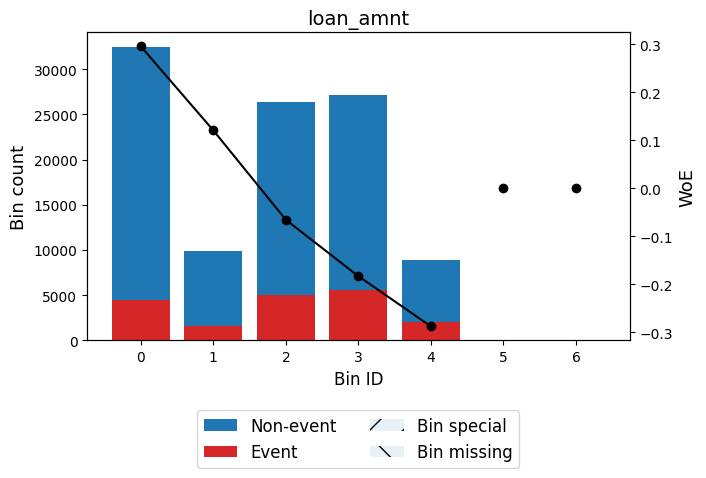


🔍 Feature: funded_amnt
✅ Total IV for funded_amnt: 0.0440
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 9012.50)      │   32478 │             0.1392 │ 0.29555611794296244  │ 0.0245585  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [9012.50, 10012.50)  │    9912 │             0.1616 │ 0.12008540640504739  │ 0.00131164 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [10012.50, 16037.50) │   26464 │             0.1883 │ -0.0652318656606301  │ 0.00109709 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [16037.50, 28012.50) │   27106 │             0.2072 │ -0.18437789106601365 │ 0.00931823 │
├────────────────────

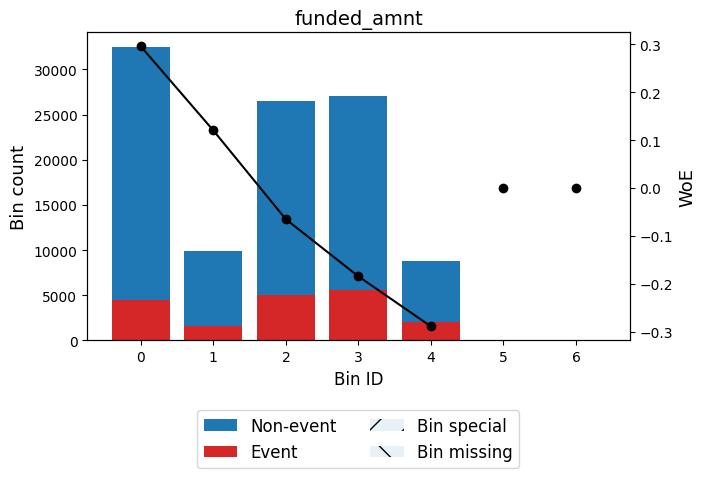


🔍 Feature: term
✅ Total IV for term: 0.2166
╒═══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                 │        IV │
╞═══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 48.00) │   79741 │             0.1378 │ 0.3073841596637701  │ 0.0649606 │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [48.00, inf)  │   25063 │             0.3082 │ -0.7174954188198741 │ 0.151631  │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│               │  104804 │             0.

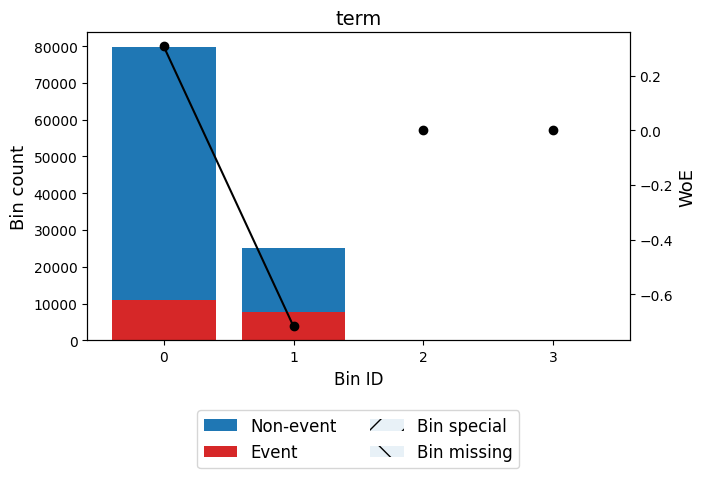


🔍 Feature: int_rate
✅ Total IV for int_rate: 0.4326
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 8.12)   │   16382 │             0.0508 │ 1.4005966108748313   │ 0.190623    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8.12, 11.47)  │   23054 │             0.1106 │ 0.5584052760752933   │ 0.0569058   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.47, 14.44) │   29390 │             0.1721 │ 0.04493867784232952  │ 0.000558164 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14.44, 18.82) │   24231 │             0.2461 │ -0.40654416863435827 │ 0.0432733   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────

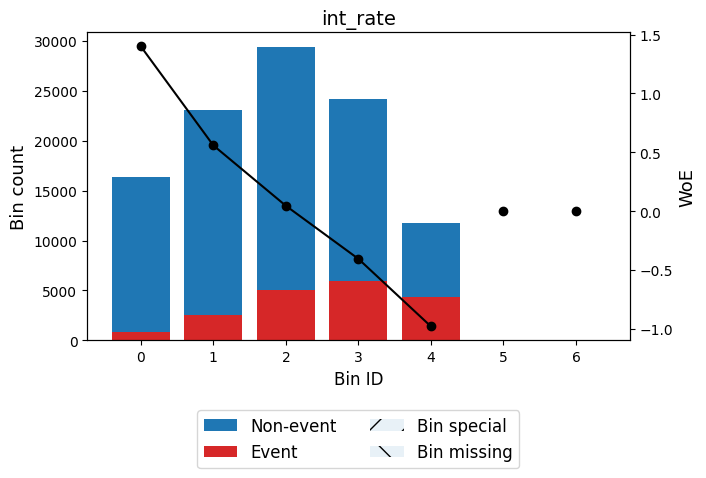


🔍 Feature: installment
✅ Total IV for installment: 0.0320
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 193.38)   │   16132 │             0.131  │ 0.3656389768139452   │ 0.018233    │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [193.38, 251.58) │    9826 │             0.1502 │ 0.20680445886834153  │ 0.00374731  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [251.58, 337.48) │   18833 │             0.1732 │ 0.03731917912488525  │ 0.000247273 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [337.48, 877.63) │   52881 │             0.1962 │ -0.11575526149515092 │ 0.00701403  │
├──────────────────┼─────────┼────────────────────┼

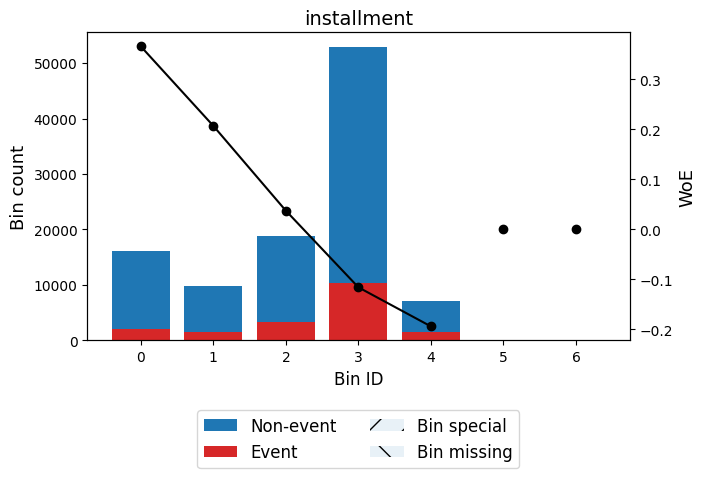


🔍 Feature: emp_length
✅ Total IV for emp_length: 0.0014
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   14983 │             0.1821 │ -0.023756076817281757 │ 8.12978e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 3.50) │   17856 │             0.1717 │ 0.04784996448491641   │ 0.000384113 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 4.50) │    6213 │             0.163  │ 0.10962104650469318   │ 0.000687467 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 5.50) │    6524 │             0.1763 │ 0.015689214001998852  │ 1.52456e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────

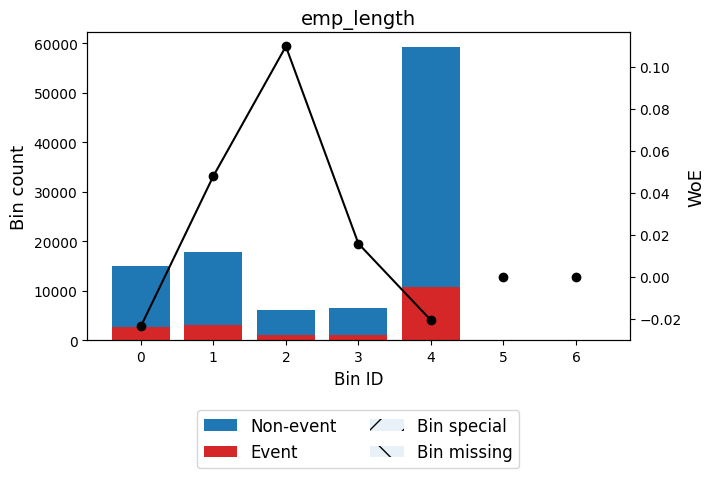


🔍 Feature: annual_inc
✅ Total IV for annual_inc: 0.0254
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 45752.50)      │   26224 │             0.2046 │ -0.16846653812055346 │ 0.00748933 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [45752.50, 75642.10)  │   40181 │             0.1869 │ -0.05586898532613804 │ 0.00121826 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [75642.10, 96006.00)  │   16185 │             0.1648 │ 0.0964976706321714   │ 0.00139372 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [96006.00, 125887.00) │   12394 │             0.152  │ 0.19280865491854637  │ 0.0041277  │
├────────────

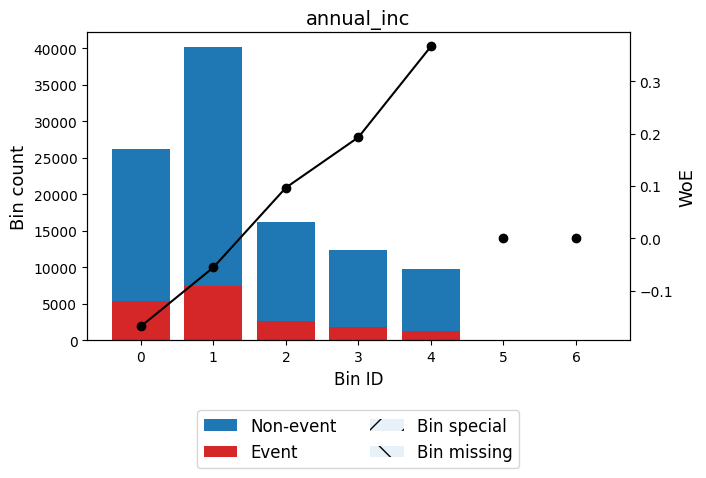


🔍 Feature: dti
✅ Total IV for dti: 0.0927
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 12.78)  │   29974 │             0.1266 │ 0.4054535351527895   │ 0.0410986  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [12.78, 18.57) │   26632 │             0.1634 │ 0.10720723980058411  │ 0.00282071 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [18.57, 26.05) │   28396 │             0.1955 │ -0.11159107621802877 │ 0.00349571 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [26.05, 32.85) │   14516 │             0.2413 │ -0.38028839683951254 │ 0.0225118  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [32.85, i

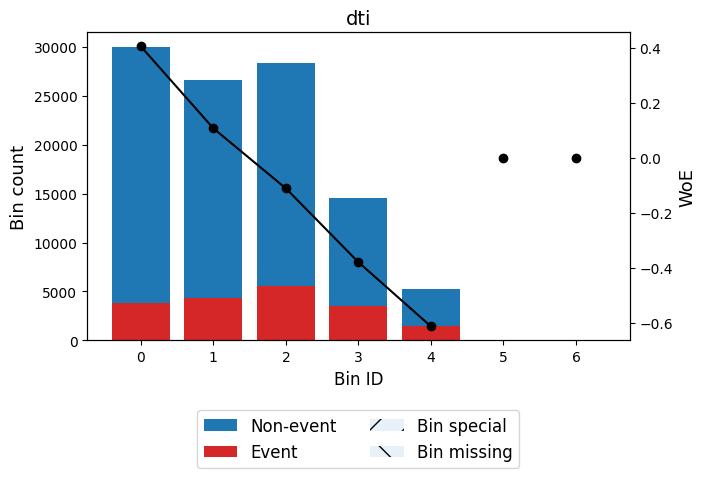


🔍 Feature: delinq_2yrs
✅ Total IV for delinq_2yrs: 0.0024
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   84449 │             0.1751 │ 0.023621249937080924 │ 0.000446187 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │   13415 │             0.1895 │ -0.07278987456779196 │ 0.00069413  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, inf)  │    6940 │             0.1993 │ -0.13531801220097894 │ 0.00126565  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Miss

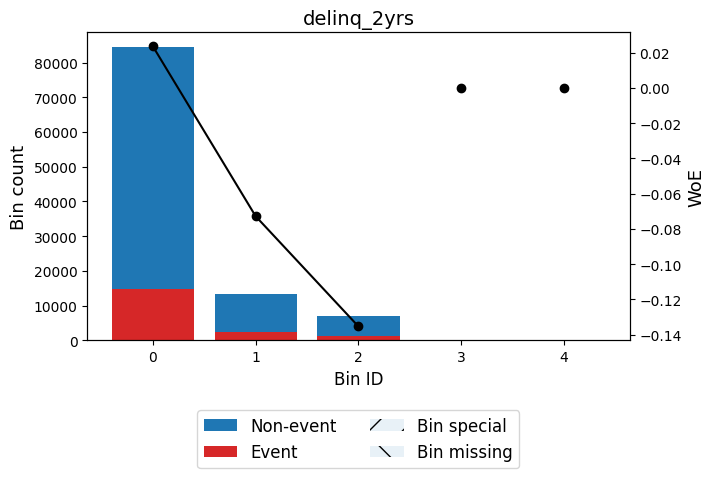


🔍 Feature: inq_last_6mths
✅ Total IV for inq_last_6mths: 0.0293
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   59397 │             0.1589 │ 0.1402112562715041   │ 0.0106445  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   28829 │             0.1909 │ -0.08184613362490567 │ 0.00189138 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   10780 │             0.2191 │ -0.2552578012429336  │ 0.00725807 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, inf)  │    5798 │             0.2432 │ -0.3908375157932351  │ 0.00952657 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special  

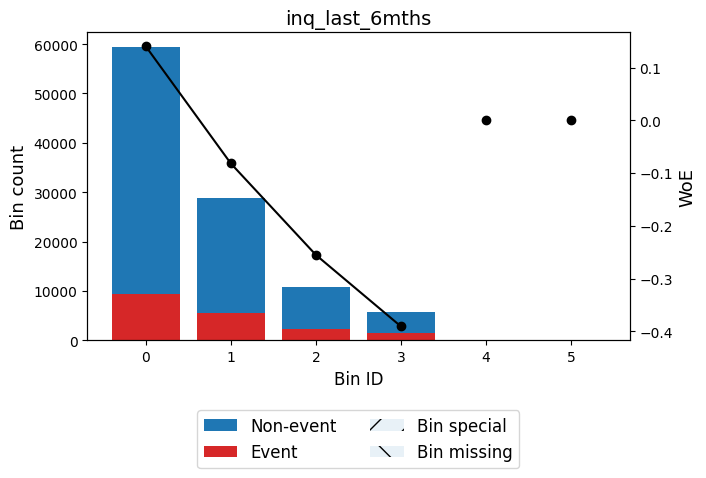


🔍 Feature: open_acc
✅ Total IV for open_acc: 0.0162
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 5.50)   │    8822 │             0.1429 │ 0.2649770457772085   │ 0.00541719  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 7.50)   │   14626 │             0.1596 │ 0.13524375658773202  │ 0.00244268  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 11.50)  │   35739 │             0.1726 │ 0.04090632350026069  │ 0.000563135 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 17.50) │   32144 │             0.1898 │ -0.07502732080408325 │ 0.00176829  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────

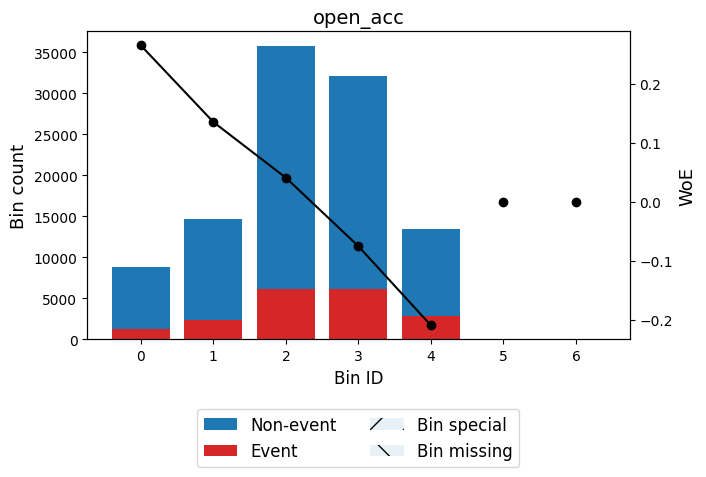


🔍 Feature: pub_rec
✅ Total IV for pub_rec: 0.0059
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   87730 │             0.1735 │ 0.034913284973516534 │ 0.00100893 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17074 │             0.2046 │ -0.16821056251890565 │ 0.00486098 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │  104804 

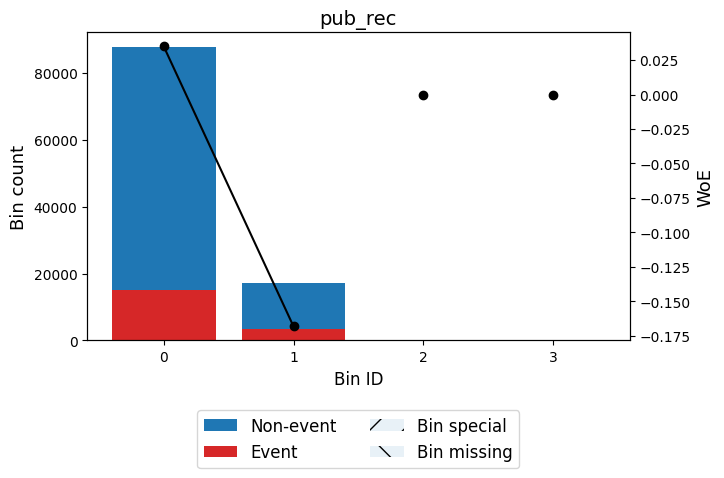


🔍 Feature: revol_bal
✅ Total IV for revol_bal: 0.0038
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2782.50)      │    8339 │             0.1626 │ 0.11281808052955244  │ 0.00097629  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2782.50, 12141.50)  │   46900 │             0.1783 │ 0.001825780753195172 │ 1.49086e-06 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [12141.50, 22934.50) │   28035 │             0.19   │ -0.07596051952535054 │ 0.00158132  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [22934.50, 35588.00) │   12781 │             0.1768 │ 0.011887092725814119 │ 1.71663e-05 │
├──────────────

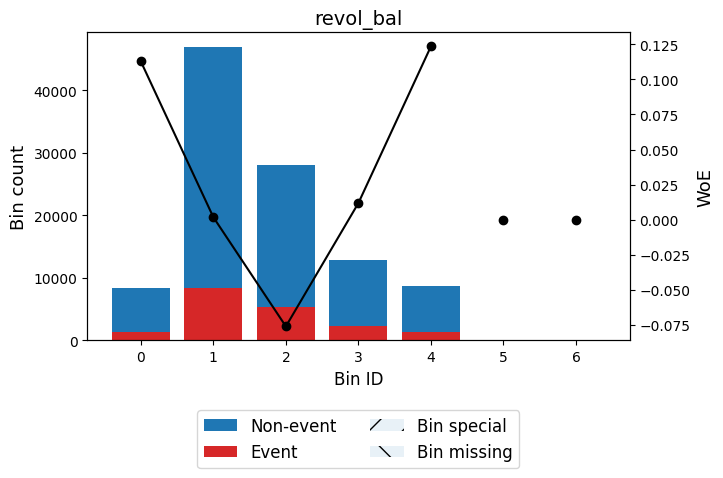


🔍 Feature: revol_util
✅ Total IV for revol_util: 0.0209
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 17.85)  │    8679 │             0.131  │ 0.3659728302516243   │ 0.00982613  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [17.85, 33.95) │   15533 │             0.1546 │ 0.17304532858408805  │ 0.00419434  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [33.95, 48.45) │   20112 │             0.1726 │ 0.04095728477881666  │ 0.000317687 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [48.45, 62.65) │   21576 │             0.1859 │ -0.04925365488626743 │ 0.000507355 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─

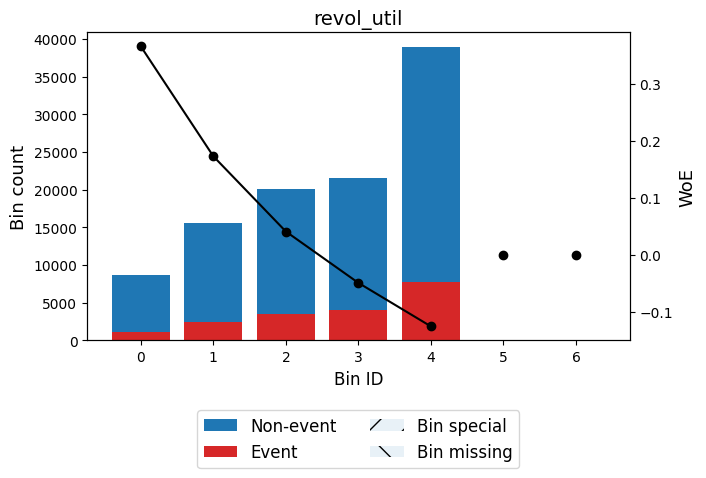


🔍 Feature: total_acc
✅ Total IV for total_acc: 0.0035
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 11.50)  │   10331 │             0.1633 │ 0.10779228126466633   │ 0.00110596  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11.50, 14.50) │    8685 │             0.1687 │ 0.0688783566195621    │ 0.000384485 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [14.50, 21.50) │   25336 │             0.1748 │ 0.02606249218814294   │ 0.000162834 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [21.50, 40.50) │   49195 │             0.1811 │ -0.017453454660826706 │ 0.000143793 │
├────────────────┼─────────┼────────────────────┼────────────────

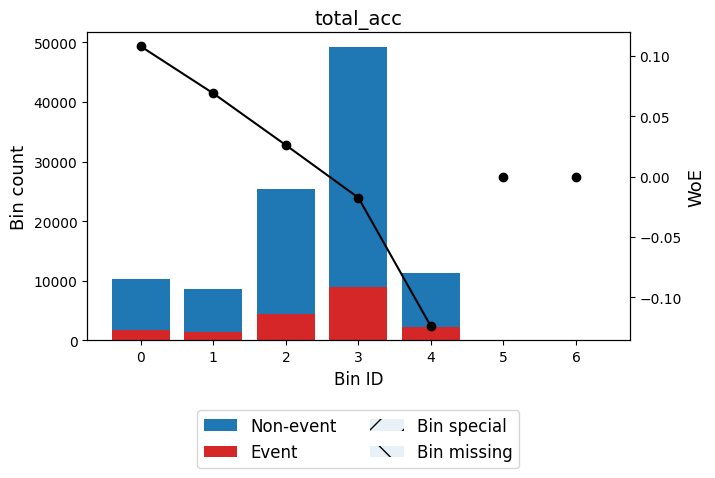


🔍 Feature: collections_12_mths_ex_med
✅ Total IV for collections_12_mths_ex_med: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


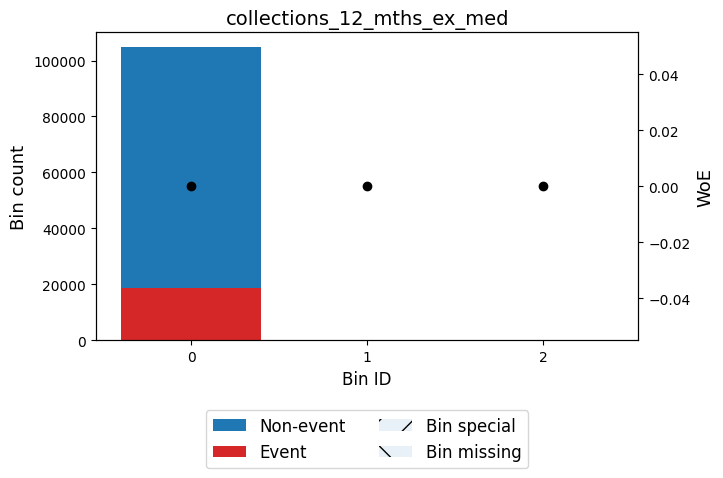


🔍 Feature: acc_now_delinq
✅ Total IV for acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


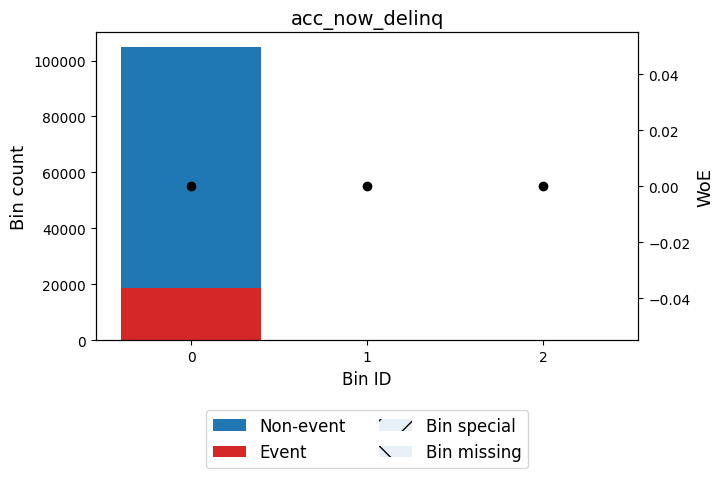


🔍 Feature: tot_cur_bal
✅ Total IV for tot_cur_bal: 0.0278
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 14981.50)      │   10231 │             0.1639 │ 0.10327117314750311  │ 0.0010068   │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14981.50, 40964.50)  │   23042 │             0.1977 │ -0.12527910215775506 │ 0.00359053  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [40964.50, 76420.50)  │   14718 │             0.2192 │ -0.2557131924021159  │ 0.00994625  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [76420.50, 210670.50) │   32477 │             0.1764 │ 0.015009305991190658 │ 6.94738e-05 │
├

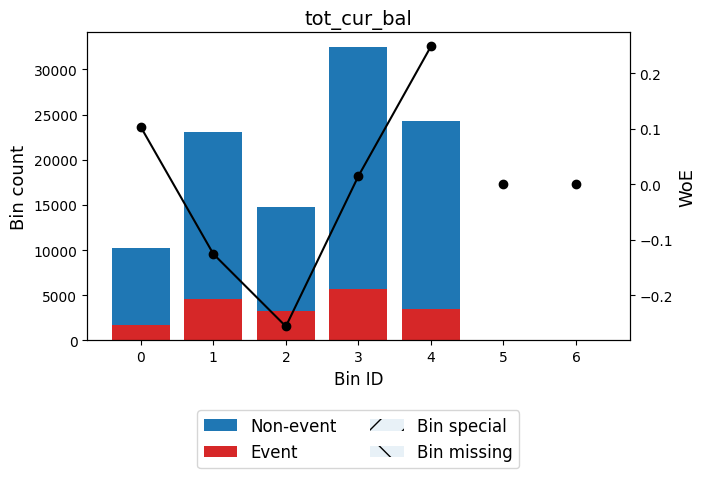


🔍 Feature: total_rev_hi_lim
✅ Total IV for total_rev_hi_lim: 0.0148
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 9025.00)      │   11098 │             0.1957 │ -0.1128013896807527  │ 0.00139655  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9025.00, 23939.00)  │   37975 │             0.1905 │ -0.07948697578913944 │ 0.00234811  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23939.00, 50953.50) │   39892 │             0.1766 │ 0.013248538180181235 │ 6.65261e-05 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [50953.50, 82068.00) │   10565 │             0.1506 │ 0.203847404382       │ 0.0039186   │
├

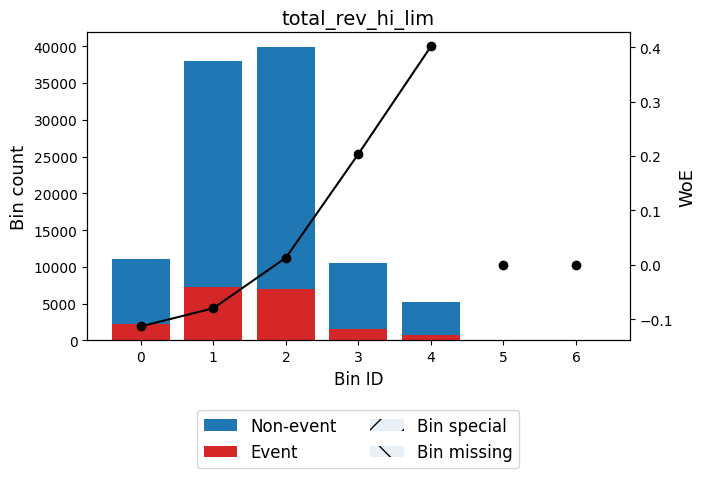


🔍 Feature: acc_open_past_24mths
✅ Total IV for acc_open_past_24mths: 0.0852
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 2.50) │   26768 │             0.1293 │ 0.38107482616704424  │ 0.0326911  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 4.50) │   33553 │             0.1615 │ 0.12116625540619697  │ 0.00451869 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, 6.50) │   21897 │             0.1946 │ -0.10597432380455207 │ 0.00242683 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [6.50, 9.50) │   15685 │             0.23   │ -0.317972138723281   │ 0.0166978  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤

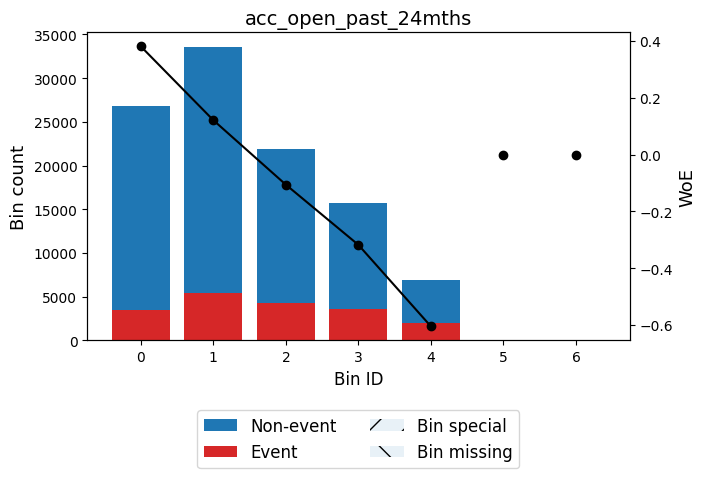


🔍 Feature: avg_cur_bal
✅ Total IV for avg_cur_bal: 0.0347
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 7248.50)      │   48575 │             0.2006 │ -0.14329738859067453  │ 0.00995894  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7248.50, 13811.50)  │   22803 │             0.1807 │ -0.014360497699876573 │ 4.5077e-05  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13811.50, 20170.00) │   11389 │             0.1654 │ 0.092299445970079     │ 0.000898482 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [20170.00, 41154.50) │   16787 │             0.1423 │ 0.27009308588729675   │ 0.0106917   │
├

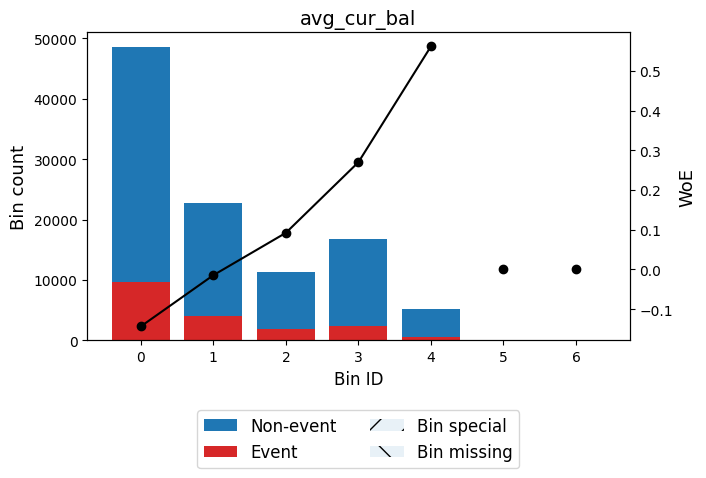


🔍 Feature: bc_open_to_buy
✅ Total IV for bc_open_to_buy: 0.0454
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 205.50)       │    6865 │             0.235  │ -0.3456081965186639  │ 0.00870457 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [205.50, 4606.50)    │   44276 │             0.1995 │ -0.13654885716582554 │ 0.00822536 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4606.50, 14251.50)  │   33576 │             0.1679 │ 0.07476340597623987  │ 0.00174791 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [14251.50, 26808.00) │   11357 │             0.1463 │ 0.2381722448796586   │ 0.00568499 │
├──────────────

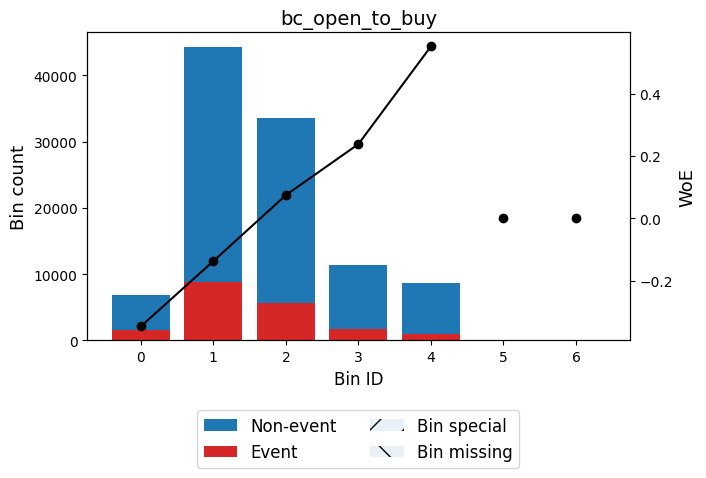


🔍 Feature: bc_util
✅ Total IV for bc_util: 0.0271
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 37.15)  │   21015 │             0.1462 │ 0.23836869617260215  │ 0.0105362  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [37.15, 63.35) │   31788 │             0.1667 │ 0.08331655861795828  │ 0.00204939 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [63.35, 92.15) │   36159 │             0.19   │ -0.07625313404714573 │ 0.00205549 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [92.15, 97.85) │   10420 │             0.2063 │ -0.17895468692011351 │ 0.00336882 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [

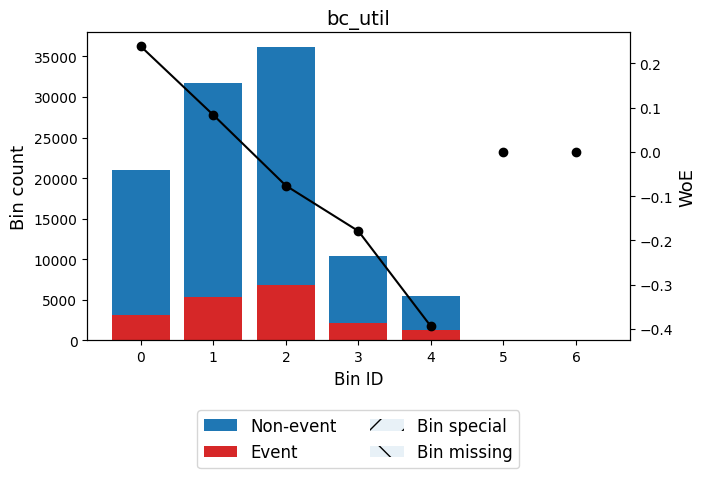


🔍 Feature: chargeoff_within_12_mths
✅ Total IV for chargeoff_within_12_mths: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


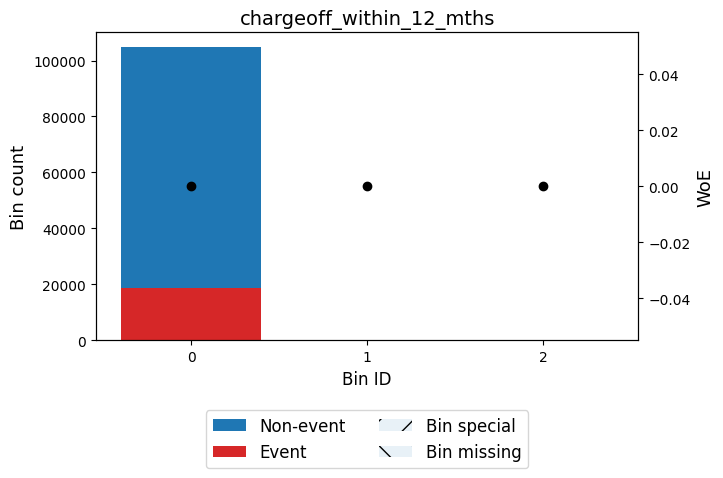


🔍 Feature: delinq_amnt
✅ Total IV for delinq_amnt: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


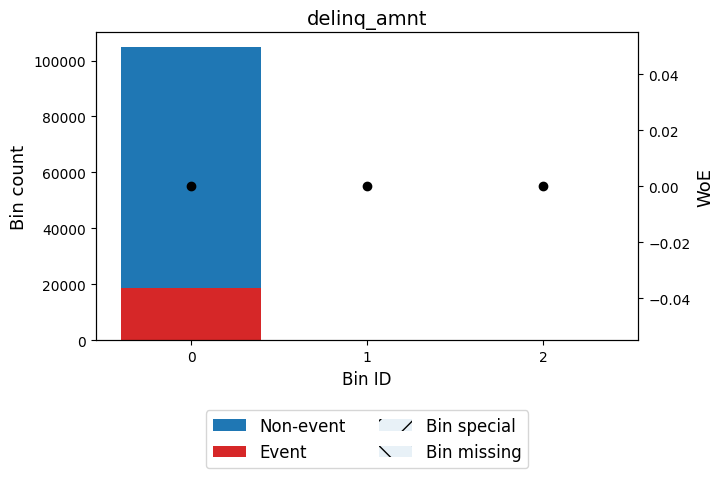


🔍 Feature: mo_sin_old_il_acct
✅ Total IV for mo_sin_old_il_acct: 0.0064
╒══════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 47.50)    │    7491 │             0.2037 │ -0.1628622311285277   │ 0.00199592  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [47.50, 127.50)  │   38153 │             0.1863 │ -0.05173159205664857  │ 0.000990482 │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [127.50, 129.50) │   11698 │             0.1557 │ 0.1647016673643773    │ 0.00286942  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [129.50, 198.50) │   40896 │             0.1732 │ 0.036684966371827166  │ 0.000518967 │
├──────────────────┼───────

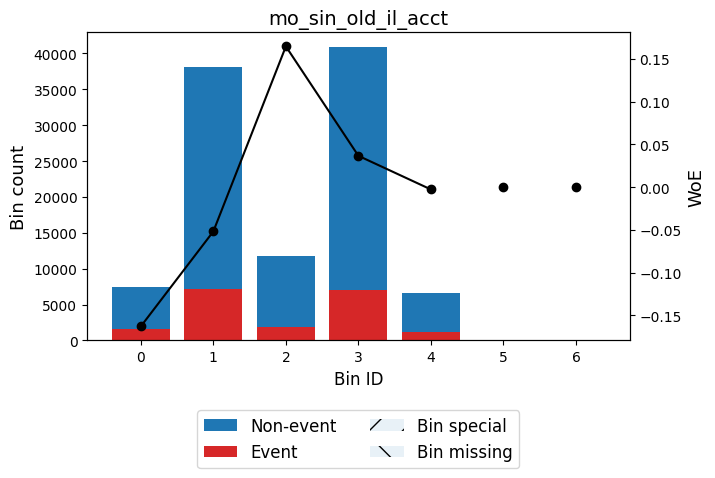


🔍 Feature: mo_sin_old_rev_tl_op
✅ Total IV for mo_sin_old_rev_tl_op: 0.0170
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 63.50)    │    6032 │             0.2291 │ -0.3127858595623554  │ 0.00620417  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [63.50, 133.50)  │   26402 │             0.1951 │ -0.10890827131286662 │ 0.00309323  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [133.50, 159.50) │   13301 │             0.1859 │ -0.04892117276534402 │ 0.000308529 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [159.50, 164.50) │    8987 │             0.1457 │ 0.24297425583470122  │ 0.00467436  │
├──────────────────┼─────────┼───

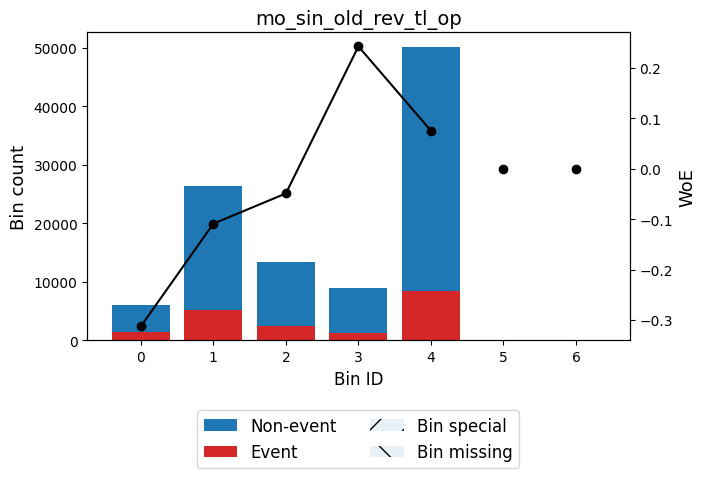


🔍 Feature: mo_sin_rcnt_rev_tl_op
✅ Total IV for mo_sin_rcnt_rev_tl_op: 0.0305
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 3.50)   │   23737 │             0.2114 │ -0.20936102826881187 │ 0.0106023  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 7.50)   │   23749 │             0.1898 │ -0.07493153105479244 │ 0.0013031  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [7.50, 21.50)  │   41073 │             0.1704 │ 0.056645994599805904 │ 0.00123471 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [21.50, 35.50) │    9070 │             0.1471 │ 0.2315814568414194   │ 0.00430184 │
├────────────────┼─────────┼────────────────────┼────────────

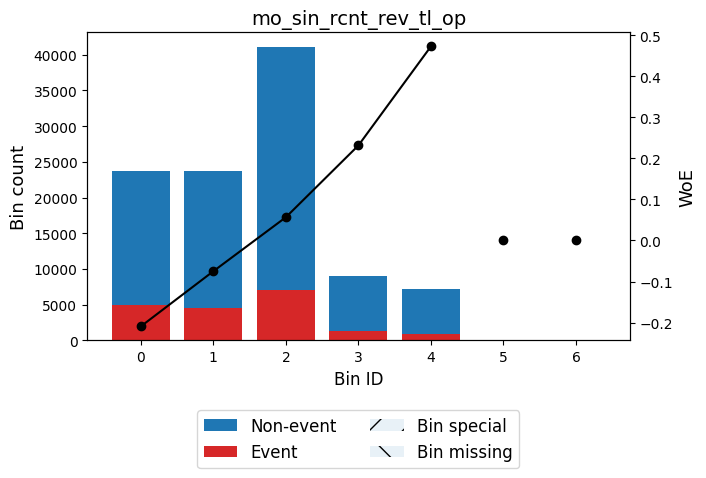


🔍 Feature: mo_sin_rcnt_tl
✅ Total IV for mo_sin_rcnt_tl: 0.0377
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50)   │   31665 │             0.2128 │ -0.2179329454495491  │ 0.0153655   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50)   │    9466 │             0.1918 │ -0.08805198615679921 │ 0.000720191 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 11.50)  │   44346 │             0.1703 │ 0.05724142054250536  │ 0.00136101  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 20.50) │   13261 │             0.1434 │ 0.26159699597057107  │ 0.00794555  │
├────────────────┼─────────┼────────────────────┼────────────────

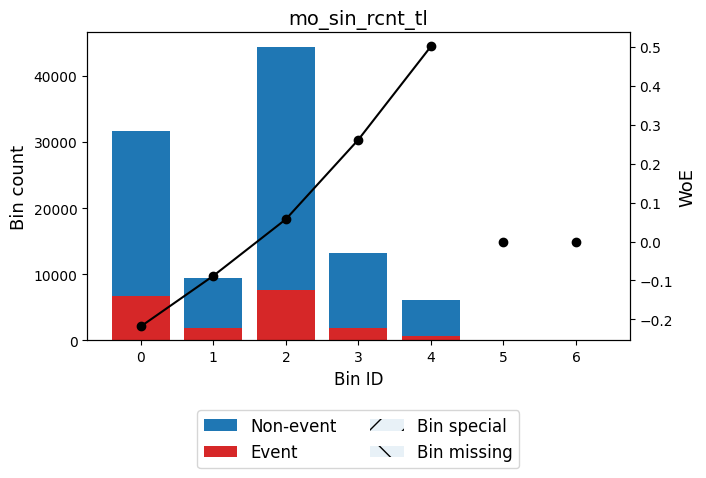


🔍 Feature: mort_acc
✅ Total IV for mort_acc: 0.0214
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   39685 │             0.203  │ -0.15830833312752235 │ 0.00997663  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 2.50) │   36235 │             0.173  │ 0.03871102064305232  │ 0.000511676 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   10892 │             0.1638 │ 0.10417376022753344  │ 0.00109034  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 5.50) │   12304 │             0.1465 │ 0.23589719268653409  │ 0.00604652  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, inf

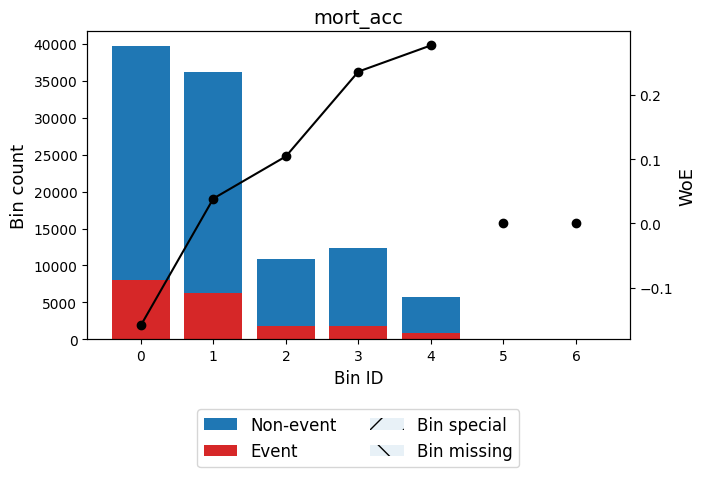


🔍 Feature: mths_since_recent_bc
✅ Total IV for mths_since_recent_bc: 0.0277
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50)   │   13533 │             0.2161 │ -0.2373711982265394  │ 0.00783685  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 12.50)  │   33181 │             0.1945 │ -0.10533950375587864 │ 0.00363278  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [12.50, 28.50) │   32889 │             0.1723 │ 0.043244238906257504 │ 0.000578718 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [28.50, 56.50) │   14265 │             0.1568 │ 0.15598022880214812  │ 0.00314738  │
├────────────────┼─────────┼────────────────────┼────

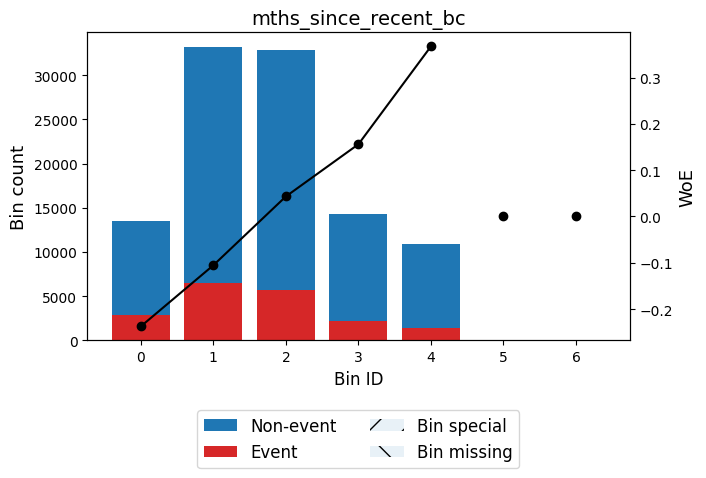


🔍 Feature: mths_since_recent_inq
✅ Total IV for mths_since_recent_inq: 0.0268
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 1.50)  │   18634 │             0.2156 │ -0.2347888011331789  │ 0.010549   │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 3.50)  │   15400 │             0.2044 │ -0.16680016693110233 │ 0.0043093  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 4.50)  │    6788 │             0.1924 │ -0.09162038678978734 │ 0.00055978 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, 14.50) │   52731 │             0.163  │ 0.11025181727874012  │ 0.00590079 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼

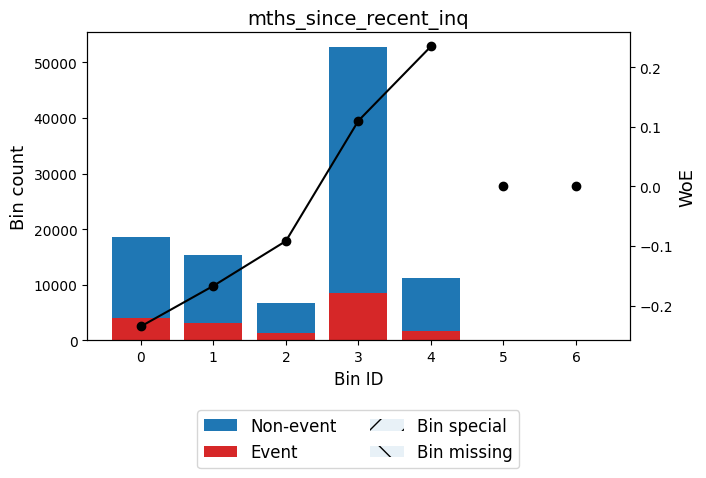


🔍 Feature: num_accts_ever_120_pd
✅ Total IV for num_accts_ever_120_pd: 0.0035
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   81603 │             0.1739 │ 0.03209372894523099  │ 0.000793733 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   23201 │             0.1949 │ -0.10795048362432214 │ 0.0026698   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─

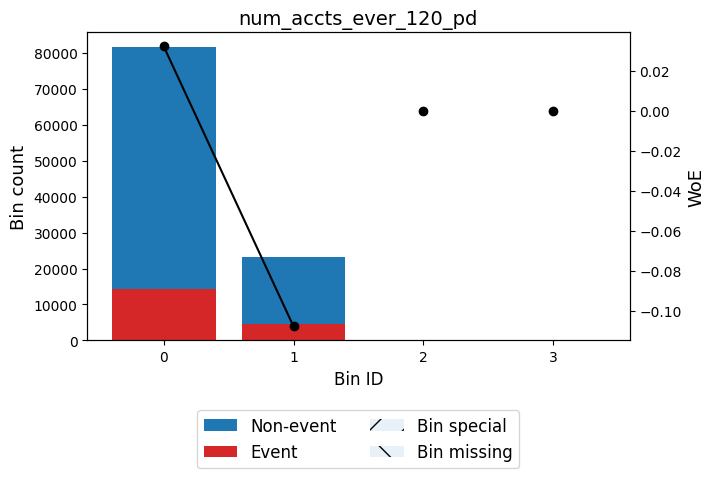


🔍 Feature: num_actv_bc_tl
✅ Total IV for num_actv_bc_tl: 0.0125
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50) │   60145 │             0.1665 │ 0.08429451476771144  │ 0.00396789  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   16625 │             0.1833 │ -0.0318280179402588  │ 0.000162342 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 5.50) │   11305 │             0.1884 │ -0.0657609395968417  │ 0.000476373 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 6.50) │    6971 │             0.1967 │ -0.11889515665521566 │ 0.000976421 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤


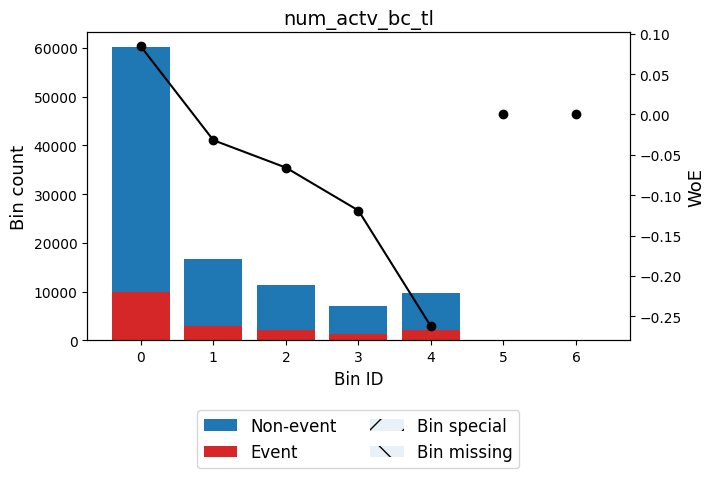


🔍 Feature: num_actv_rev_tl
✅ Total IV for num_actv_rev_tl: 0.0345
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 3.50) │   25082 │             0.1499 │ 0.2088862692085265    │ 0.00975225  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 5.50) │   36000 │             0.1664 │ 0.08511763975322362   │ 0.00242095  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 7.50) │   20923 │             0.1855 │ -0.046849633437704874 │ 0.000444803 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 9.50) │   11552 │             0.2014 │ -0.1487840482097058   │ 0.00255761  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼──

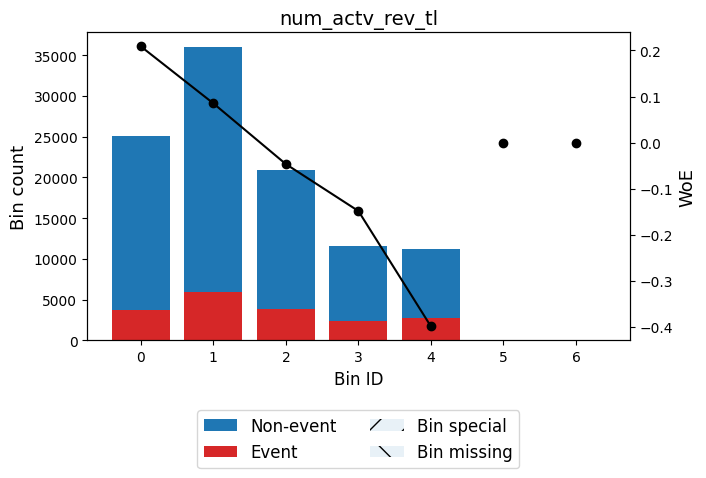


🔍 Feature: num_bc_sats
✅ Total IV for num_bc_sats: 0.0047
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │    7011 │             0.1823 │ -0.02517875584523943 │ 4.2754e-05  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 3.50) │   31180 │             0.1735 │ 0.034840577989741384 │ 0.000357099 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   22204 │             0.1646 │ 0.09852597728148704  │ 0.00199193  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 7.50) │   30628 │             0.1854 │ -0.04606277347746168 │ 0.000629276 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.5

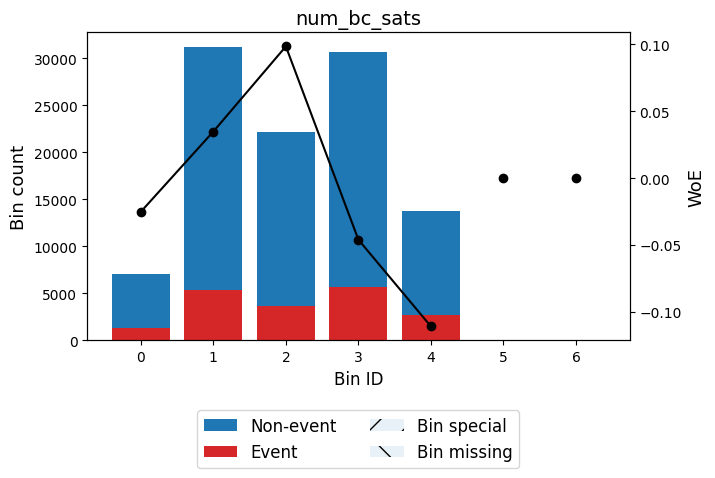


🔍 Feature: num_bc_tl
✅ Total IV for num_bc_tl: 0.0032
╒═══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50)  │    5919 │             0.1921 │ -0.08965569954840813  │ 0.000467118 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 6.50)  │   34946 │             0.1817 │ -0.021309318816136846 │ 0.00015245  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)  │   15787 │             0.1615 │ 0.12126900248661054   │ 0.00212962  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 12.50) │   31709 │             0.177  │ 0.011008372455078241  │ 3.65353e-05 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼───

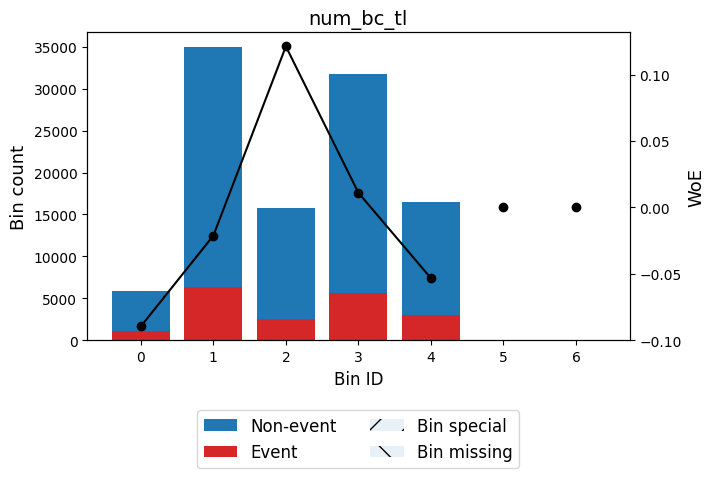


🔍 Feature: num_il_tl
✅ Total IV for num_il_tl: 0.0068
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 6.50)   │   48311 │             0.1732 │ 0.03720628109785662   │ 0.000630504 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)   │   13238 │             0.1592 │ 0.13834751987289495   │ 0.00231115  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 11.50)  │   19095 │             0.184  │ -0.036475325191165586 │ 0.000245252 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11.50, 17.50) │   13824 │             0.1887 │ -0.06783619199856172  │ 0.000620273 │
├────────────────┼─────────┼────────────────────┼────────────────

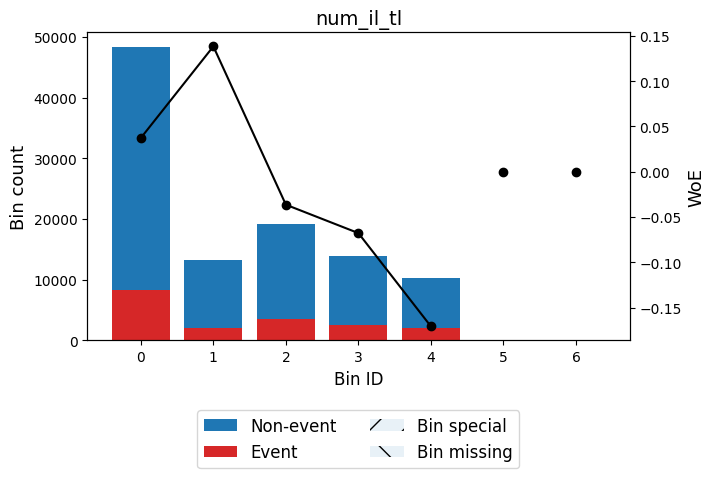


🔍 Feature: num_op_rev_tl
✅ Total IV for num_op_rev_tl: 0.0179
╒═══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 4.50)  │   17705 │             0.158  │ 0.14680467122886176   │ 0.0034708   │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 7.50)  │   38284 │             0.1655 │ 0.09174057272687586   │ 0.00298432  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 9.50)  │   17320 │             0.1796 │ -0.006798137898275325 │ 7.65417e-06 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9.50, 12.50) │   16527 │             0.1934 │ -0.09831708970322905  │ 0.00157275  │
├───────────────┼─────────┼────────────────────┼───────────────────

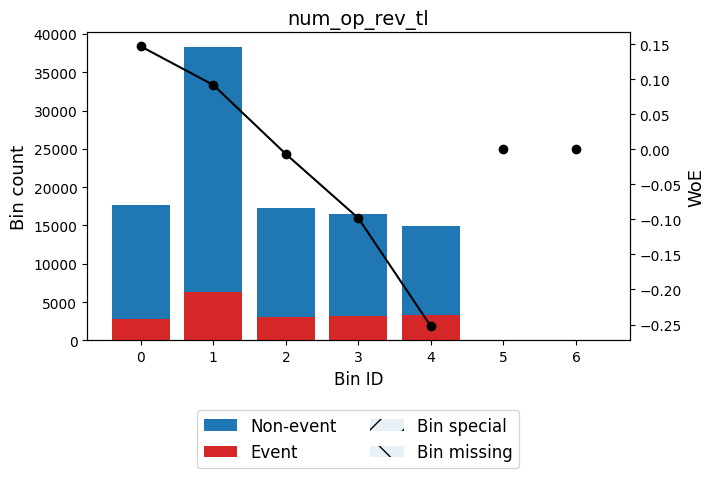


🔍 Feature: num_rev_accts
✅ Total IV for num_rev_accts: 0.0050
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 12.50)  │   43922 │             0.1739 │ 0.032278223007711215  │ 0.000432119 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [12.50, 13.50) │   11950 │             0.16   │ 0.13210672278739044   │ 0.00190622  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13.50, 18.50) │   22335 │             0.182  │ -0.02327472642600048  │ 0.00011631  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [18.50, 24.50) │   15105 │             0.1853 │ -0.045296616031159864 │ 0.000300033 │
├────────────────┼─────────┼────────────────────┼────────

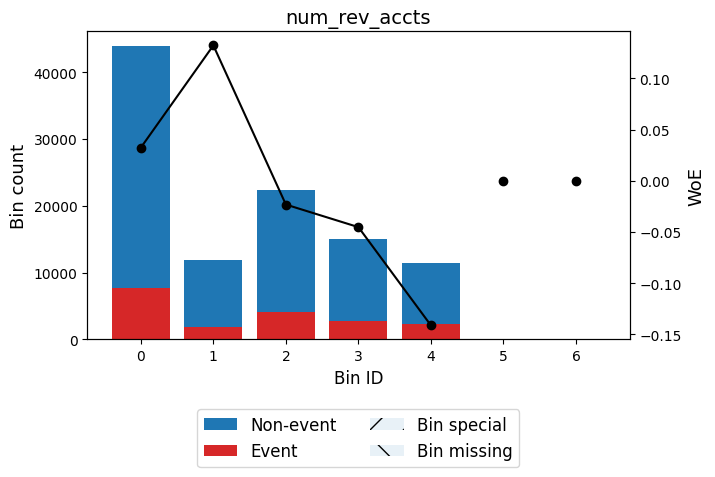


🔍 Feature: num_rev_tl_bal_gt_0
✅ Total IV for num_rev_tl_bal_gt_0: 0.0345
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 2.50)  │   11656 │             0.1432 │ 0.2629382487651575   │ 0.00705251 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 5.50)  │   49657 │             0.1638 │ 0.10436740591711624  │ 0.00498908 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [5.50, 8.50)  │   27838 │             0.189  │ -0.06927639972640542 │ 0.00130327 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [8.50, 10.50) │    8111 │             0.2127 │ -0.21724031000687472 │ 0.00391006 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────

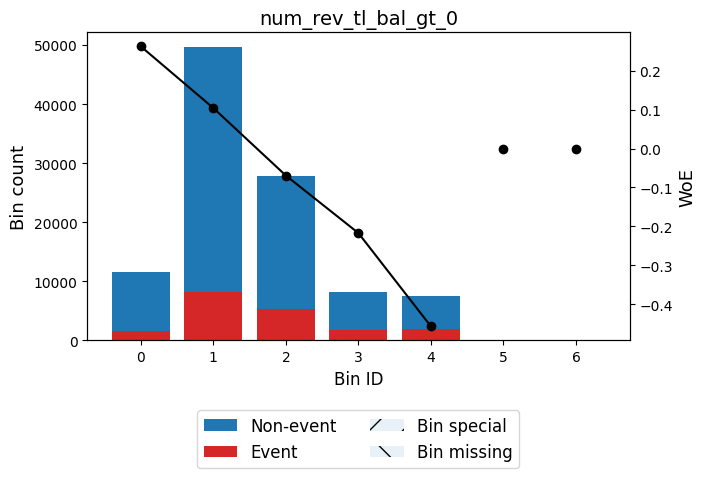


🔍 Feature: num_sats
✅ Total IV for num_sats: 0.0165
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 5.50)   │    8039 │             0.1443 │ 0.25393193360946187  │ 0.00455022 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [5.50, 11.50)  │   53108 │             0.1675 │ 0.07727315412434033  │ 0.00295103 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [11.50, 17.50) │   30631 │             0.1924 │ -0.09175613963562901 │ 0.00253362 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [17.50, 21.50) │    7698 │             0.2049 │ -0.1699201799281107  │ 0.00223759 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│

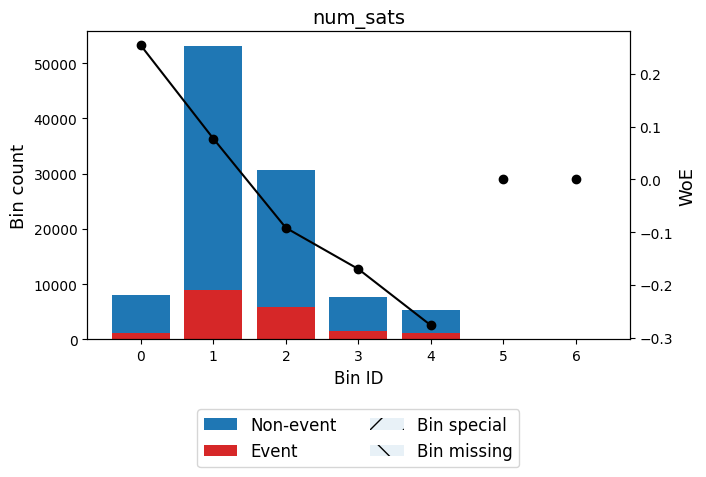


🔍 Feature: num_tl_120dpd_2m
✅ Total IV for num_tl_120dpd_2m: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


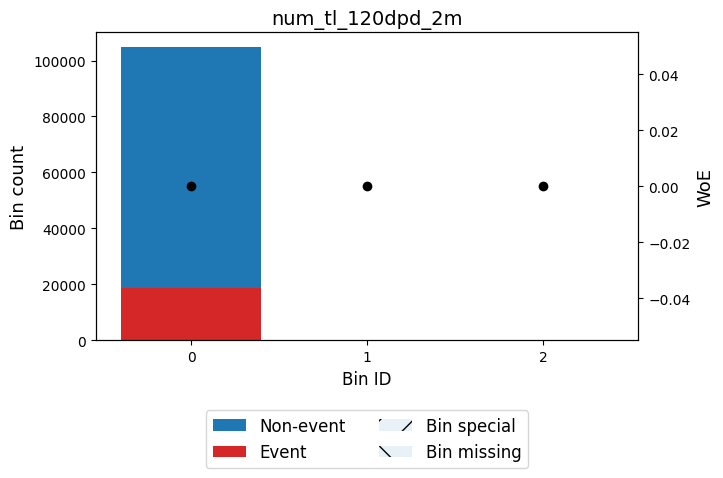


🔍 Feature: num_tl_30dpd
✅ Total IV for num_tl_30dpd: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


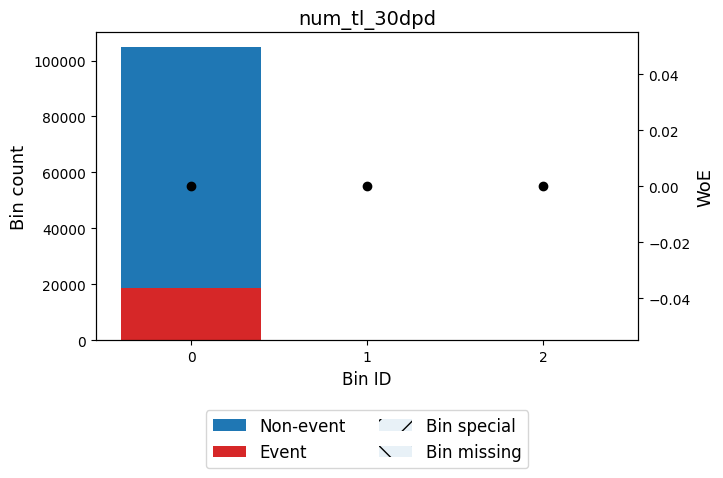


🔍 Feature: num_tl_90g_dpd_24m
✅ Total IV for num_tl_90g_dpd_24m: 0.0008
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   99030 │             0.1776 │ 0.006829472481352683 │ 4.39753e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │    5774 │             0.1957 │ -0.1127629227047462  │ 0.000726087 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────

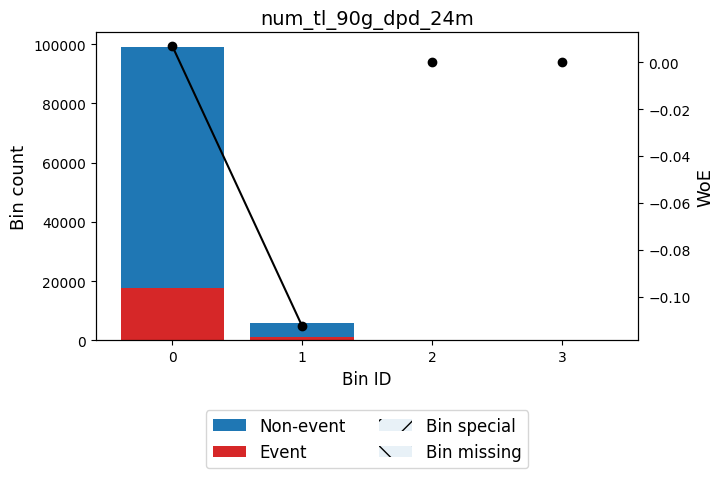


🔍 Feature: num_tl_op_past_12m
✅ Total IV for num_tl_op_past_12m: 0.0648
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   16652 │             0.1316 │ 0.36097595620318357  │ 0.0183727  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   24475 │             0.1527 │ 0.1872474814661902   │ 0.00770192 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   29117 │             0.169  │ 0.06630969446027568  │ 0.00119566 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 4.50) │   25651 │             0.2164 │ -0.23937963045913624 │ 0.0151159  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [

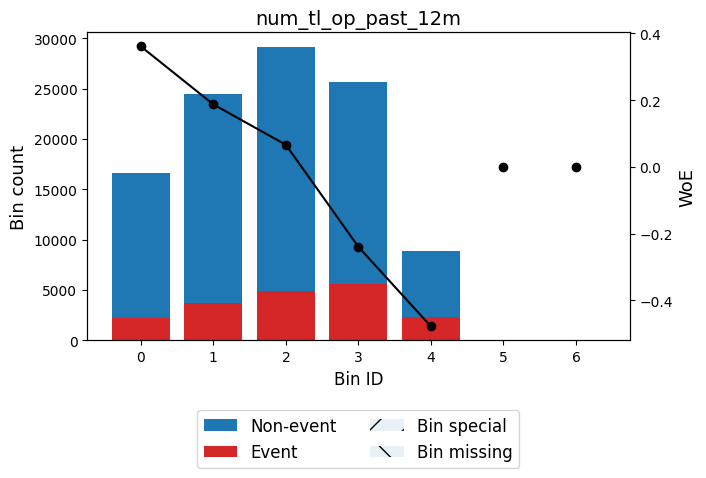


🔍 Feature: pct_tl_nvr_dlq
✅ Total IV for pct_tl_nvr_dlq: 0.0065
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 96.25)  │   42767 │             0.1878 │ -0.06196037668289489 │ 0.00159792  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [96.25, 97.75) │    6146 │             0.1856 │ -0.04758901192889664 │ 0.000134846 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [97.75, 97.85) │    6780 │             0.142  │ 0.272365178296494    │ 0.00438781  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [97.85, inf)   │   49111 │             0.1746 │ 0.02693557227269494  │ 0.000337041 │
├────────────────┼─────────┼────────────────────┼────────────────

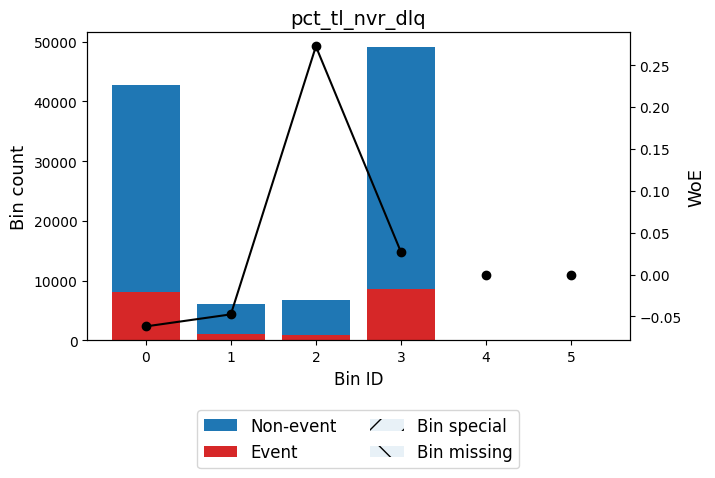


🔍 Feature: percent_bc_gt_75
✅ Total IV for percent_bc_gt_75: 0.0297
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 4.90)   │   21299 │             0.1422 │ 0.27090648452867305   │ 0.0136435   │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.90, 44.05)  │   31466 │             0.1658 │ 0.08981381059713889   │ 0.00235237  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [44.05, 52.75) │   11977 │             0.1823 │ -0.025051478103823133 │ 7.22978e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [52.75, 67.70) │   11415 │             0.2005 │ -0.1431089122813609   │ 0.00233403  │
├────────────────┼─────────┼────────────────────┼──

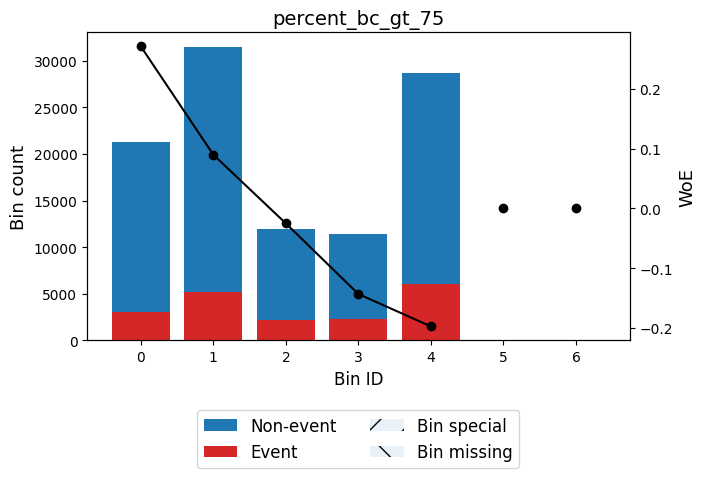


🔍 Feature: pub_rec_bankruptcies
✅ Total IV for pub_rec_bankruptcies: 0.0036
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   92574 │             0.1753 │ 0.022490862788275612 │ 0.000443585 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   12230 │             0.2034 │ -0.16064944019420535 │ 0.00316847  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───

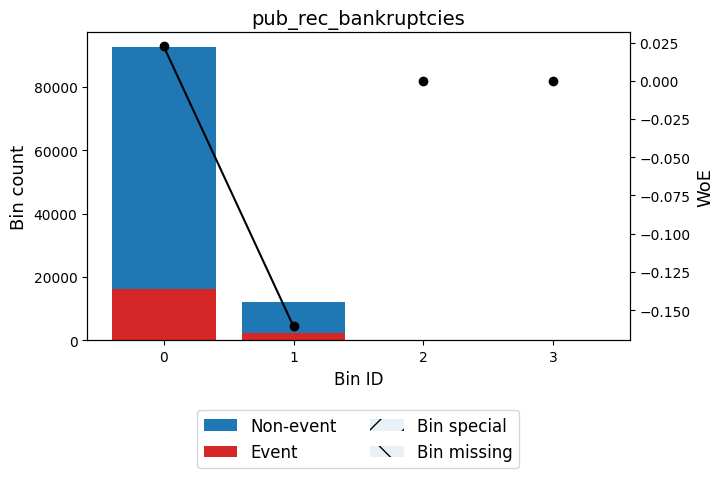


🔍 Feature: tax_liens
✅ Total IV for tax_liens: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


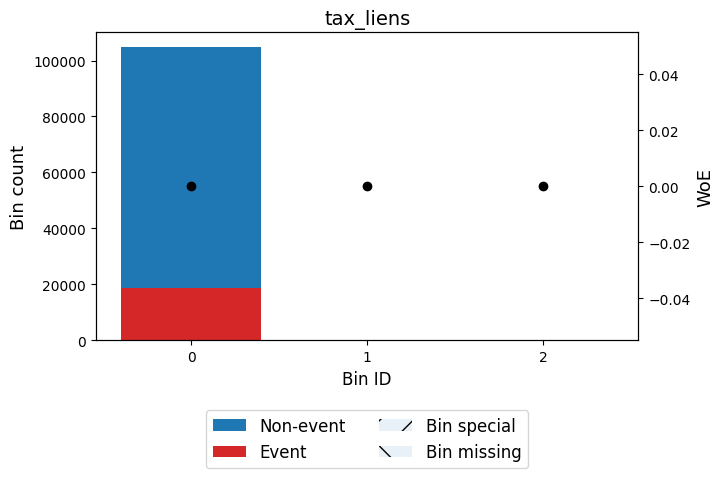


🔍 Feature: tot_hi_cred_lim
✅ Total IV for tot_hi_cred_lim: 0.0291
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 46920.50)       │   22829 │             0.1895 │ -0.07254656927084646 │ 0.00117326  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [46920.50, 111203.50)  │   26015 │             0.2084 │ -0.1914018828597841  │ 0.00965841  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [111203.50, 244077.00) │   30562 │             0.1753 │ 0.022290587141250207 │ 0.000143856 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [244077.00, 481131.50) │   20102 │             0.1475 │ 0.22784591617351047 

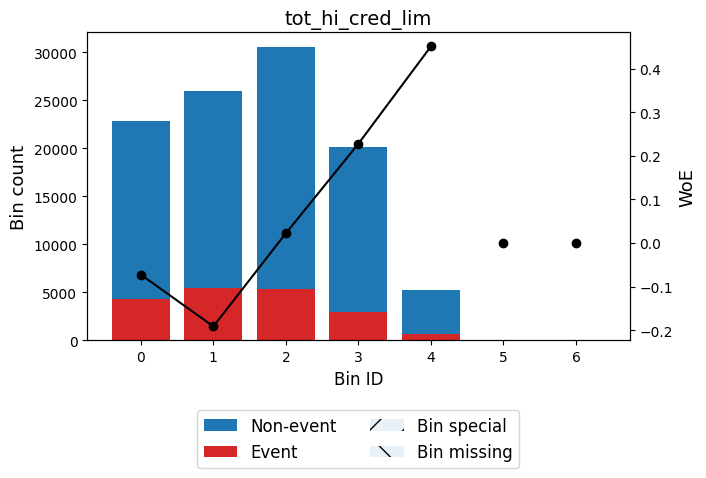


🔍 Feature: total_bal_ex_mort
✅ Total IV for total_bal_ex_mort: 0.0100
╒═══════════════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                    │          IV │
╞═══════════════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 9589.50)       │    7761 │             0.1446 │ 0.2517271888203758     │ 0.00432011  │
├───────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [9589.50, 18598.50)   │   13041 │             0.1634 │ 0.1069670929123574     │ 0.00137516  │
├───────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [18598.50, 40964.50)  │   38520 │             0.1748 │ 0.026095229933231323   │ 0.000248187 │
├───────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [40964.50, 116224.50) │   38683 │             0.1942 │ -0.10346

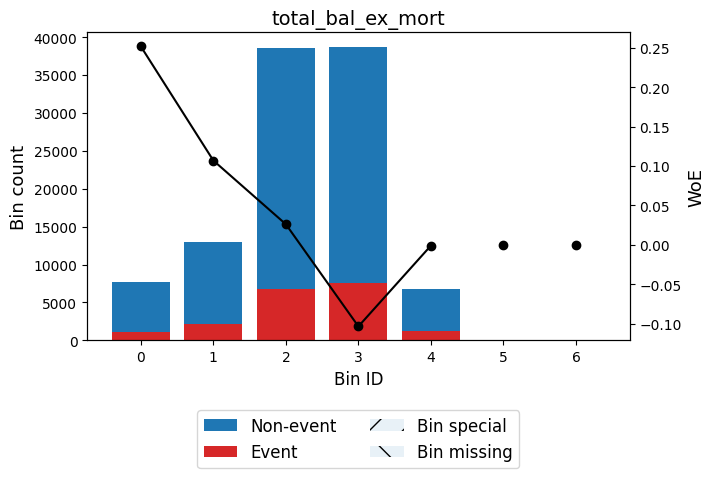


🔍 Feature: total_bc_limit
✅ Total IV for total_bc_limit: 0.0285
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 11041.00)     │   38173 │             0.2031 │ -0.1591009322218171  │ 0.00969523  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11041.00, 14717.50) │   11629 │             0.1869 │ -0.05614644040473871 │ 0.000356125 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14717.50, 41223.00) │   42128 │             0.1693 │ 0.06468951266771139  │ 0.00164731  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [41223.00, 52309.50) │    5244 │             0.1384 │ 0.3021533283870106   │ 0.00413511  │
├────

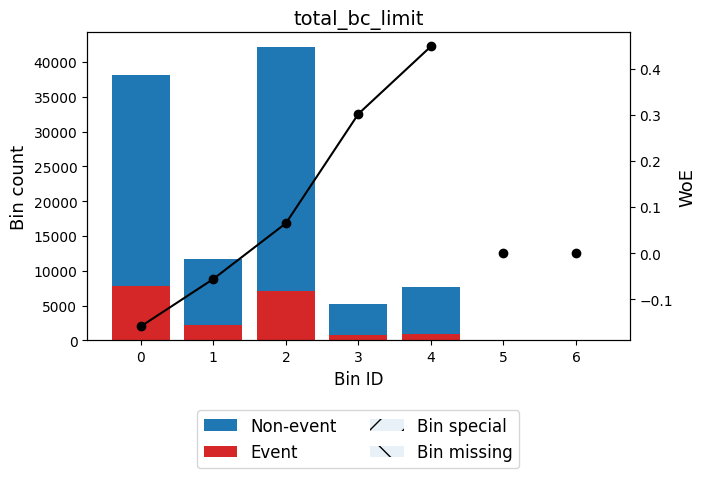


🔍 Feature: total_il_high_credit_limit
✅ Total IV for total_il_high_credit_limit: 0.0080
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 30337.50)     │   47869 │             0.1739 │ 0.03217500162385045   │ 0.000467959 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [30337.50, 31297.00) │    7756 │             0.1423 │ 0.26985625965963567   │ 0.00493154  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [31297.00, 41458.50) │   12045 │             0.1813 │ -0.018691828348608386 │ 4.03959e-05 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [41458.50, 73537.00) │   22112 │             0.1906 │ -0.079844

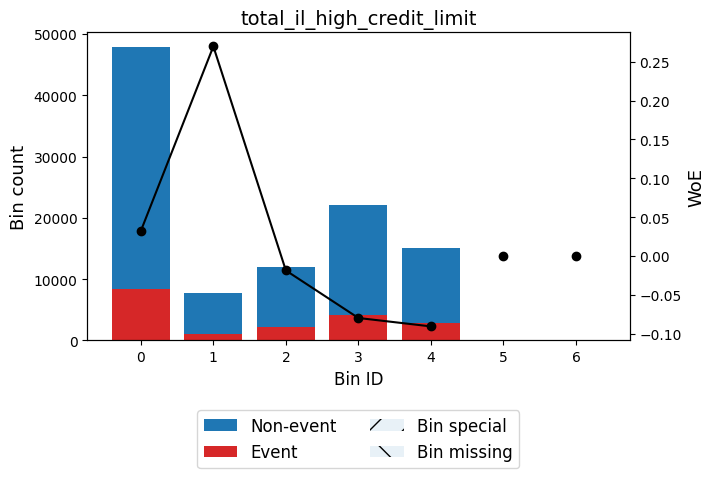


🔍 Feature: credit_history_years
✅ Total IV for credit_history_years: 0.0062
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │         IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪════════════╡
│ (-inf, 9.50)   │   17713 │             0.1845 │ -0.039951196895700036 │ 0.00027323 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [9.50, 10.50)  │    6425 │             0.2033 │ -0.16013127719493503  │ 0.00165356 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [10.50, 14.50) │   29007 │             0.1876 │ -0.060505433801502306 │ 0.00103302 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [14.50, 20.50) │   28372 │             0.1735 │ 0.03503418910728229   │ 0.00032854 │
├────────────────┼─────────┼────────────────────┼────

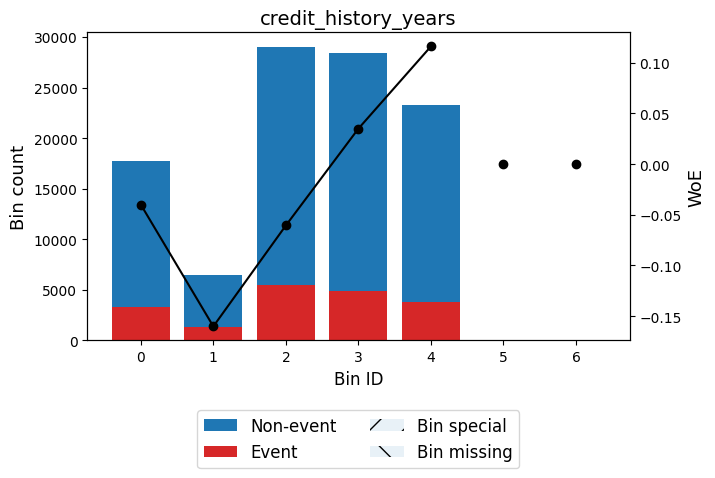


🔍 Feature: fico_score
✅ Total IV for fico_score: 0.1153
╒══════════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 679.50)   │   36036 │             0.2264 │ -0.2974409901774262 │ 0.0333644  │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [679.50, 699.50) │   28618 │             0.1896 │ -0.073288744236218  │ 0.00150138 │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [699.50, 719.50) │   19444 │             0.1542 │ 0.17601553305215556 │ 0.00542686 │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [719.50, 739.50) │   10135 │             0.126  │ 0.4106860746344623  │ 0.0142322  │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼

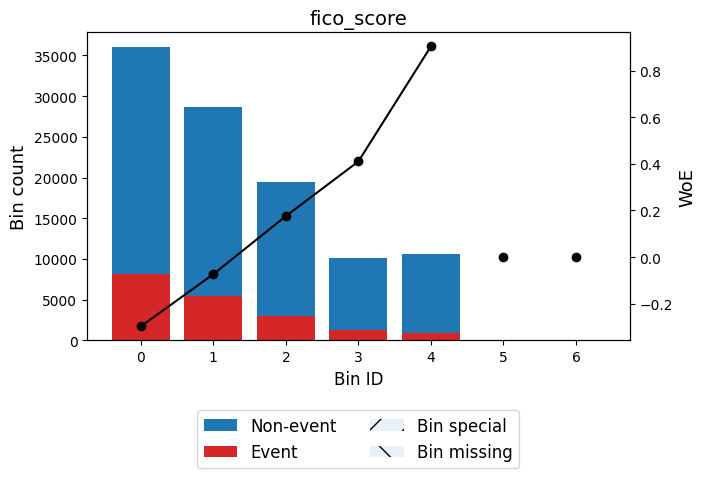


🔍 Feature: fico_score/delinq_2yrs_invalid
✅ Total IV for fico_score/delinq_2yrs_invalid: 0.0022
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   20355 │             0.1928 │ -0.09437877300133724 │ 0.00178274  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   84449 │             0.1751 │ 0.023621249937080924 │ 0.000446187 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────

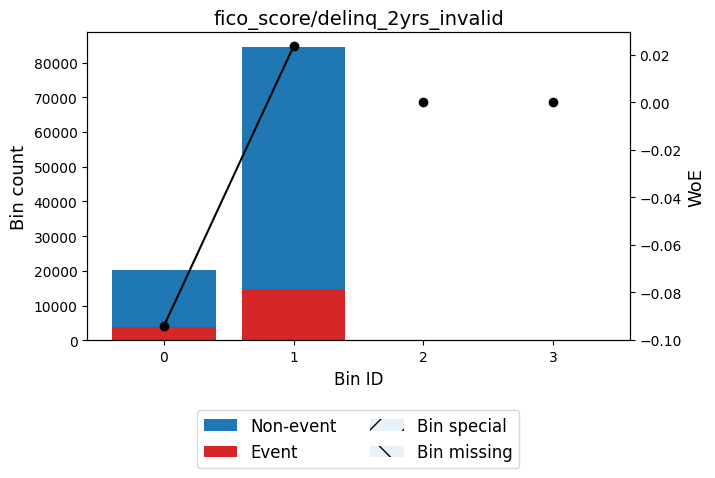


🔍 Feature: fico_score/delinq_2yrs
✅ Total IV for fico_score/delinq_2yrs: 0.0064
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 40.31)    │   84453 │             0.1751 │ 0.023678670051362927 │ 0.000448372 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [40.31, 398.50)  │    6935 │             0.1993 │ -0.13531475690215    │ 0.00126468  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [398.50, 684.50) │    7610 │             0.2126 │ -0.21688692623752348 │ 0.00365623  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [684.50, inf)    │    5806 │             0.1593 │ 0.13719030455858028  │ 0.000997133 │
├──────────────────┼─────────

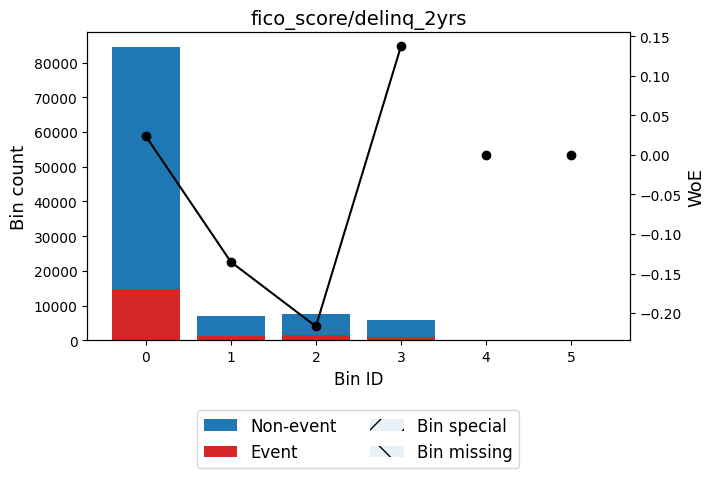


🔍 Feature: fico_score/acc_now_delinq_invalid
✅ Total IV for fico_score/acc_now_delinq_invalid: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


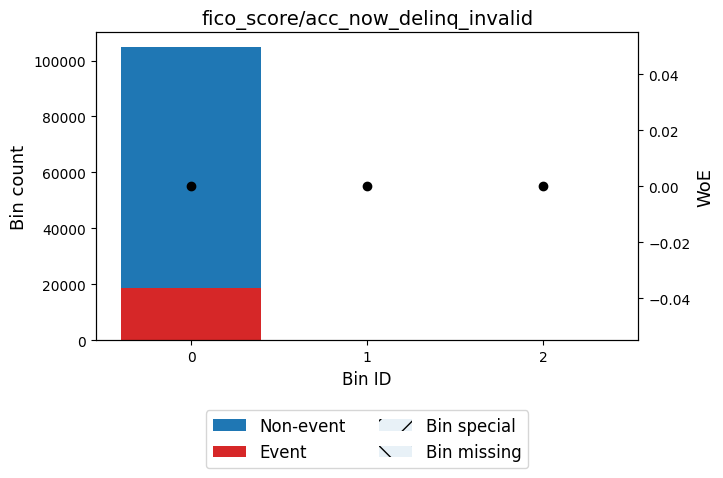


🔍 Feature: fico_score/acc_now_delinq
✅ Total IV for fico_score/acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


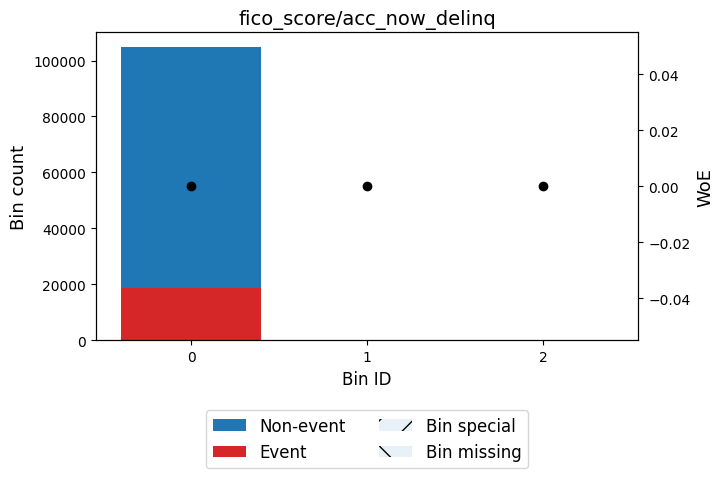


🔍 Feature: fico_score/inq_last_6mths_invalid
✅ Total IV for fico_score/inq_last_6mths_invalid: 0.0233
╒══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │        IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 0.50) │   45407 │             0.2043 │ -0.1662650630220437 │ 0.0126225 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [0.50, inf)  │   59397 │             0.1589 │ 0.1402112562715041  │ 0.0106445 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special      │       0 │             0      │ 0.0                 │ 0         │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing      │       0 │             0      │ 0.0                 │ 0         │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────

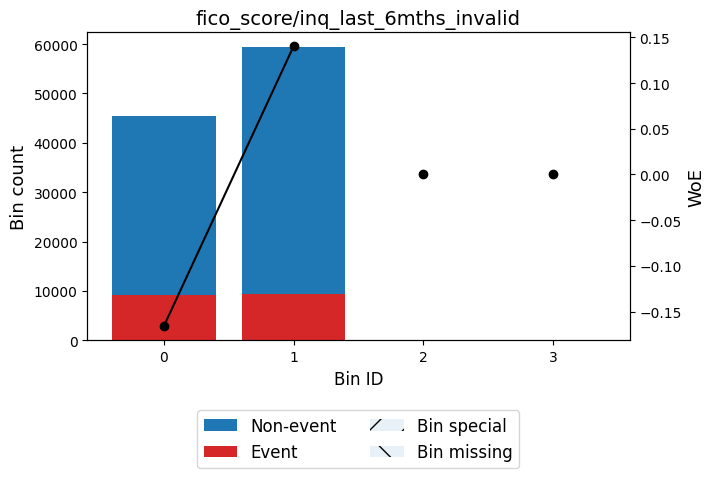


🔍 Feature: fico_score/inq_last_6mths
✅ Total IV for fico_score/inq_last_6mths: 0.0536
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 112.42)   │   59430 │             0.1589 │ 0.140367891525212    │ 0.0106737  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [112.42, 344.75) │   11788 │             0.2489 │ -0.4216186992269826  │ 0.0227401  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [344.75, 684.50) │   17811 │             0.216  │ -0.23726391265954438 │ 0.0103045  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [684.50, 704.50) │    7126 │             0.1896 │ -0.07342815638634659 │ 0.00037529 │
├──────────────────┼─────────┼───

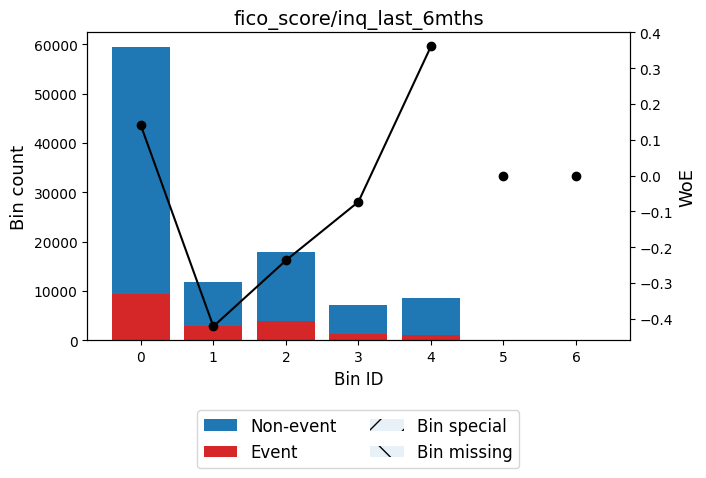


🔍 Feature: delinq_2yrs/credit_history_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: delinq_2yrs/credit_history
✅ Total IV for delinq_2yrs/credit_history: 0.0033
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.04) │   85962 │             0.1752 │ 0.023296084192024225  │ 0.000441809 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.04, 0.07) │    7435 │             0.1817 │ -0.021304038397157443 │ 3.24186e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.07, 0.12) │    5742 │             0.1968 │ -0.11967738413357853  │ 0.000815094 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.12, inf)  │    5665 │             0.2074 │ -0.1855

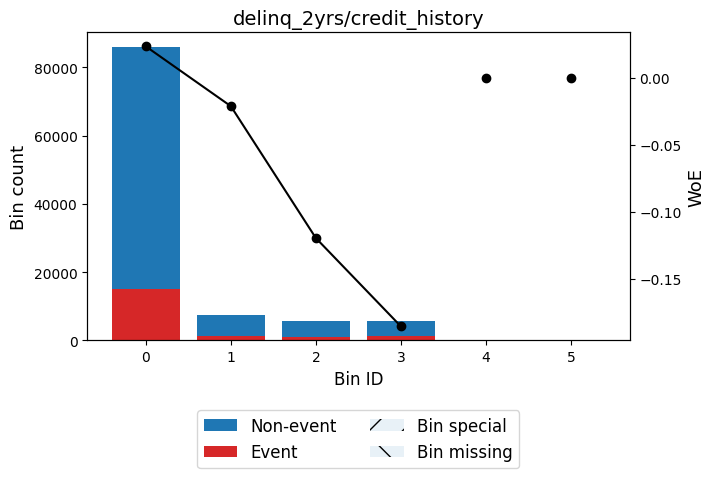


🔍 Feature: late_pymt_hist_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: late_pymt_hist
✅ Total IV for late_pymt_hist: 0.0042
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.06) │   86345 │             0.1741 │ 0.030776023063922908 │ 0.000772636 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.06, 0.10) │    8292 │             0.2021 │ -0.1530403981546431  │ 0.00194496  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, inf)  │   10167 │             0.1973 │ -0.12289733286877991 │ 0.00152348  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────

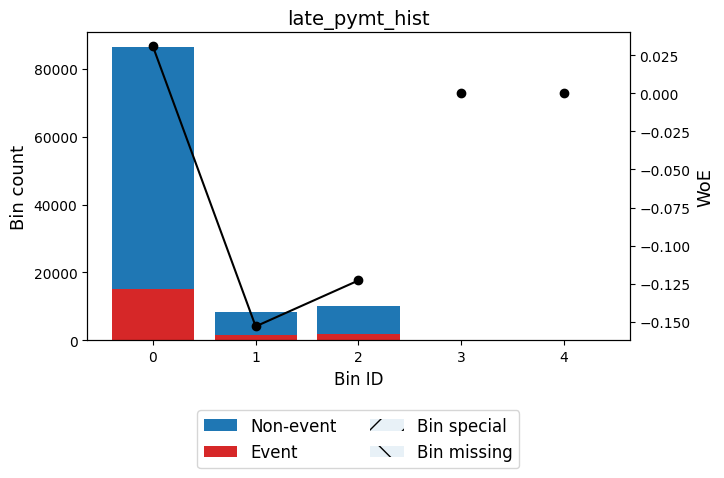


🔍 Feature: loan_amnt/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/annual_inc
✅ Total IV for loan_amnt/annual_inc: 0.1285
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.10) │   15722 │             0.1127 │ 0.5372493022683433   │ 0.0361844   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, 0.17) │   25566 │             0.1366 │ 0.31780445355719444  │ 0.0221852   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.17, 0.26) │   30216 │             0.1715 │ 0.04868956141038705  │ 0.000672825 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.26, 0.33) │   16143 │             0.2231 │ -0.27824992636205104 │ 0.0130049  

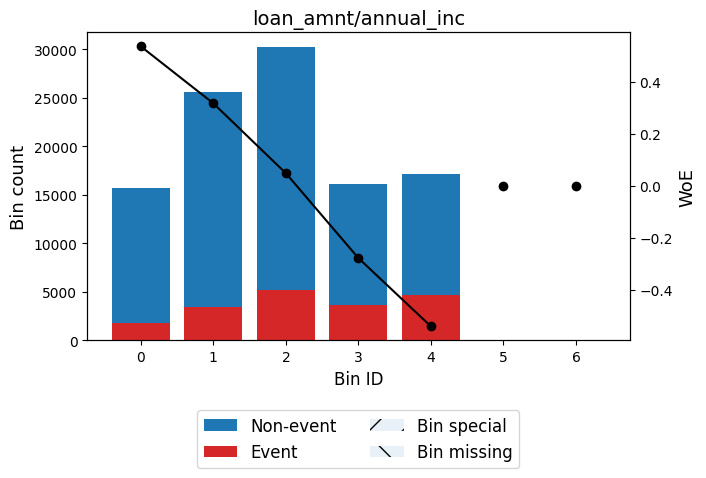


🔍 Feature: revol_util/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: revol_util/annual_inc
✅ Total IV for revol_util/annual_inc: 0.0455
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │   15371 │             0.1278 │ 0.394672394871008    │ 0.0200431   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   19597 │             0.1513 │ 0.1979328261561204   │ 0.00686641  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   23719 │             0.1783 │ 0.001526856965558654 │ 5.27354e-07 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   25971 │             0.196  │ -0.11480386572190282 │ 0.003387

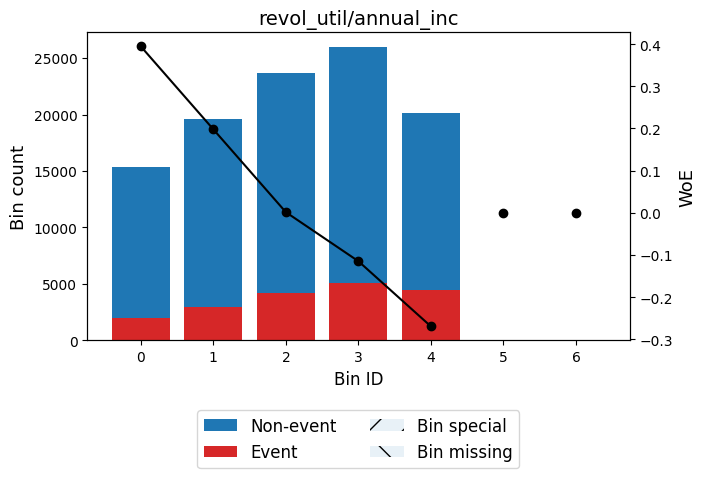


🔍 Feature: acc_op_past_24mths/total_acc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: acc_op_past_24mths/total_acc
✅ Total IV for acc_op_past_24mths/total_acc: 0.0660
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 0.07) │   12695 │             0.1187 │ 0.47859950187921285 │ 0.0236567  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.07, 0.11) │   13640 │             0.1408 │ 0.2828502442930343  │ 0.00948669 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.11, 0.19) │   32686 │             0.1659 │ 0.08898104575428945 │ 0.00239913 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.19, 0.31) │   27537 │             0.2015 │ -0.1494679119626623 │ 0.0061

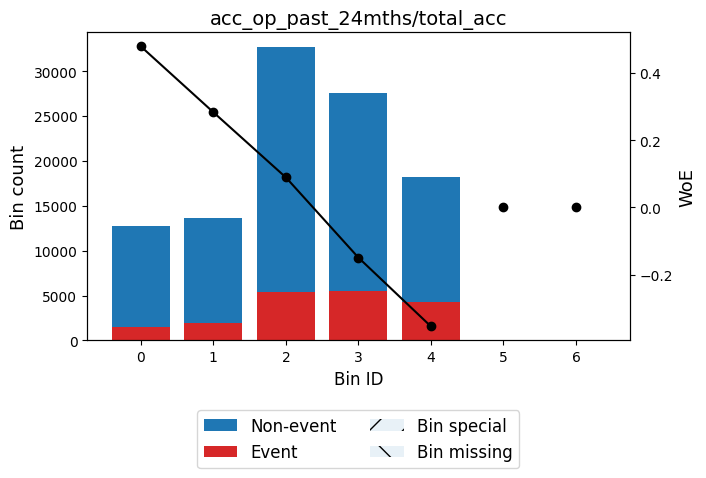


🔍 Feature: bc_open_to_buy/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: bc_open_to_buy/annual_inc
✅ Total IV for bc_open_to_buy/annual_inc: 0.0244
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5353 │             0.2341 │ -0.3406750560198113  │ 0.00658547  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.04) │   33719 │             0.1963 │ -0.11671989692924267 │ 0.00454865  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.18) │   41251 │             0.1748 │ 0.02563926691315177  │ 0.000256614 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.18, 0.42) │   17056 │             0.1566 │ 0.15761170905954547

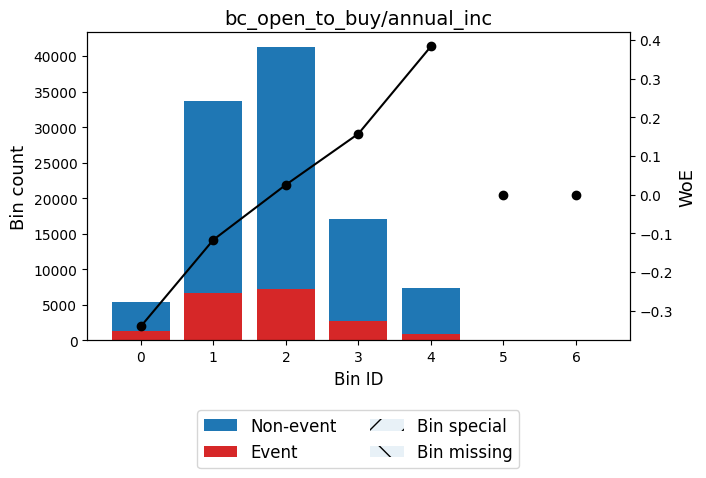


🔍 Feature: inq_last6mths_x_tl_op_past_12m
✅ Total IV for inq_last6mths_x_tl_op_past_12m: 0.0457
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   69035 │             0.159  │ 0.1397356458191068    │ 0.0122899   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 2.50) │   10171 │             0.1784 │ 0.0007730221613631016 │ 5.79778e-08 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 4.50) │   12222 │             0.2105 │ -0.2043396040775023   │ 0.00519232  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 8.50) │    7985 │             0.2361 │ -0.3517604035368507   │ 0.0105073   │
├──────────────┼─────────┼─────────────────

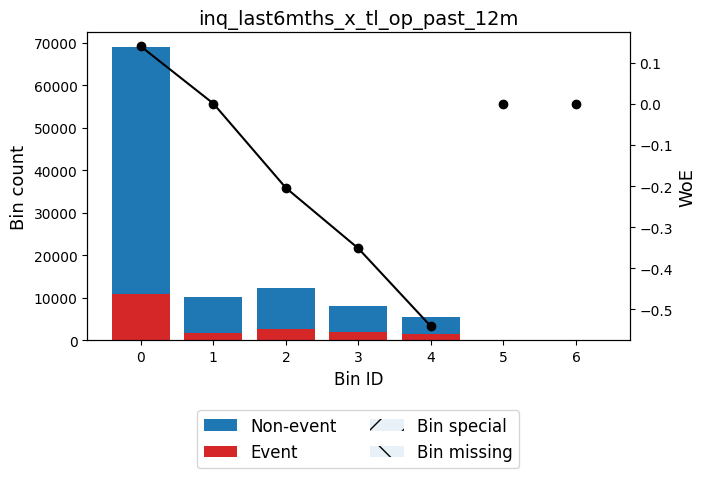


🔍 Feature: dti_x_revol_util
✅ Total IV for dti_x_revol_util: 0.0801
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 451.05)     │   24927 │             0.1261 │ 0.40951262068311745  │ 0.0348181  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [451.05, 902.94)   │   28578 │             0.1592 │ 0.1377098551590079   │ 0.00494444 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [902.94, 1314.82)  │   21007 │             0.1892 │ -0.0710521743312591  │ 0.00103511 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1314.82, 1965.88) │   19946 │             0.2182 │ -0.2501645207835541  │ 0.012879   │
├────────────────────┼─────────

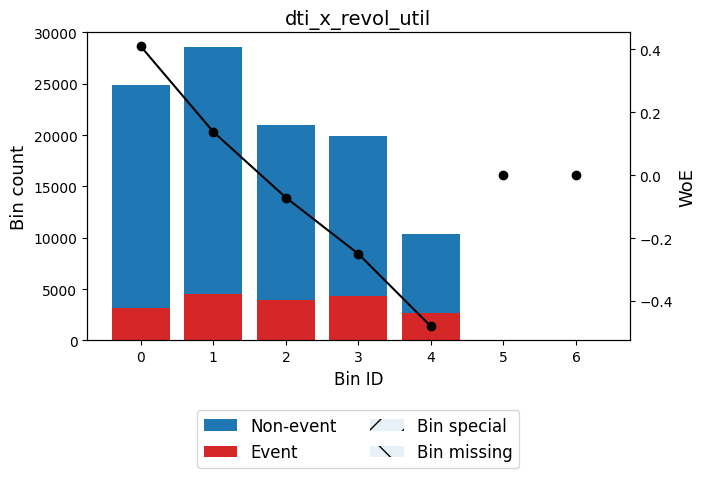


🔍 Feature: avail_ratio
✅ Total IV for avail_ratio: 0.0271
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, -96.85)   │    5422 │             0.2438 │ -0.3942801215353744  │ 0.00907543 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [-96.85, -91.15) │   10420 │             0.2063 │ -0.17895468692011351 │ 0.00336882 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [-91.15, -62.35) │   36159 │             0.19   │ -0.07625313404714573 │ 0.00205549 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [-62.35, -36.15) │   31788 │             0.1667 │ 0.08331655861795828  │ 0.00204939 │
├──────────────────┼─────────┼────────────────────┼──────────

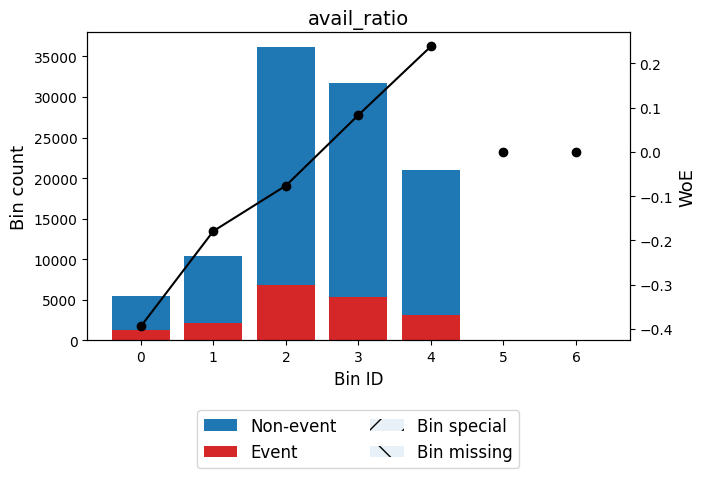


🔍 Feature: delinq2yrs_flag
✅ Total IV for delinq2yrs_flag: 0.0022
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   84449 │             0.1751 │ 0.023621249937080924 │ 0.000446187 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   20355 │             0.1928 │ -0.09437877300133724 │ 0.00178274  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────

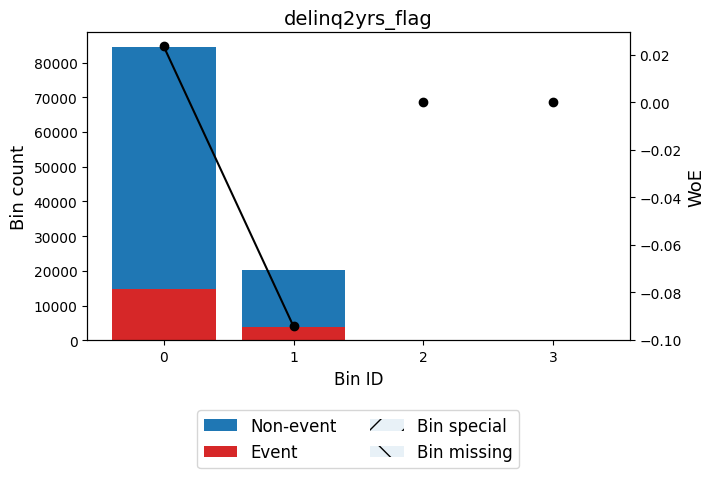


🔍 Feature: pubrec_flag
✅ Total IV for pubrec_flag: 0.0059
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   87730 │             0.1735 │ 0.034913284973516534 │ 0.00100893 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17074 │             0.2046 │ -0.16821056251890565 │ 0.00486098 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │ 

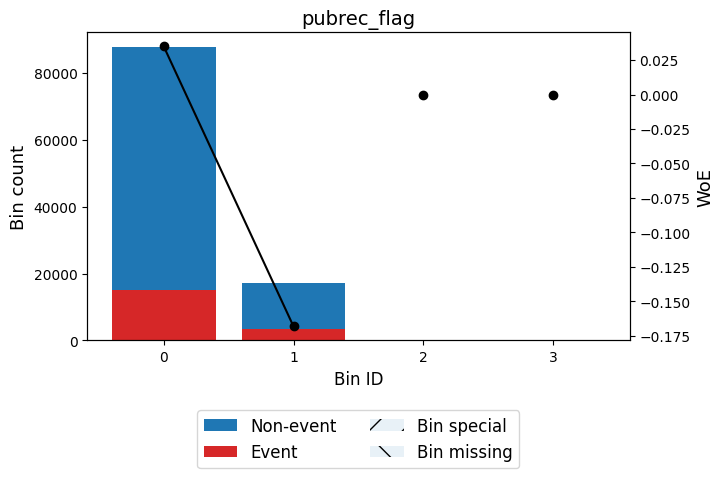


🔍 Feature: acc_now_delinq_flag
✅ Total IV for acc_now_delinq_flag: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


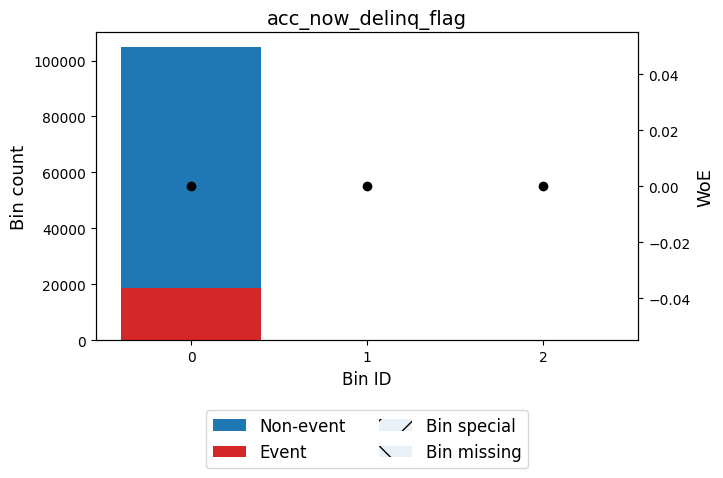


🔍 Feature: tl_op12m_x_inq6m
✅ Total IV for tl_op12m_x_inq6m: 0.0457
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   69035 │             0.159  │ 0.1397356458191068    │ 0.0122899   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 2.50) │   10171 │             0.1784 │ 0.0007730221613631016 │ 5.79778e-08 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 4.50) │   12222 │             0.2105 │ -0.2043396040775023   │ 0.00519232  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 8.50) │    7985 │             0.2361 │ -0.3517604035368507   │ 0.0105073   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼

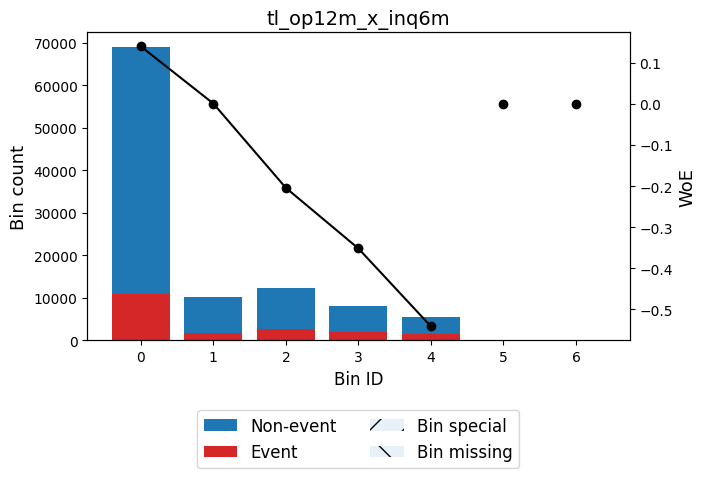


🔍 Feature: dti_x_inq
✅ Total IV for dti_x_inq: 0.0577
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 15.48)  │   72279 │             0.1572 │ 0.15332534581263357  │ 0.0154227   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [15.48, 23.56) │   11220 │             0.1881 │ -0.06402018691965261 │ 0.000447845 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23.56, 32.05) │    8543 │             0.2209 │ -0.26559091668364765 │ 0.00624648  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [32.05, 51.88) │    7360 │             0.2501 │ -0.42823357160971853 │ 0.0146748   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼───

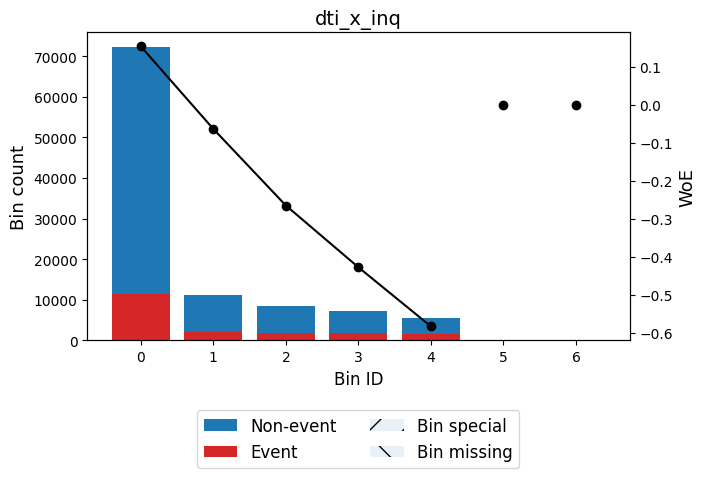


🔍 Feature: dti_x_term
✅ Total IV for dti_x_term: 0.2203
╒════════════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                 │         IV │
╞════════════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 549.90)     │   35842 │             0.1158 │ 0.5071071411427197  │ 0.0742569  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [549.90, 937.62)   │   38412 │             0.1609 │ 0.12513449830127987 │ 0.00551026 │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [937.62, 1220.58)  │   16835 │             0.2251 │ -0.2897419124787015 │ 0.0147565  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1220.58, 1460.10) │    6594 │             0.284  │ -0.6016421357139438 │ 0.0272228  │
├────────────────────┼─────────┼────────────────────┼

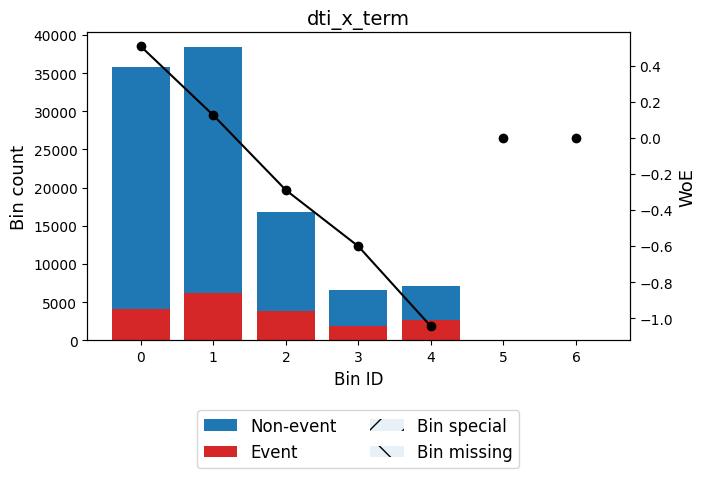


🔍 Feature: term_x_revol_util
✅ Total IV for term_x_revol_util: 0.1220
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 582.60)     │    6828 │             0.1134 │ 0.530781262175795    │ 0.0153727  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [582.60, 1829.40)  │   34976 │             0.1436 │ 0.25924831731314213  │ 0.020598   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1829.40, 2866.80) │   35057 │             0.1716 │ 0.048365354865761434 │ 0.00077034 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2866.80, 3598.20) │   16276 │             0.1942 │ -0.10286052243256094 │ 0.00169775 │
├────────────────────┼───────

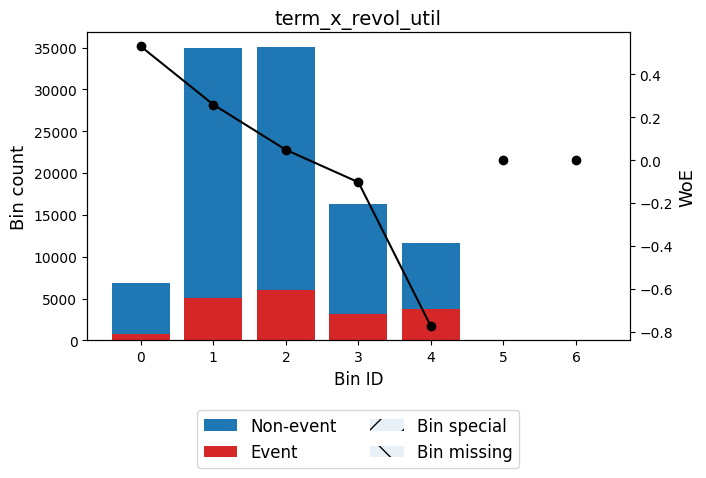


🔍 Feature: dti/fico_ratio_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: dti/fico_ratio
✅ Total IV for dti/fico_ratio: 0.1081
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.02) │   32170 │             0.1247 │ 0.42298993615522185  │ 0.0477223  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.02, 0.03) │   25414 │             0.1637 │ 0.10490868486118954  │ 0.00257946 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.04) │   29055 │             0.1982 │ -0.12838694908896175 │ 0.00475955 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.04, 0.05) │   12661 │             0.2478 │ -0.41599708291507365 │ 0.0237389  │
├──────────────┼─────────

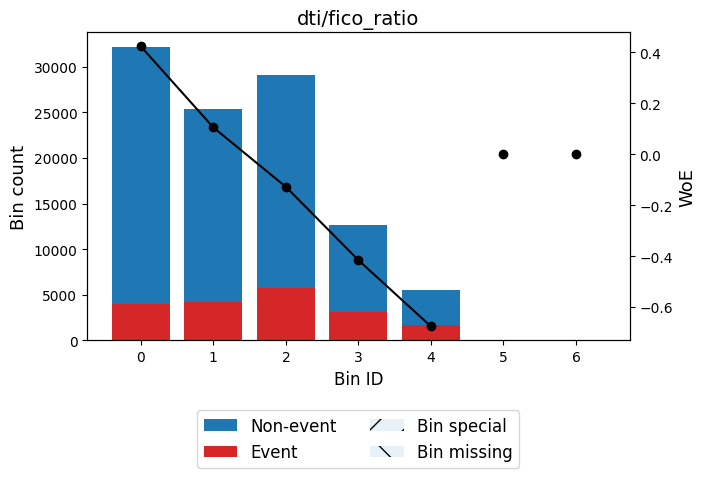


🔍 Feature: loan_amnt/tot_hi_cred_lim_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/tot_hi_cred_lim
✅ Total IV for loan_amnt/tot_hi_cred_lim: 0.0703
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │    8417 │             0.1103 │ 0.5620374696470245   │ 0.0210212  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.06) │   18448 │             0.1311 │ 0.36492399619971194  │ 0.0207742  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.06, 0.11) │   27234 │             0.1682 │ 0.07251608483628624  │ 0.00133478 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.11, 0.23) │   24849 │             0.2006 │ -0.1433947460347318  │ 0.005

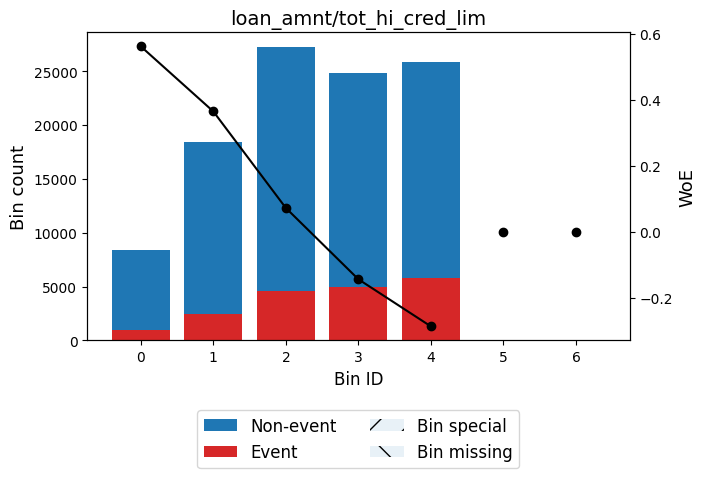


🔍 Feature: bc_open_to_buy/total_rev_hi_lim_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: bc_open_to_buy/total_rev_hi_lim
✅ Total IV for bc_open_to_buy/total_rev_hi_lim: 0.0394
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.01) │    6277 │             0.241  │ -0.37912813712930715 │ 0.00967199 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.01, 0.19) │   41588 │             0.2001 │ -0.14048811000854844 │ 0.00818824 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.19, 0.44) │   35951 │             0.1669 │ 0.08188195780808338  │ 0.0022397  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.44, 0.71) │   15740 │             0.1436 │ 0.25920437

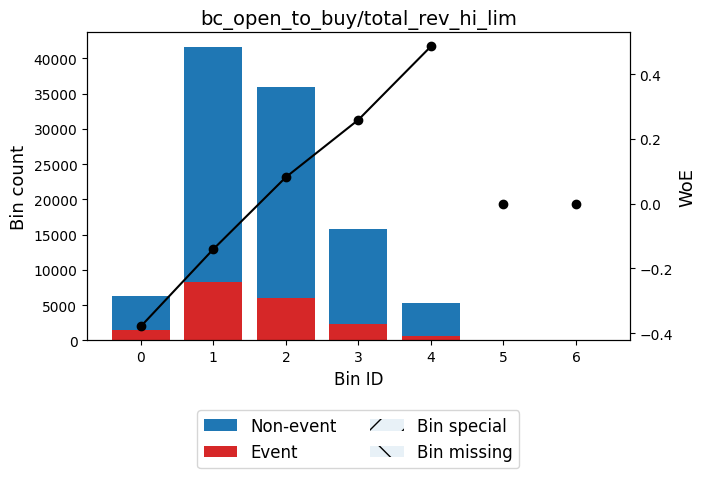


🔍 Feature: fico_score/int_rate_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: fico_score/int_rate
✅ Total IV for fico_score/int_rate: 0.4354
╒═════════════════╤═════════╤════════════════════╤══════════════════════╤═══════════╕
│ Bin             │   Count │   Default Rate (%) │ WOE                  │        IV │
╞═════════════════╪═════════╪════════════════════╪══════════════════════╪═══════════╡
│ (-inf, 40.76)   │   21094 │             0.3294 │ -0.8151433035812025  │ 0.168699  │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [40.76, 57.85)  │   37993 │             0.1966 │ -0.11836921576368487 │ 0.0052738 │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [57.85, 76.01)  │   21558 │             0.1273 │ 0.3986456914513574   │ 0.0286409 │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [76.01, 104.87) │   16670 │             0.0781 │ 0.942264527863736    │ 0.

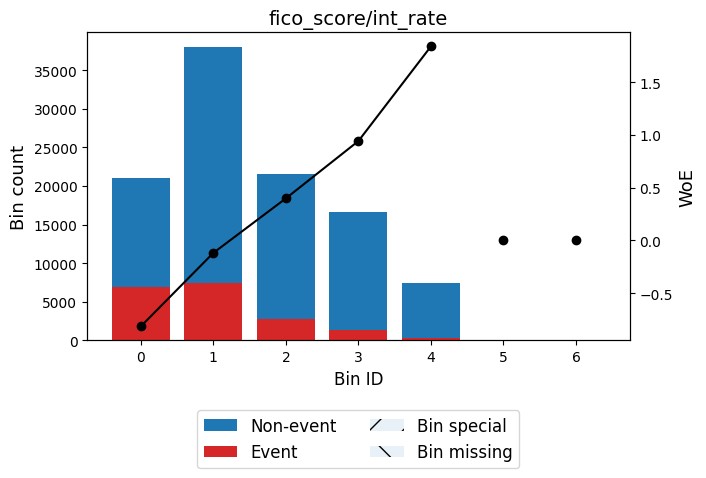


🔍 Feature: installment/annual_inc/12
✅ Total IV for installment/annual_inc/12: 0.0921
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │   10601 │             0.1092 │ 0.5724579933139866   │ 0.0273685  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.05) │   18263 │             0.1337 │ 0.34287223137223966  │ 0.0182913  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.05, 0.08) │   26479 │             0.1613 │ 0.12220409901808682  │ 0.00362612 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.08, 0.10) │   21761 │             0.1933 │ -0.09758931425460005 │ 0.00203982 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───

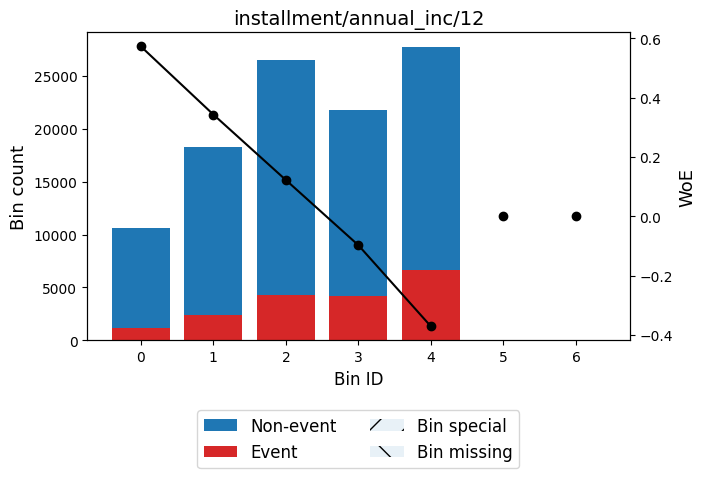


🔍 Feature: installment/annual_inc/12_x_term
✅ Total IV for installment/annual_inc/12_x_term: 0.2169
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 1.82) │   25704 │             0.1103 │ 0.5612225909157016  │ 0.0640269  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1.82, 3.40) │   35100 │             0.1439 │ 0.2573530638778061  │ 0.0203828  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [3.40, 4.56) │   18167 │             0.1894 │ -0.0722688416849604 │ 0.00092645 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [4.56, 6.85) │   20021 │             0.2563 │ -0.460732079080052  │ 0.0466359  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼

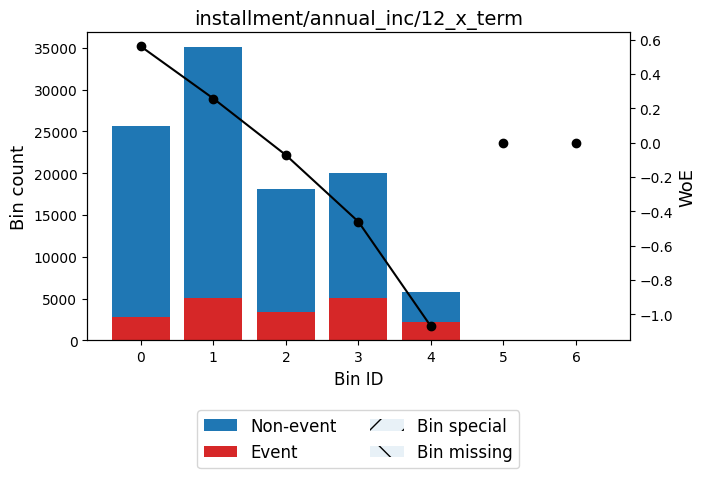

✅ Total IV for grade_numeric: 0.4525
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 1.50) │   18877 │             0.0546 │ 1.325128834626995   │ 0.201688   │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1.50, 2.50) │   31160 │             0.1206 │ 0.4609103760436568  │ 0.0541789  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [2.50, 3.50) │   28917 │             0.2002 │ -0.1412528792558112 │ 0.00575698 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [3.50, 4.50) │   15265 │             0.2702 │ -0.5326451391036483 │ 0.0484834  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [4.50, inf)  │   10585 │             0.3789 │ -1

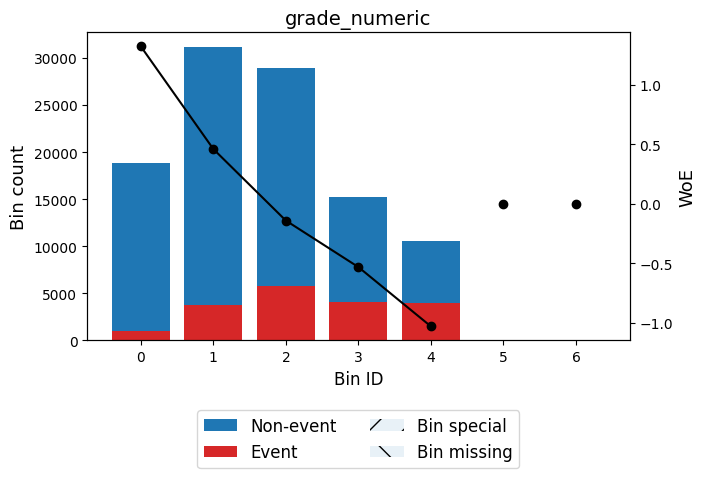

In [102]:
# ========================================== Train - Test Split ==========================================
numerical_cols1 = get_numerical_cols(df1, TARGET_COL)

train_df1 , test_df1 = sample_split_order(initial_df=df1, sample_frac=0.1, cut_off_date=CUT_DATE, date_col='issue_d')

# == Observe IV of Numerical Variables == 
for feature in numerical_cols1:
    if feature == "id":
        continue

    print(f"\n🔍 Feature: {feature}")

    if train_df1[feature].nunique() < 2:
        print("⚠️ Not enough variation. Skipping.")
        iv_categories["no_variation"].append(feature)
        continue

    x, y = train_df1[feature], train_df1[TARGET_COL]
    first_bin_and_classify_feature(feature=feature, x=x, y=y, monotonic_trend_type='auto')

    
train_df1 = tx_grade(train_df1)

first_bin_and_classify_feature('grade_numeric', train_df1['grade_numeric'], train_df1[TARGET_COL], dtype='numerical',monotonic_trend_type='auto' )


### 2.2 Categorical Features IV 

✅ Total IV for home_ownership: 0.0191
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ ['MORTGAGE']     │   52035 │             0.1595 │ 0.13577182825312417  │ 0.00875683  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ ['OWN']          │   10814 │             0.1765 │ 0.013912018181872599 │ 1.98813e-05 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ ['OTHER' 'RENT'] │   41955 │             0.2027 │ -0.1567237930897296  │ 0.0103321   │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special          │       0 │             0      │ 0.0                  │ 0           │
├──────────────────┼─────────┼────────────────────┼─────────────────────

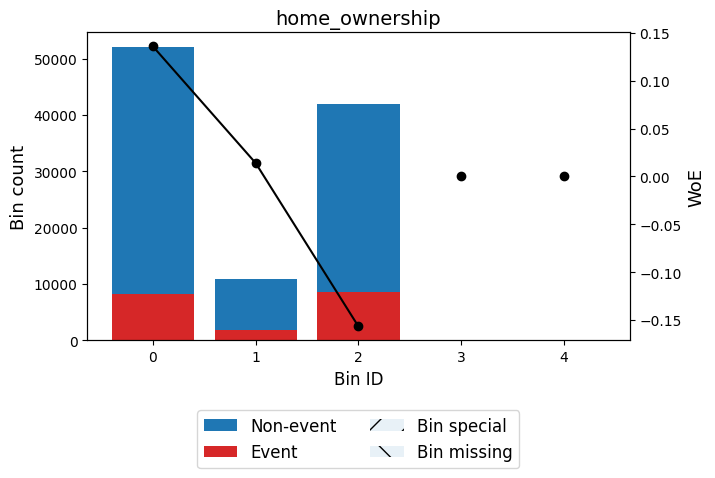

✅ Total IV for verification_status: 0.0523
╒═════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                 │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ ['Not Verified']    │   31272 │             0.131  │ 0.36592108062639706  │ 0.0353959  │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['Source Verified'] │   40129 │             0.1879 │ -0.06269531681687956 │ 0.00153549 │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['Verified']        │   33403 │             0.2118 │ -0.21205578570440453 │ 0.0153188  │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special             │       0 │             0      │ 0.0                  │ 0          │
├─────────────────────┼─────────┼──────────────

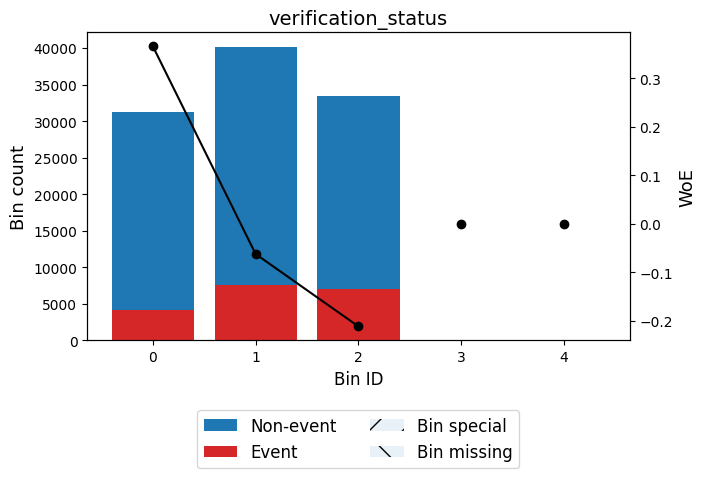

✅ Total IV for initial_list_status: 0.0005
╒═════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin     │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ ['f']   │   48197 │             0.175  │ 0.024256915944856905  │ 0.000268484 │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ ['w']   │   56607 │             0.1816 │ -0.020358927477206246 │ 0.00022534  │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ Special │       0 │             0      │ 0.0                   │ 0           │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ Missing │       0 │             0      │ 0.0                   │ 0           │
├─────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│         │  104804 │             0.1786 │                       │

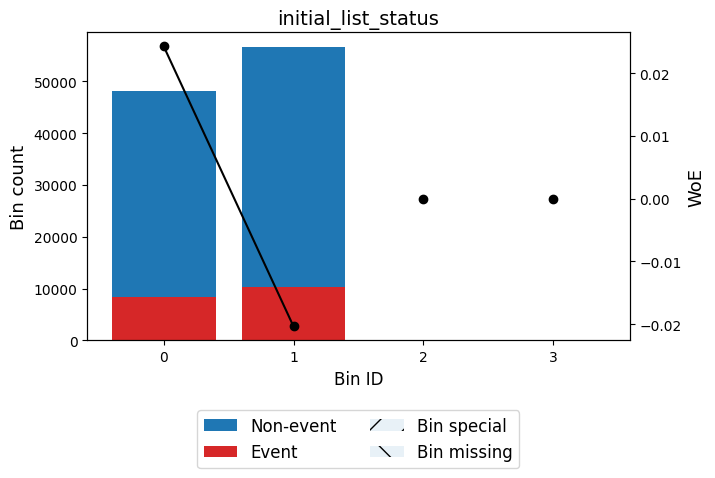

✅ Total IV for application_type: 0.0000
╒════════════════════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin                        │   Count │   Default Rate (%) │ WOE   │   IV │
╞════════════════════════════╪═════════╪════════════════════╪═══════╪══════╡
│ ['Individual' 'Joint App'] │  104804 │             0.1786 │ 0.0   │    0 │
├────────────────────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special                    │       0 │             0      │ 0.0   │    0 │
├────────────────────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing                    │       0 │             0      │ 0.0   │    0 │
├────────────────────────────┼─────────┼────────────────────┼───────┼──────┤
│                            │  104804 │             0.1786 │       │    0 │
╘════════════════════════════╧═════════╧════════════════════╧═══════╧══════╛


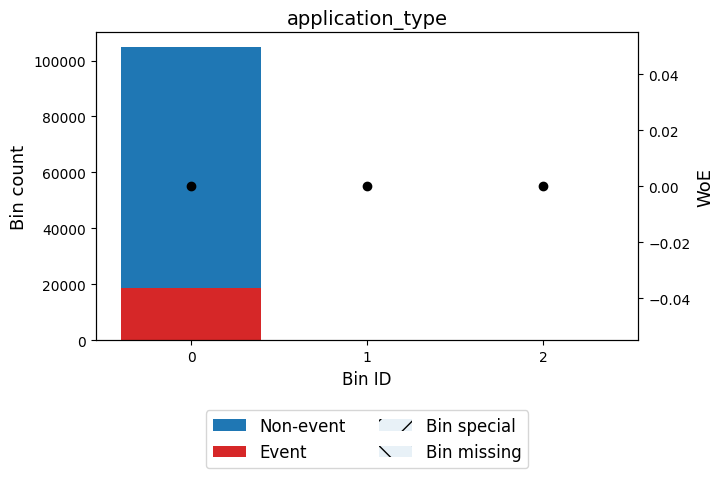

In [103]:
# == Observe IV of Categorical Variables == 
categorical_features = get_categorical_cols(df1, TARGET_COL)

for feat in categorical_features: 
    if feat != 'grade': 
        first_bin_and_classify_feature(feat, train_df1[feat], train_df1[TARGET_COL], dtype='categorical', monotonic_trend_type='auto')


### 2.3 Feature Importance Rankings

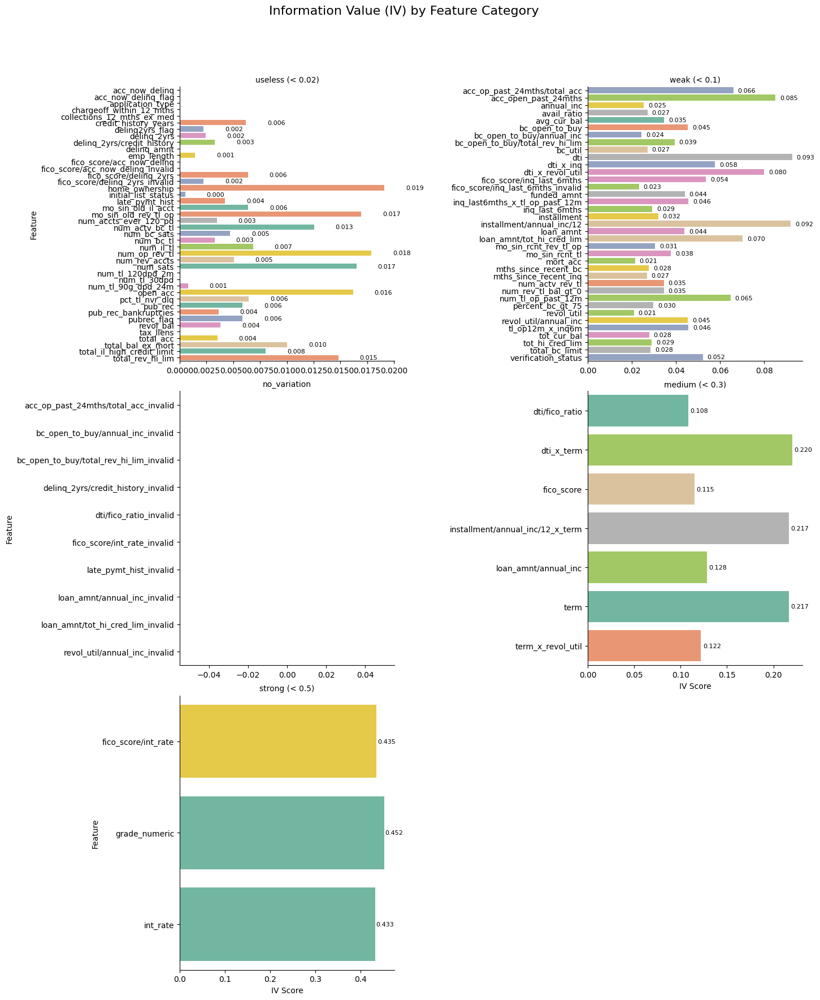

In [104]:
plot_iv_by_category(iv_categories)

train_pdf has 104804 rows, 102 columns
test_pdf has 25595 rows, 102 columns

🔍 Feature: loan_amnt
✅ Total IV for loan_amnt: 0.0439
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 9012.50)      │   32459 │             0.1393 │ 0.2953902145473486   │ 0.024518   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [9012.50, 10012.50)  │    9914 │             0.1616 │ 0.12032605133461671  │ 0.00131706 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [10012.50, 16037.50) │   26433 │             0.1884 │ -0.06593414678660947 │ 0.00111978 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [16037.50, 28012.50) │   27131 │       

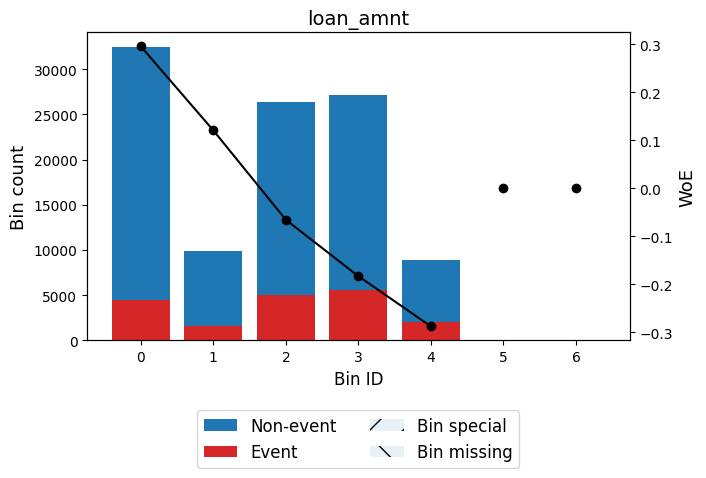


🔍 Feature: funded_amnt
✅ Total IV for funded_amnt: 0.0440
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 9012.50)      │   32478 │             0.1392 │ 0.29555611794296244  │ 0.0245585  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [9012.50, 10012.50)  │    9912 │             0.1616 │ 0.12008540640504739  │ 0.00131164 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [10012.50, 16037.50) │   26464 │             0.1883 │ -0.0652318656606301  │ 0.00109709 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [16037.50, 28012.50) │   27106 │             0.2072 │ -0.18437789106601365 │ 0.00931823 │
├────────────────────

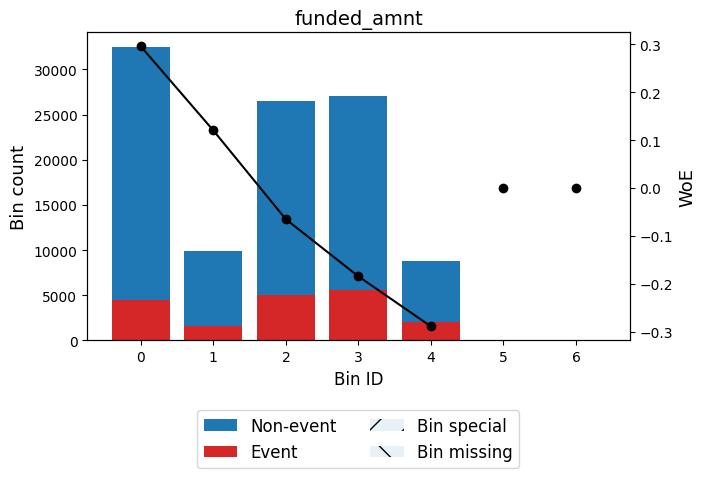


🔍 Feature: term
✅ Total IV for term: 0.2166
╒═══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                 │        IV │
╞═══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 48.00) │   79741 │             0.1378 │ 0.3073841596637701  │ 0.0649606 │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [48.00, inf)  │   25063 │             0.3082 │ -0.7174954188198741 │ 0.151631  │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│               │  104804 │             0.

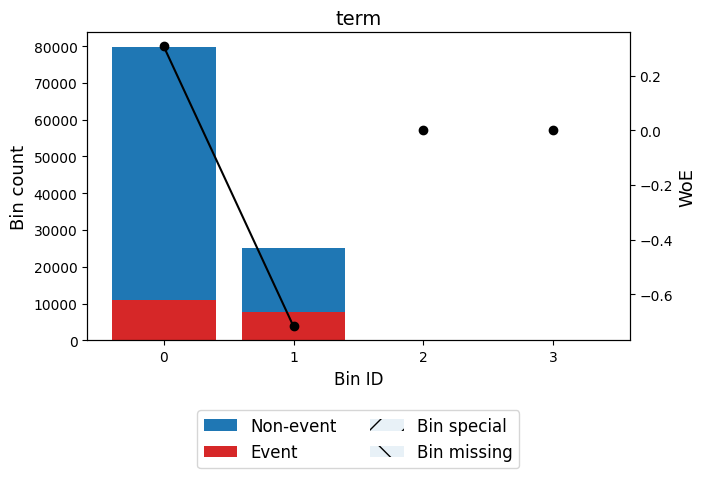


🔍 Feature: int_rate
✅ Total IV for int_rate: 0.4326
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 8.12)   │   16382 │             0.0508 │ 1.4005966108748313   │ 0.190623    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8.12, 11.47)  │   23054 │             0.1106 │ 0.5584052760752933   │ 0.0569058   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.47, 14.44) │   29390 │             0.1721 │ 0.04493867784232952  │ 0.000558164 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14.44, 18.82) │   24231 │             0.2461 │ -0.40654416863435827 │ 0.0432733   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────

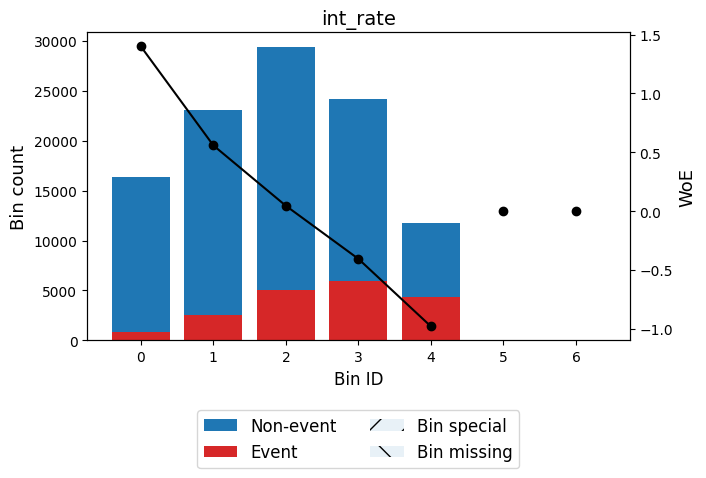


🔍 Feature: installment
✅ Total IV for installment: 0.0320
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 193.38)   │   16132 │             0.131  │ 0.3656389768139452   │ 0.018233    │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [193.38, 251.58) │    9826 │             0.1502 │ 0.20680445886834153  │ 0.00374731  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [251.58, 337.48) │   18833 │             0.1732 │ 0.03731917912488525  │ 0.000247273 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [337.48, 877.63) │   52881 │             0.1962 │ -0.11575526149515092 │ 0.00701403  │
├──────────────────┼─────────┼────────────────────┼

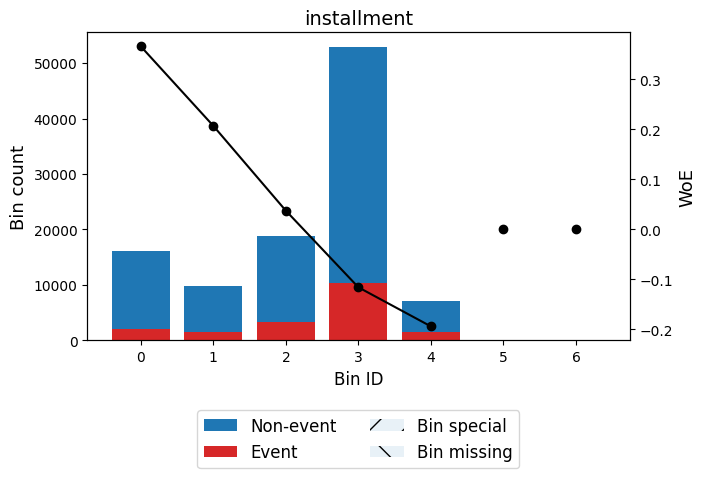


🔍 Feature: emp_length
✅ Total IV for emp_length: 0.0014
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   14983 │             0.1821 │ -0.023756076817281757 │ 8.12978e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 3.50) │   17856 │             0.1717 │ 0.04784996448491641   │ 0.000384113 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 4.50) │    6213 │             0.163  │ 0.10962104650469318   │ 0.000687467 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 5.50) │    6524 │             0.1763 │ 0.015689214001998852  │ 1.52456e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼────────────

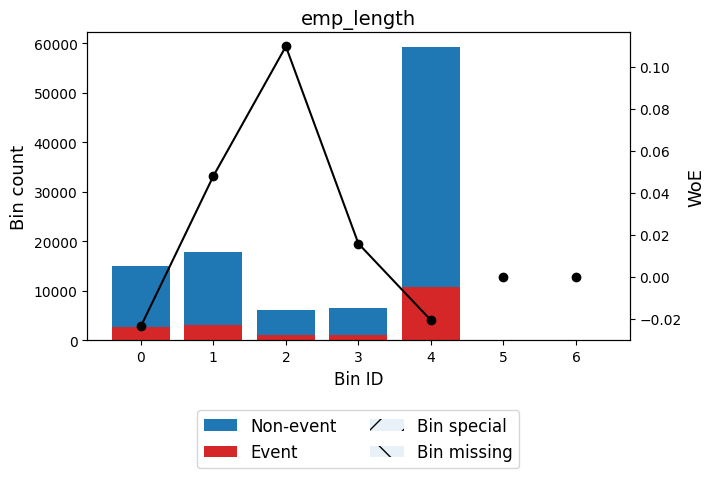


🔍 Feature: annual_inc
✅ Total IV for annual_inc: 0.0254
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 45752.50)      │   26224 │             0.2046 │ -0.16846653812055346 │ 0.00748933 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [45752.50, 75642.10)  │   40181 │             0.1869 │ -0.05586898532613804 │ 0.00121826 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [75642.10, 96006.00)  │   16185 │             0.1648 │ 0.0964976706321714   │ 0.00139372 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [96006.00, 125887.00) │   12394 │             0.152  │ 0.19280865491854637  │ 0.0041277  │
├────────────

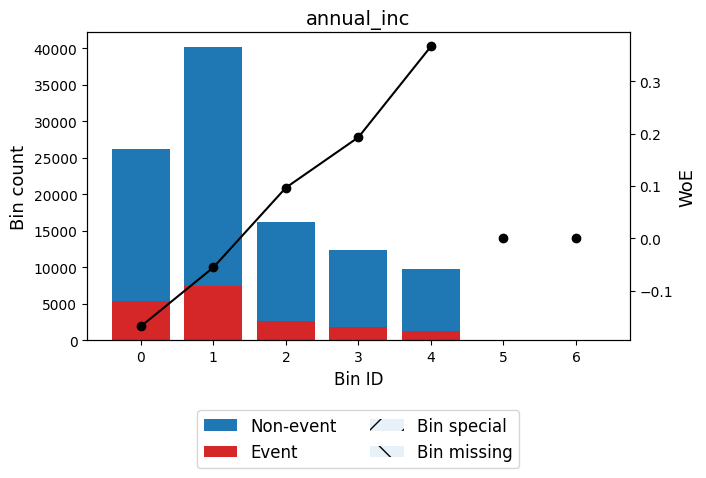


🔍 Feature: dti
✅ Total IV for dti: 0.0927
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 12.78)  │   29974 │             0.1266 │ 0.4054535351527895   │ 0.0410986  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [12.78, 18.57) │   26632 │             0.1634 │ 0.10720723980058411  │ 0.00282071 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [18.57, 26.05) │   28396 │             0.1955 │ -0.11159107621802877 │ 0.00349571 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [26.05, 32.85) │   14516 │             0.2413 │ -0.38028839683951254 │ 0.0225118  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [32.85, i

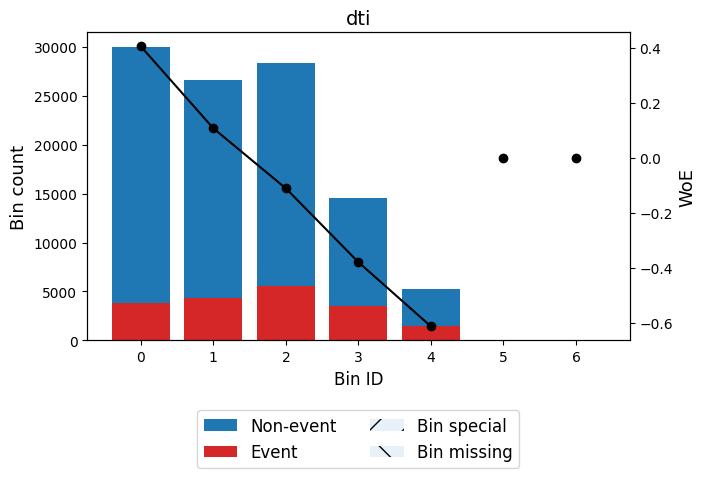


🔍 Feature: delinq_2yrs
✅ Total IV for delinq_2yrs: 0.0024
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   84449 │             0.1751 │ 0.023621249937080924 │ 0.000446187 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 1.50) │   13415 │             0.1895 │ -0.07278987456779196 │ 0.00069413  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, inf)  │    6940 │             0.1993 │ -0.13531801220097894 │ 0.00126565  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Miss

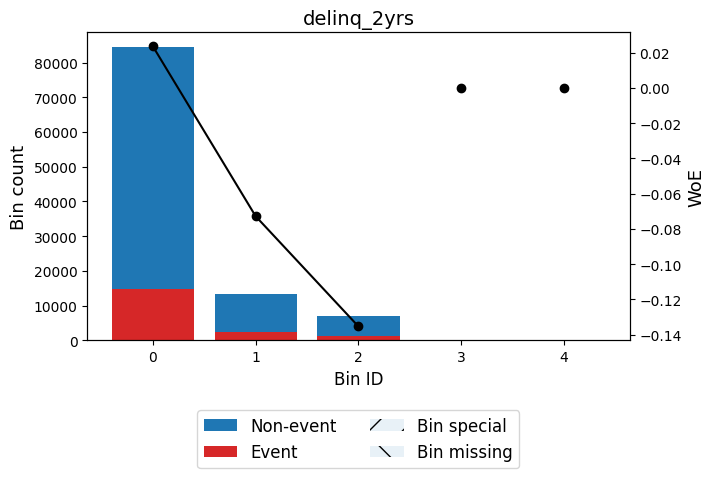


🔍 Feature: inq_last_6mths
✅ Total IV for inq_last_6mths: 0.0293
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   59397 │             0.1589 │ 0.1402112562715041   │ 0.0106445  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   28829 │             0.1909 │ -0.08184613362490567 │ 0.00189138 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   10780 │             0.2191 │ -0.2552578012429336  │ 0.00725807 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, inf)  │    5798 │             0.2432 │ -0.3908375157932351  │ 0.00952657 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special  

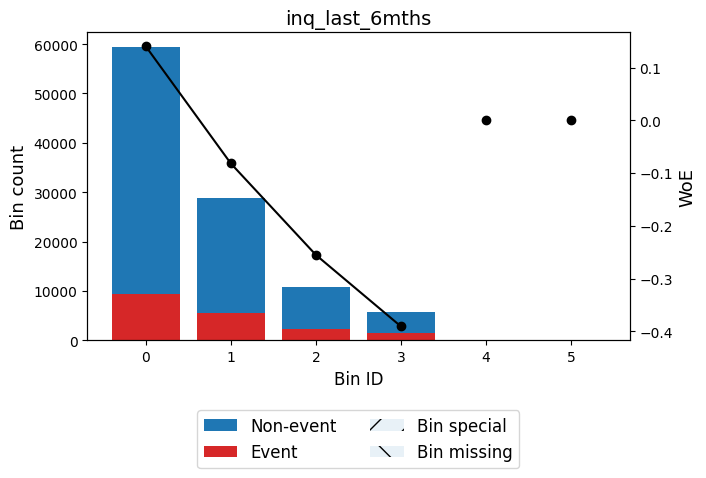


🔍 Feature: open_acc
✅ Total IV for open_acc: 0.0162
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 5.50)   │    8822 │             0.1429 │ 0.2649770457772085   │ 0.00541719  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 7.50)   │   14626 │             0.1596 │ 0.13524375658773202  │ 0.00244268  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.50, 11.50)  │   35739 │             0.1726 │ 0.04090632350026069  │ 0.000563135 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 17.50) │   32144 │             0.1898 │ -0.07502732080408325 │ 0.00176829  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────

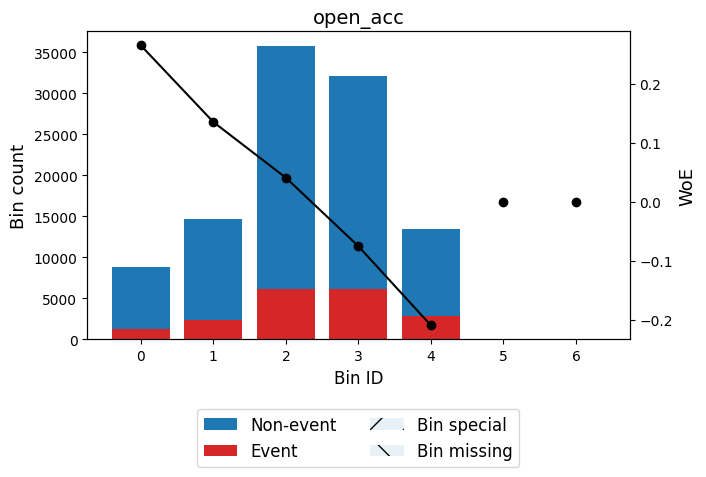


🔍 Feature: pub_rec
✅ Total IV for pub_rec: 0.0059
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   87730 │             0.1735 │ 0.034913284973516534 │ 0.00100893 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17074 │             0.2046 │ -0.16821056251890565 │ 0.00486098 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │  104804 

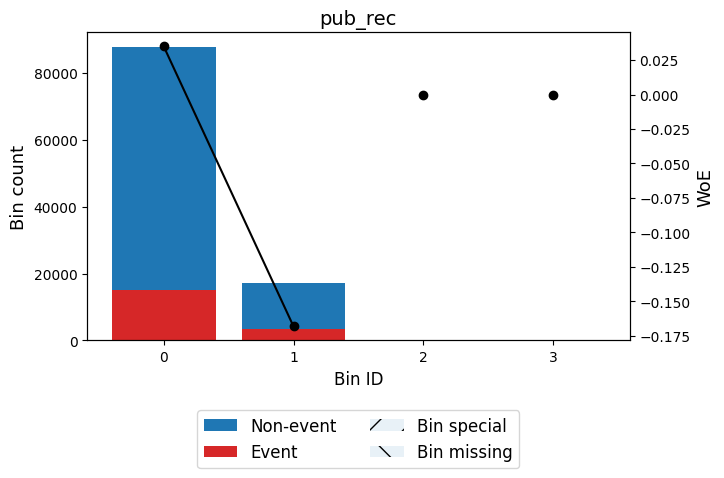


🔍 Feature: revol_bal
✅ Total IV for revol_bal: 0.0038
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 2782.50)      │    8339 │             0.1626 │ 0.11281808052955244  │ 0.00097629  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2782.50, 12141.50)  │   46900 │             0.1783 │ 0.001825780753195172 │ 1.49086e-06 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [12141.50, 22934.50) │   28035 │             0.19   │ -0.07596051952535054 │ 0.00158132  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [22934.50, 35588.00) │   12781 │             0.1768 │ 0.011887092725814119 │ 1.71663e-05 │
├──────────────

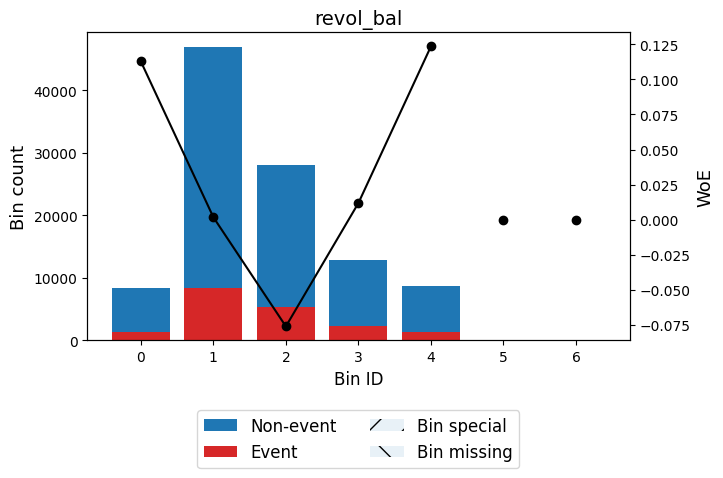


🔍 Feature: revol_util
✅ Total IV for revol_util: 0.0209
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 17.85)  │    8679 │             0.131  │ 0.3659728302516243   │ 0.00982613  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [17.85, 33.95) │   15533 │             0.1546 │ 0.17304532858408805  │ 0.00419434  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [33.95, 48.45) │   20112 │             0.1726 │ 0.04095728477881666  │ 0.000317687 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [48.45, 62.65) │   21576 │             0.1859 │ -0.04925365488626743 │ 0.000507355 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─

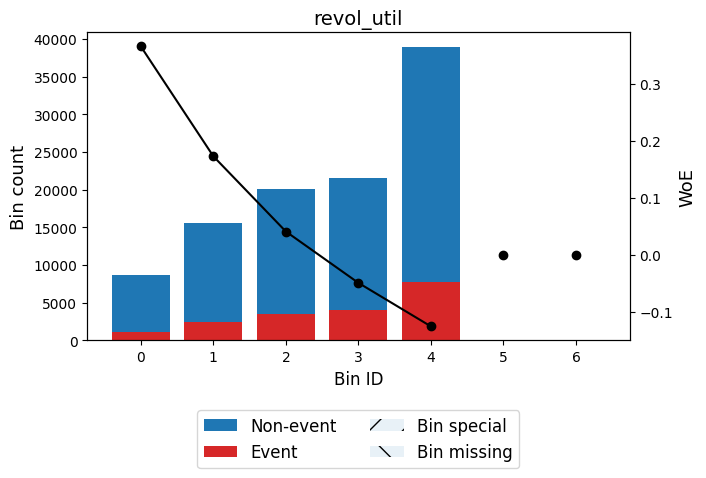


🔍 Feature: total_acc
✅ Total IV for total_acc: 0.0035
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 11.50)  │   10331 │             0.1633 │ 0.10779228126466633   │ 0.00110596  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11.50, 14.50) │    8685 │             0.1687 │ 0.0688783566195621    │ 0.000384485 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [14.50, 21.50) │   25336 │             0.1748 │ 0.02606249218814294   │ 0.000162834 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [21.50, 40.50) │   49195 │             0.1811 │ -0.017453454660826706 │ 0.000143793 │
├────────────────┼─────────┼────────────────────┼────────────────

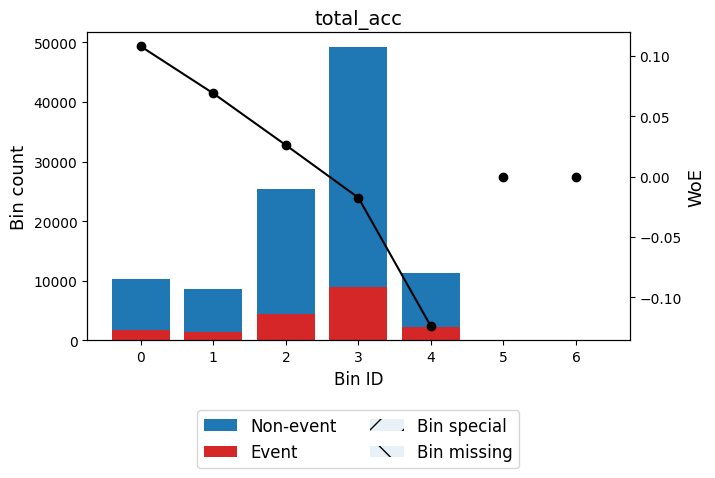


🔍 Feature: collections_12_mths_ex_med
✅ Total IV for collections_12_mths_ex_med: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


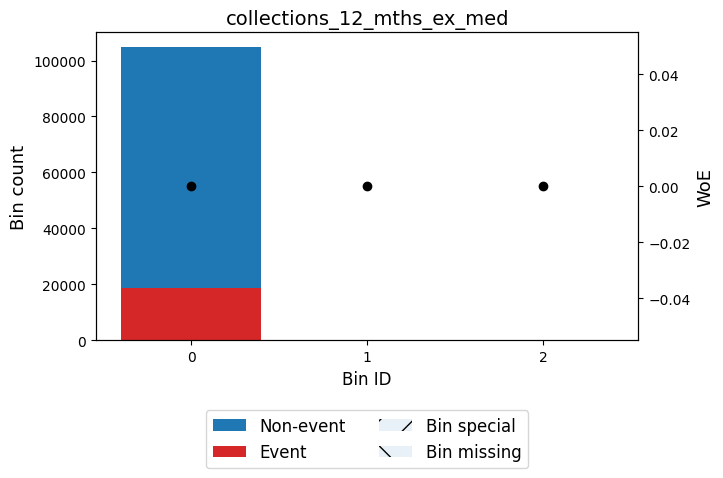


🔍 Feature: acc_now_delinq
✅ Total IV for acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


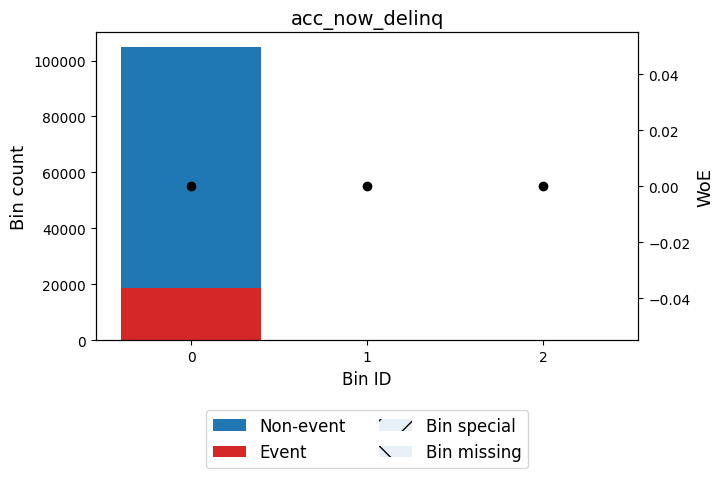


🔍 Feature: tot_cur_bal
✅ Total IV for tot_cur_bal: 0.0278
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 14981.50)      │   10231 │             0.1639 │ 0.10327117314750311  │ 0.0010068   │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14981.50, 40964.50)  │   23042 │             0.1977 │ -0.12527910215775506 │ 0.00359053  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [40964.50, 76420.50)  │   14718 │             0.2192 │ -0.2557131924021159  │ 0.00994625  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [76420.50, 210670.50) │   32477 │             0.1764 │ 0.015009305991190658 │ 6.94738e-05 │
├

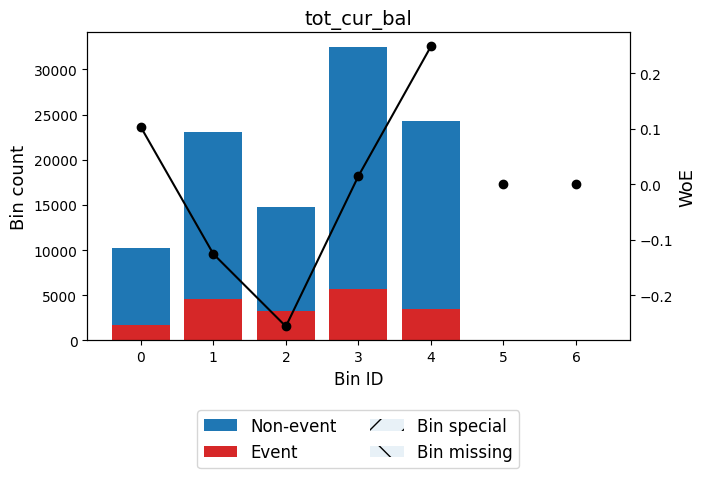


🔍 Feature: total_rev_hi_lim
✅ Total IV for total_rev_hi_lim: 0.0148
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 9025.00)      │   11098 │             0.1957 │ -0.1128013896807527  │ 0.00139655  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [9025.00, 23939.00)  │   37975 │             0.1905 │ -0.07948697578913944 │ 0.00234811  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23939.00, 50953.50) │   39892 │             0.1766 │ 0.013248538180181235 │ 6.65261e-05 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [50953.50, 82068.00) │   10565 │             0.1506 │ 0.203847404382       │ 0.0039186   │
├

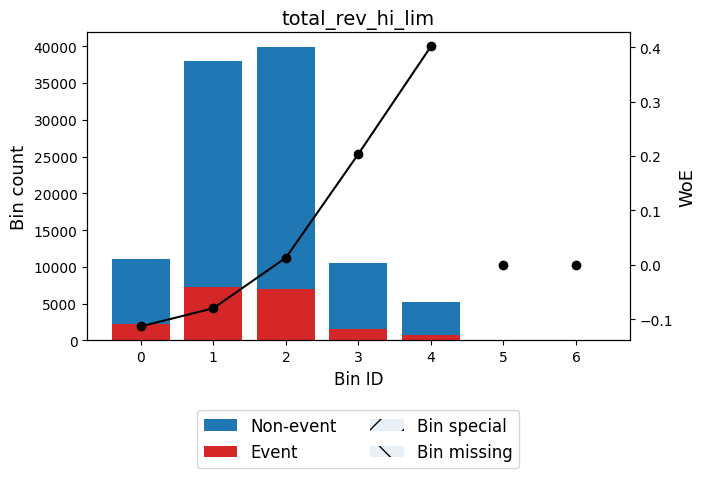


🔍 Feature: acc_open_past_24mths
✅ Total IV for acc_open_past_24mths: 0.0852
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 2.50) │   26768 │             0.1293 │ 0.38107482616704424  │ 0.0326911  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 4.50) │   33553 │             0.1615 │ 0.12116625540619697  │ 0.00451869 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, 6.50) │   21897 │             0.1946 │ -0.10597432380455207 │ 0.00242683 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [6.50, 9.50) │   15685 │             0.23   │ -0.317972138723281   │ 0.0166978  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤

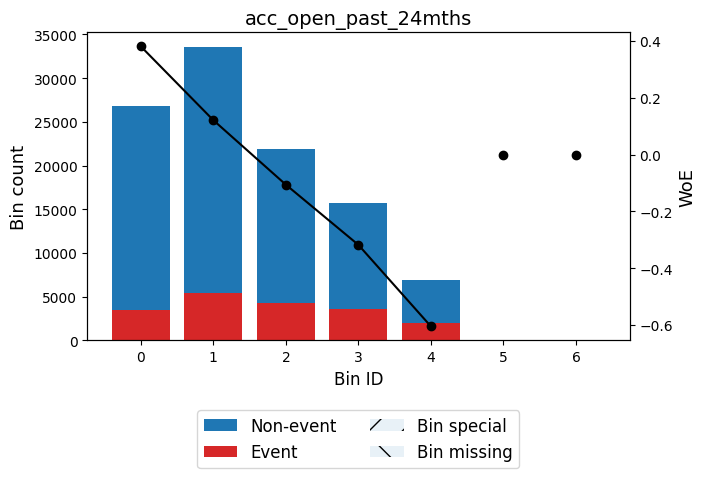


🔍 Feature: avg_cur_bal
✅ Total IV for avg_cur_bal: 0.0347
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 7248.50)      │   48575 │             0.2006 │ -0.14329738859067453  │ 0.00995894  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7248.50, 13811.50)  │   22803 │             0.1807 │ -0.014360497699876573 │ 4.5077e-05  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13811.50, 20170.00) │   11389 │             0.1654 │ 0.092299445970079     │ 0.000898482 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [20170.00, 41154.50) │   16787 │             0.1423 │ 0.27009308588729675   │ 0.0106917   │
├

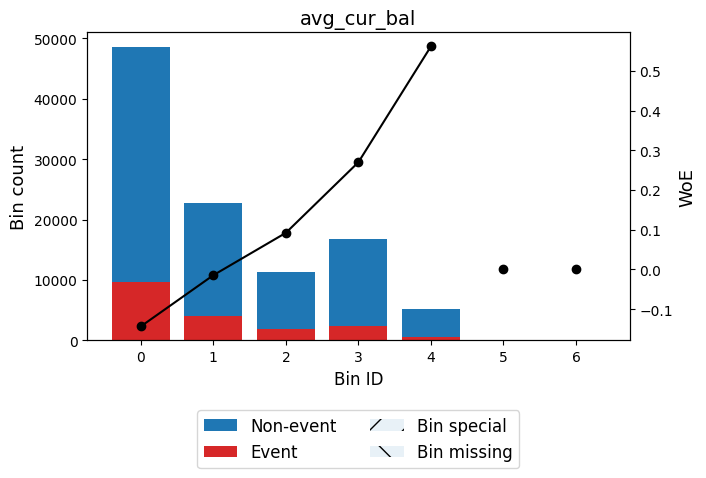


🔍 Feature: bc_open_to_buy
✅ Total IV for bc_open_to_buy: 0.0454
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 205.50)       │    6865 │             0.235  │ -0.3456081965186639  │ 0.00870457 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [205.50, 4606.50)    │   44276 │             0.1995 │ -0.13654885716582554 │ 0.00822536 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4606.50, 14251.50)  │   33576 │             0.1679 │ 0.07476340597623987  │ 0.00174791 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [14251.50, 26808.00) │   11357 │             0.1463 │ 0.2381722448796586   │ 0.00568499 │
├──────────────

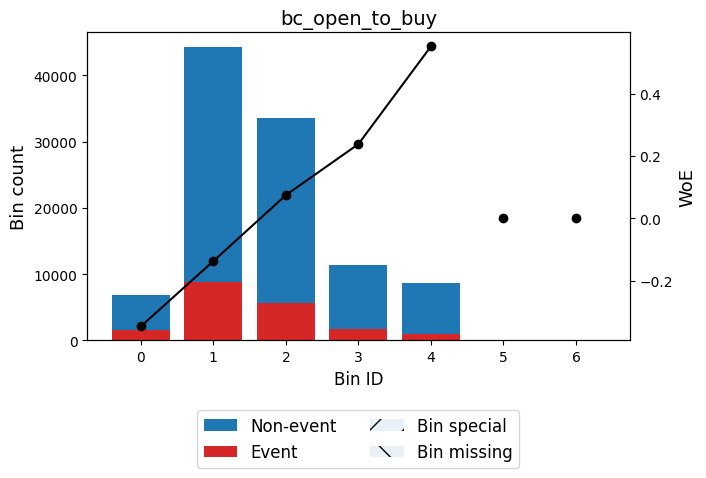


🔍 Feature: bc_util
✅ Total IV for bc_util: 0.0271
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 37.15)  │   21015 │             0.1462 │ 0.23836869617260215  │ 0.0105362  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [37.15, 63.35) │   31788 │             0.1667 │ 0.08331655861795828  │ 0.00204939 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [63.35, 92.15) │   36159 │             0.19   │ -0.07625313404714573 │ 0.00205549 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [92.15, 97.85) │   10420 │             0.2063 │ -0.17895468692011351 │ 0.00336882 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [

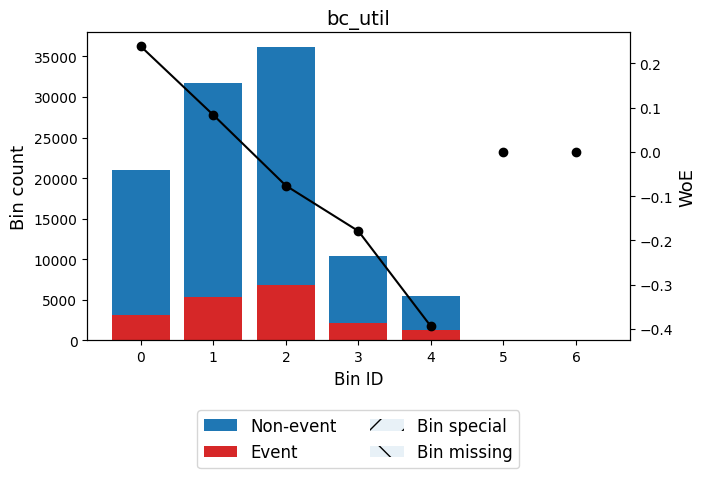


🔍 Feature: chargeoff_within_12_mths
✅ Total IV for chargeoff_within_12_mths: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


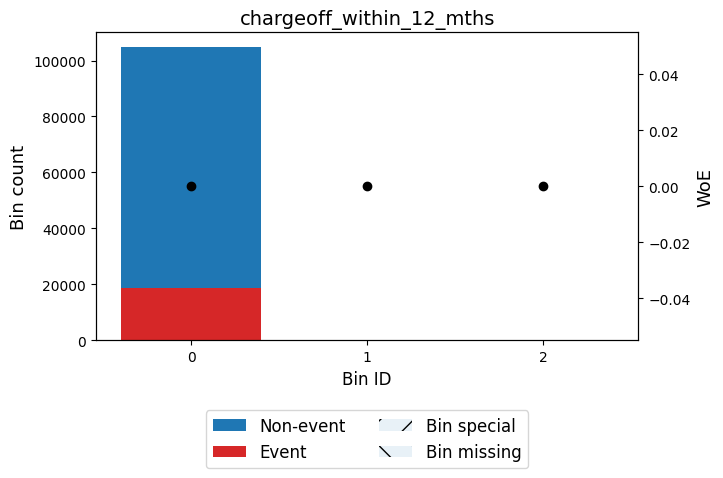


🔍 Feature: delinq_amnt
✅ Total IV for delinq_amnt: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


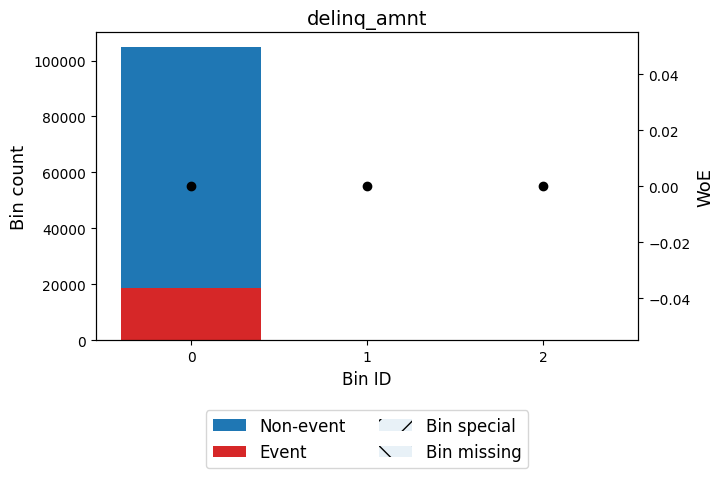


🔍 Feature: mo_sin_old_il_acct
✅ Total IV for mo_sin_old_il_acct: 0.0064
╒══════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 47.50)    │    7491 │             0.2037 │ -0.1628622311285277   │ 0.00199592  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [47.50, 127.50)  │   38153 │             0.1863 │ -0.05173159205664857  │ 0.000990482 │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [127.50, 129.50) │   11698 │             0.1557 │ 0.1647016673643773    │ 0.00286942  │
├──────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [129.50, 198.50) │   40896 │             0.1732 │ 0.036684966371827166  │ 0.000518967 │
├──────────────────┼───────

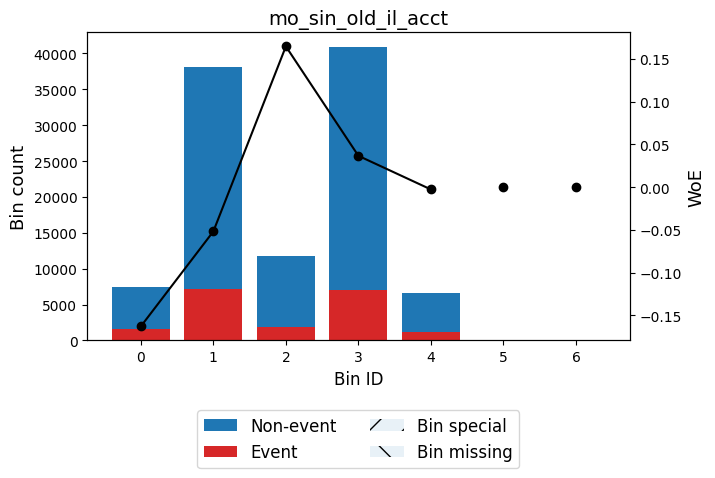


🔍 Feature: mo_sin_old_rev_tl_op
✅ Total IV for mo_sin_old_rev_tl_op: 0.0170
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 63.50)    │    6032 │             0.2291 │ -0.3127858595623554  │ 0.00620417  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [63.50, 133.50)  │   26402 │             0.1951 │ -0.10890827131286662 │ 0.00309323  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [133.50, 159.50) │   13301 │             0.1859 │ -0.04892117276534402 │ 0.000308529 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [159.50, 164.50) │    8987 │             0.1457 │ 0.24297425583470122  │ 0.00467436  │
├──────────────────┼─────────┼───

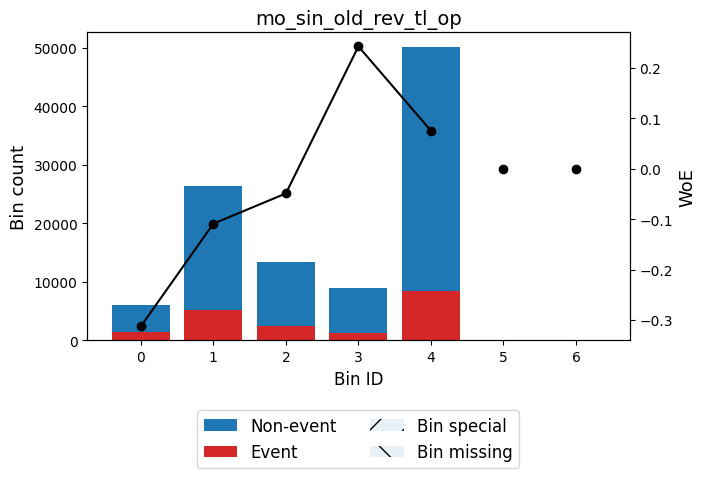


🔍 Feature: mo_sin_rcnt_rev_tl_op
✅ Total IV for mo_sin_rcnt_rev_tl_op: 0.0305
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 3.50)   │   23737 │             0.2114 │ -0.20936102826881187 │ 0.0106023  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 7.50)   │   23749 │             0.1898 │ -0.07493153105479244 │ 0.0013031  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [7.50, 21.50)  │   41073 │             0.1704 │ 0.056645994599805904 │ 0.00123471 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [21.50, 35.50) │    9070 │             0.1471 │ 0.2315814568414194   │ 0.00430184 │
├────────────────┼─────────┼────────────────────┼────────────

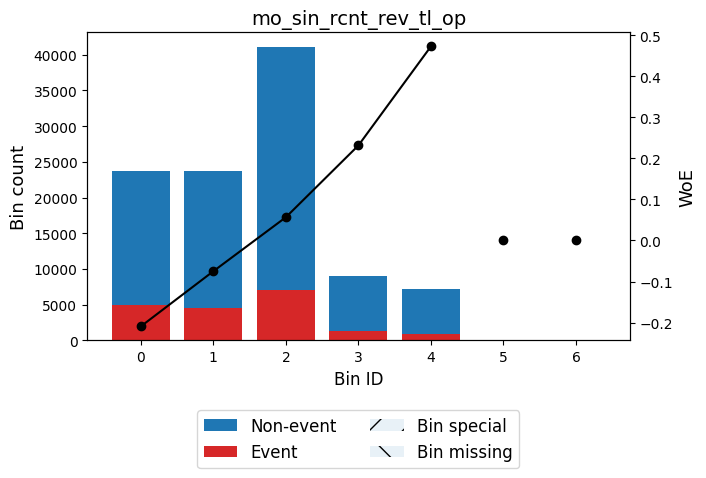


🔍 Feature: mo_sin_rcnt_tl
✅ Total IV for mo_sin_rcnt_tl: 0.0377
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50)   │   31665 │             0.2128 │ -0.2179329454495491  │ 0.0153655   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50)   │    9466 │             0.1918 │ -0.08805198615679921 │ 0.000720191 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 11.50)  │   44346 │             0.1703 │ 0.05724142054250536  │ 0.00136101  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 20.50) │   13261 │             0.1434 │ 0.26159699597057107  │ 0.00794555  │
├────────────────┼─────────┼────────────────────┼────────────────

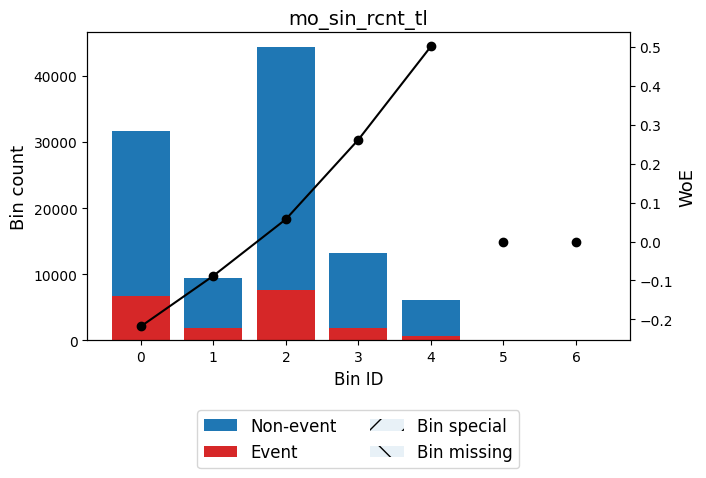


🔍 Feature: mort_acc
✅ Total IV for mort_acc: 0.0214
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   39685 │             0.203  │ -0.15830833312752235 │ 0.00997663  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 2.50) │   36235 │             0.173  │ 0.03871102064305232  │ 0.000511676 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   10892 │             0.1638 │ 0.10417376022753344  │ 0.00109034  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 5.50) │   12304 │             0.1465 │ 0.23589719268653409  │ 0.00604652  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, inf

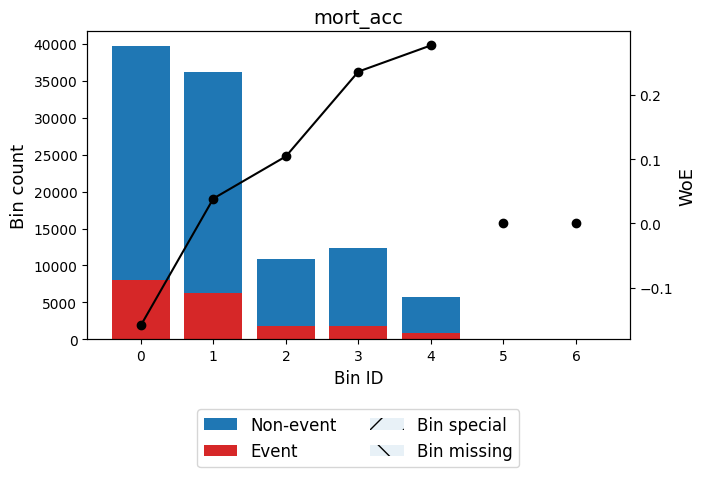


🔍 Feature: mths_since_recent_bc
✅ Total IV for mths_since_recent_bc: 0.0277
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50)   │   13533 │             0.2161 │ -0.2373711982265394  │ 0.00783685  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 12.50)  │   33181 │             0.1945 │ -0.10533950375587864 │ 0.00363278  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [12.50, 28.50) │   32889 │             0.1723 │ 0.043244238906257504 │ 0.000578718 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [28.50, 56.50) │   14265 │             0.1568 │ 0.15598022880214812  │ 0.00314738  │
├────────────────┼─────────┼────────────────────┼────

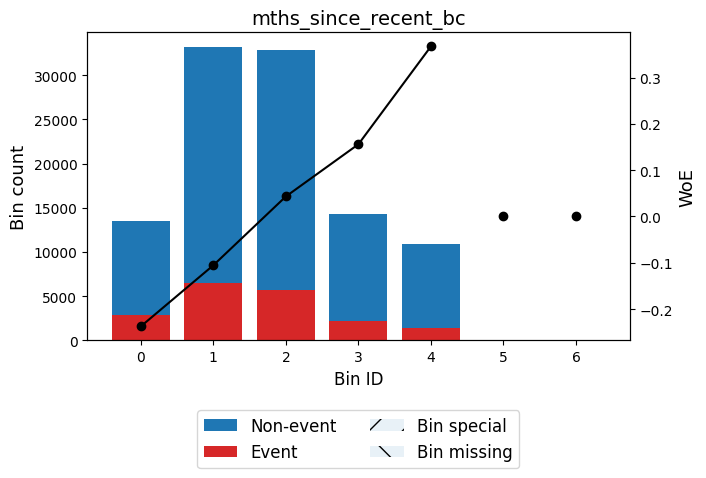


🔍 Feature: mths_since_recent_inq
✅ Total IV for mths_since_recent_inq: 0.0268
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 1.50)  │   18634 │             0.2156 │ -0.2347888011331789  │ 0.010549   │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 3.50)  │   15400 │             0.2044 │ -0.16680016693110233 │ 0.0043093  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 4.50)  │    6788 │             0.1924 │ -0.09162038678978734 │ 0.00055978 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, 14.50) │   52731 │             0.163  │ 0.11025181727874012  │ 0.00590079 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼

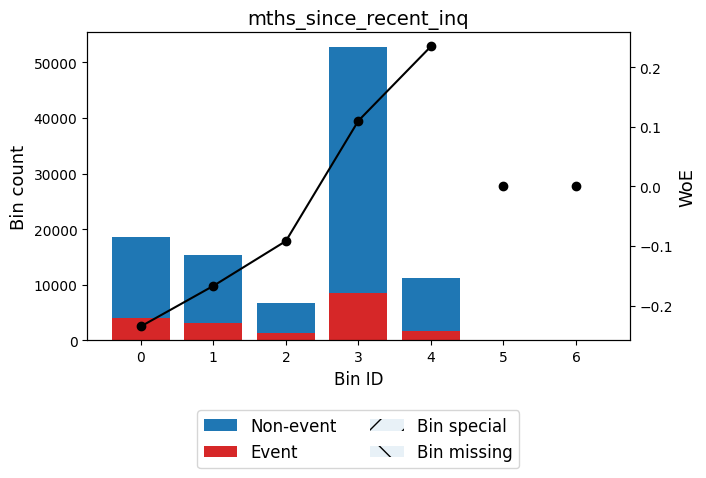


🔍 Feature: num_accts_ever_120_pd
✅ Total IV for num_accts_ever_120_pd: 0.0035
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   81603 │             0.1739 │ 0.03209372894523099  │ 0.000793733 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   23201 │             0.1949 │ -0.10795048362432214 │ 0.0026698   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─

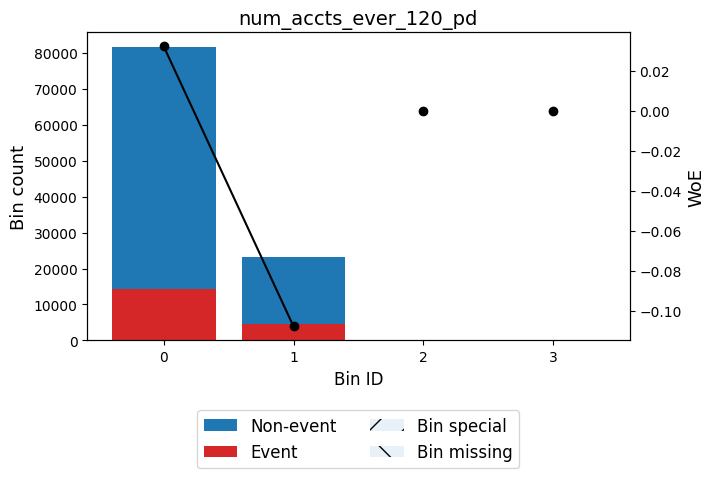


🔍 Feature: num_actv_bc_tl
✅ Total IV for num_actv_bc_tl: 0.0125
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50) │   60145 │             0.1665 │ 0.08429451476771144  │ 0.00396789  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   16625 │             0.1833 │ -0.0318280179402588  │ 0.000162342 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 5.50) │   11305 │             0.1884 │ -0.0657609395968417  │ 0.000476373 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, 6.50) │    6971 │             0.1967 │ -0.11889515665521566 │ 0.000976421 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤


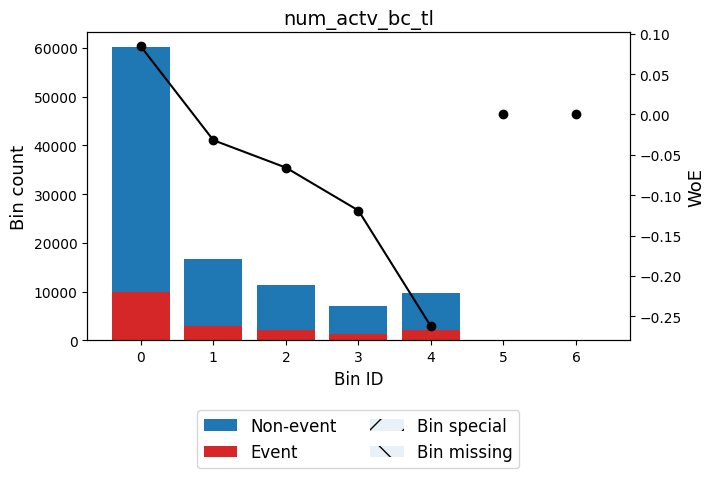


🔍 Feature: num_actv_rev_tl
✅ Total IV for num_actv_rev_tl: 0.0345
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 3.50) │   25082 │             0.1499 │ 0.2088862692085265    │ 0.00975225  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 5.50) │   36000 │             0.1664 │ 0.08511763975322362   │ 0.00242095  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 7.50) │   20923 │             0.1855 │ -0.046849633437704874 │ 0.000444803 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 9.50) │   11552 │             0.2014 │ -0.1487840482097058   │ 0.00255761  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼──

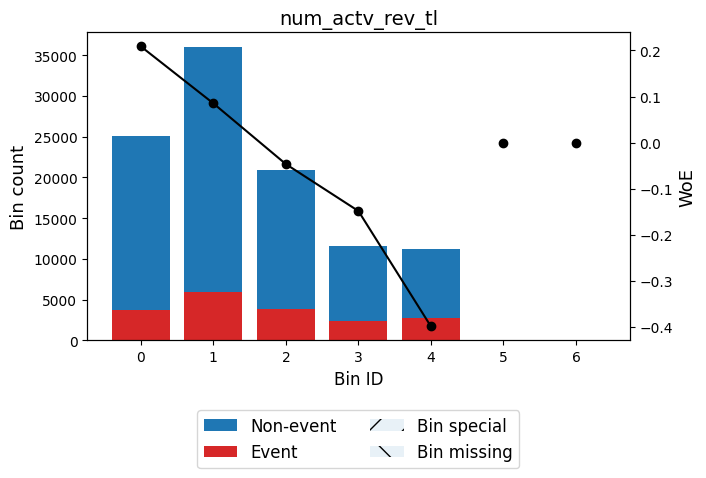


🔍 Feature: num_bc_sats
✅ Total IV for num_bc_sats: 0.0047
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 1.50) │    7011 │             0.1823 │ -0.02517875584523943 │ 4.2754e-05  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [1.50, 3.50) │   31180 │             0.1735 │ 0.034840577989741384 │ 0.000357099 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50) │   22204 │             0.1646 │ 0.09852597728148704  │ 0.00199193  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 7.50) │   30628 │             0.1854 │ -0.04606277347746168 │ 0.000629276 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [7.5

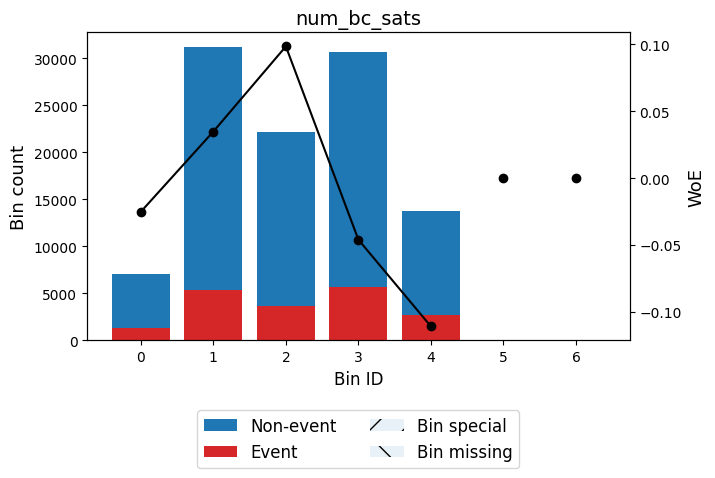


🔍 Feature: num_bc_tl
✅ Total IV for num_bc_tl: 0.0032
╒═══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 2.50)  │    5919 │             0.1921 │ -0.08965569954840813  │ 0.000467118 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 6.50)  │   34946 │             0.1817 │ -0.021309318816136846 │ 0.00015245  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)  │   15787 │             0.1615 │ 0.12126900248661054   │ 0.00212962  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 12.50) │   31709 │             0.177  │ 0.011008372455078241  │ 3.65353e-05 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼───

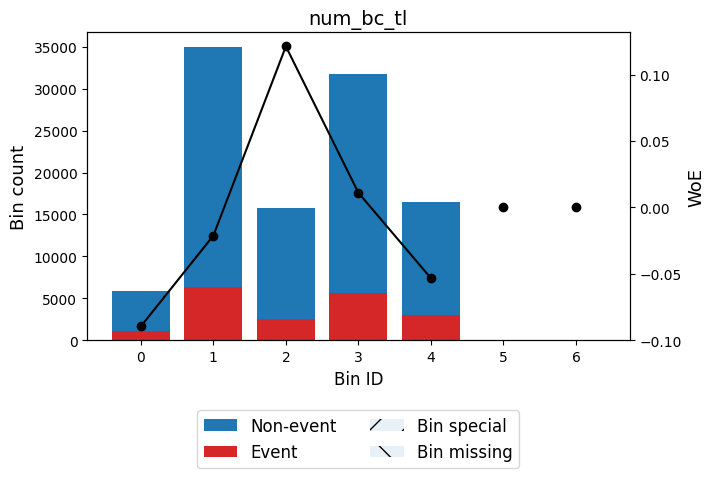


🔍 Feature: num_il_tl
✅ Total IV for num_il_tl: 0.0068
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 6.50)   │   48311 │             0.1732 │ 0.03720628109785662   │ 0.000630504 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [6.50, 7.50)   │   13238 │             0.1592 │ 0.13834751987289495   │ 0.00231115  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 11.50)  │   19095 │             0.184  │ -0.036475325191165586 │ 0.000245252 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [11.50, 17.50) │   13824 │             0.1887 │ -0.06783619199856172  │ 0.000620273 │
├────────────────┼─────────┼────────────────────┼────────────────

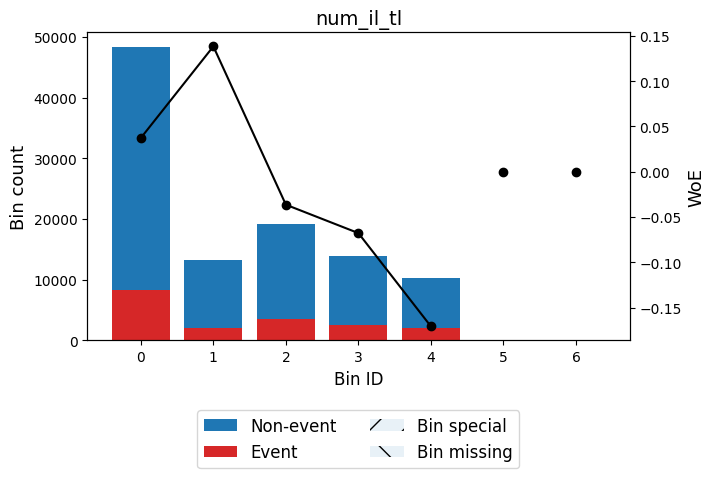


🔍 Feature: num_op_rev_tl
✅ Total IV for num_op_rev_tl: 0.0179
╒═══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                   │          IV │
╞═══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 4.50)  │   17705 │             0.158  │ 0.14680467122886176   │ 0.0034708   │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 7.50)  │   38284 │             0.1655 │ 0.09174057272687586   │ 0.00298432  │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 9.50)  │   17320 │             0.1796 │ -0.006798137898275325 │ 7.65417e-06 │
├───────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9.50, 12.50) │   16527 │             0.1934 │ -0.09831708970322905  │ 0.00157275  │
├───────────────┼─────────┼────────────────────┼───────────────────

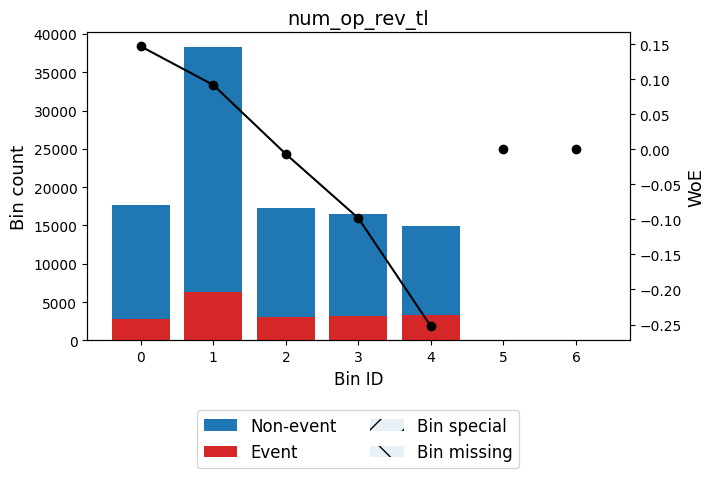


🔍 Feature: num_rev_accts
✅ Total IV for num_rev_accts: 0.0050
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 12.50)  │   43922 │             0.1739 │ 0.032278223007711215  │ 0.000432119 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [12.50, 13.50) │   11950 │             0.16   │ 0.13210672278739044   │ 0.00190622  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13.50, 18.50) │   22335 │             0.182  │ -0.02327472642600048  │ 0.00011631  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [18.50, 24.50) │   15105 │             0.1853 │ -0.045296616031159864 │ 0.000300033 │
├────────────────┼─────────┼────────────────────┼────────

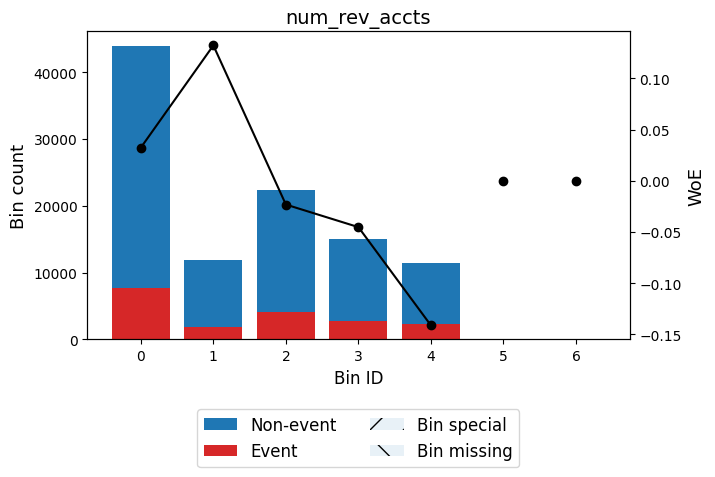


🔍 Feature: num_rev_tl_bal_gt_0
✅ Total IV for num_rev_tl_bal_gt_0: 0.0345
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 2.50)  │   11656 │             0.1432 │ 0.2629382487651575   │ 0.00705251 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 5.50)  │   49657 │             0.1638 │ 0.10436740591711624  │ 0.00498908 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [5.50, 8.50)  │   27838 │             0.189  │ -0.06927639972640542 │ 0.00130327 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [8.50, 10.50) │    8111 │             0.2127 │ -0.21724031000687472 │ 0.00391006 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────

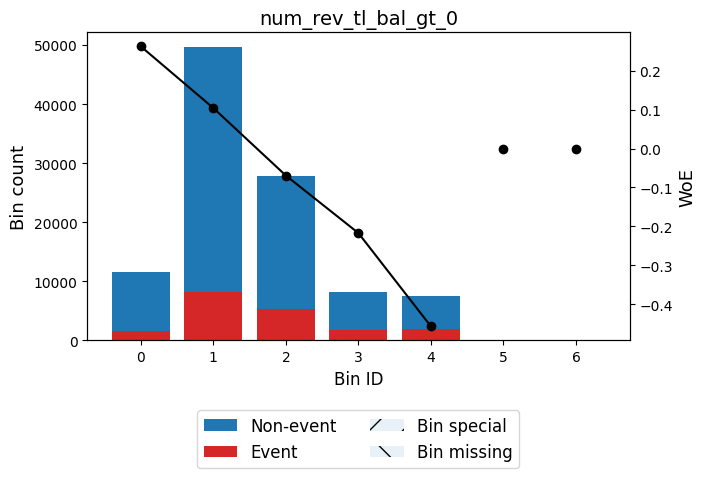


🔍 Feature: num_sats
✅ Total IV for num_sats: 0.0165
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 5.50)   │    8039 │             0.1443 │ 0.25393193360946187  │ 0.00455022 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [5.50, 11.50)  │   53108 │             0.1675 │ 0.07727315412434033  │ 0.00295103 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [11.50, 17.50) │   30631 │             0.1924 │ -0.09175613963562901 │ 0.00253362 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [17.50, 21.50) │    7698 │             0.2049 │ -0.1699201799281107  │ 0.00223759 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│

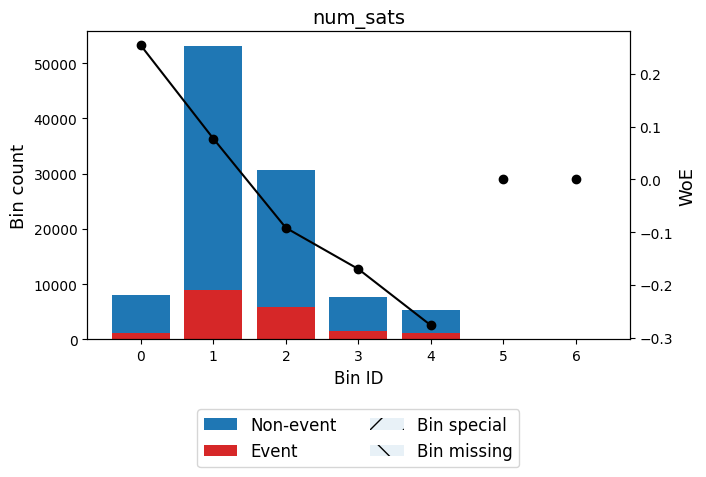


🔍 Feature: num_tl_120dpd_2m
✅ Total IV for num_tl_120dpd_2m: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


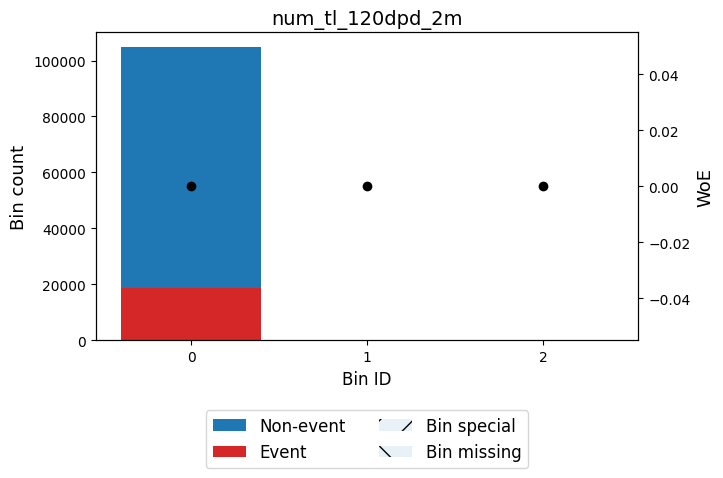


🔍 Feature: num_tl_30dpd
✅ Total IV for num_tl_30dpd: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


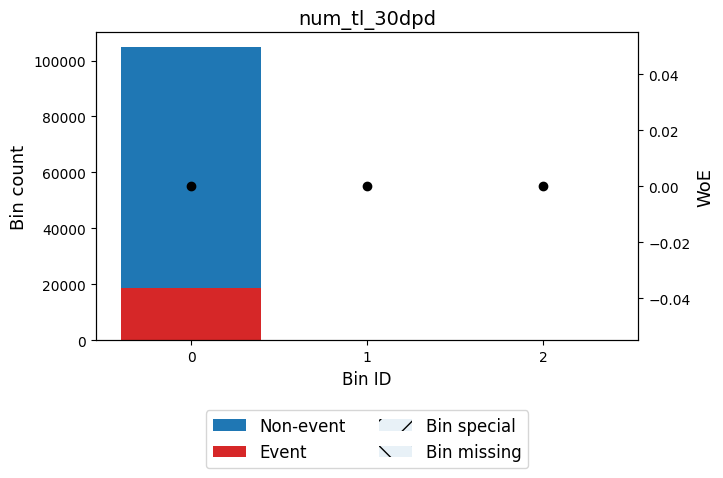


🔍 Feature: num_tl_90g_dpd_24m
✅ Total IV for num_tl_90g_dpd_24m: 0.0008
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   99030 │             0.1776 │ 0.006829472481352683 │ 4.39753e-05 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │    5774 │             0.1957 │ -0.1127629227047462  │ 0.000726087 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───────

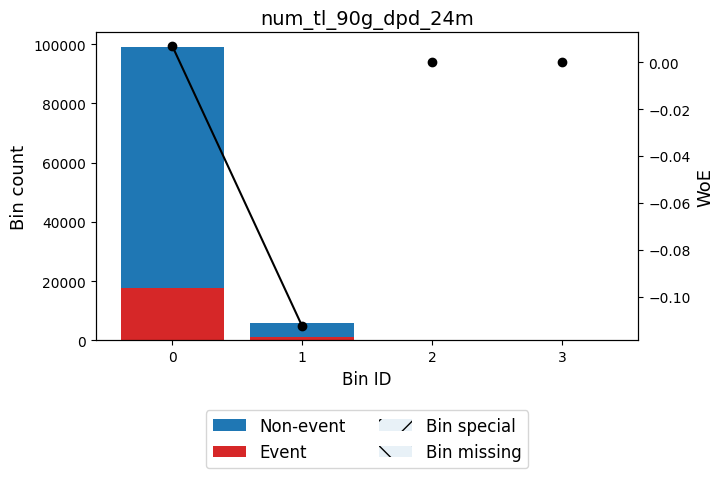


🔍 Feature: num_tl_op_past_12m
✅ Total IV for num_tl_op_past_12m: 0.0648
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   16652 │             0.1316 │ 0.36097595620318357  │ 0.0183727  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   24475 │             0.1527 │ 0.1872474814661902   │ 0.00770192 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   29117 │             0.169  │ 0.06630969446027568  │ 0.00119566 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 4.50) │   25651 │             0.2164 │ -0.23937963045913624 │ 0.0151159  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [

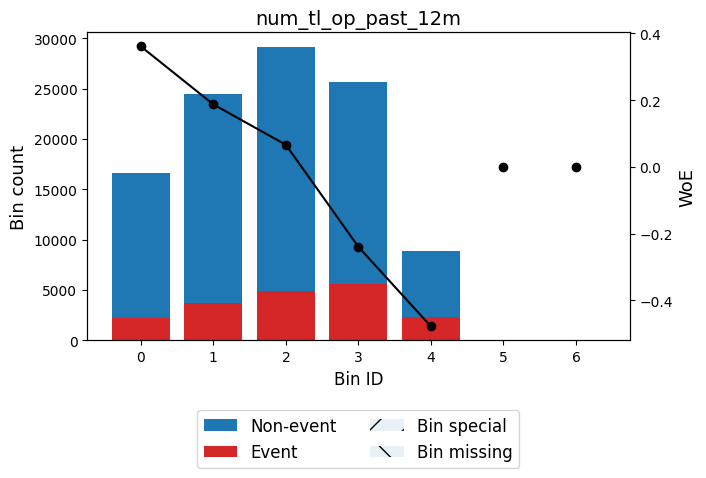


🔍 Feature: pct_tl_nvr_dlq
✅ Total IV for pct_tl_nvr_dlq: 0.0065
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 96.25)  │   42767 │             0.1878 │ -0.06196037668289489 │ 0.00159792  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [96.25, 97.75) │    6146 │             0.1856 │ -0.04758901192889664 │ 0.000134846 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [97.75, 97.85) │    6780 │             0.142  │ 0.272365178296494    │ 0.00438781  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [97.85, inf)   │   49111 │             0.1746 │ 0.02693557227269494  │ 0.000337041 │
├────────────────┼─────────┼────────────────────┼────────────────

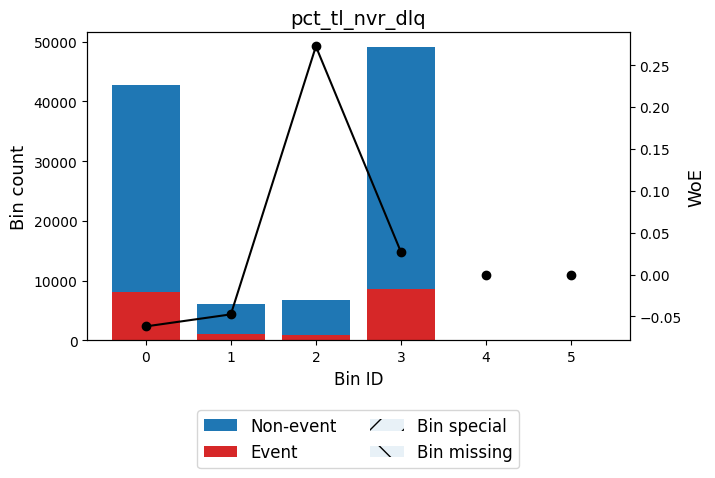


🔍 Feature: percent_bc_gt_75
✅ Total IV for percent_bc_gt_75: 0.0297
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 4.90)   │   21299 │             0.1422 │ 0.27090648452867305   │ 0.0136435   │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.90, 44.05)  │   31466 │             0.1658 │ 0.08981381059713889   │ 0.00235237  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [44.05, 52.75) │   11977 │             0.1823 │ -0.025051478103823133 │ 7.22978e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [52.75, 67.70) │   11415 │             0.2005 │ -0.1431089122813609   │ 0.00233403  │
├────────────────┼─────────┼────────────────────┼──

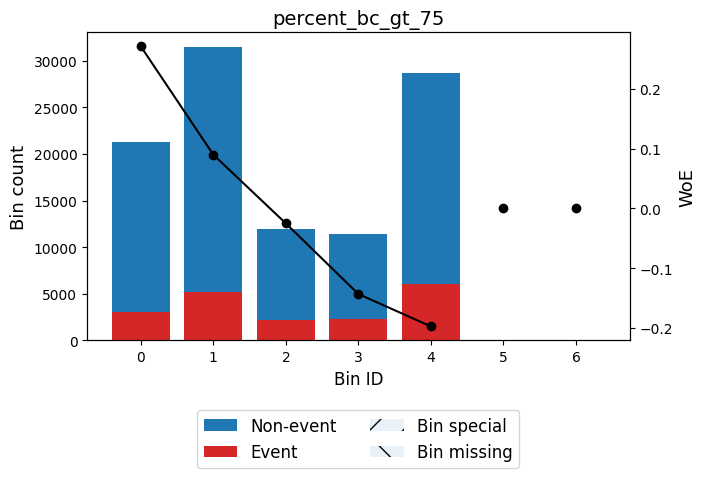


🔍 Feature: pub_rec_bankruptcies
✅ Total IV for pub_rec_bankruptcies: 0.0036
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   92574 │             0.1753 │ 0.022490862788275612 │ 0.000443585 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   12230 │             0.2034 │ -0.16064944019420535 │ 0.00316847  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───

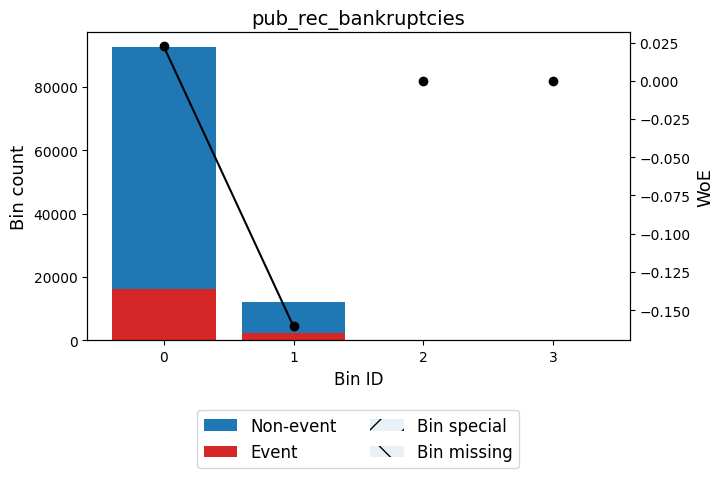


🔍 Feature: tax_liens
✅ Total IV for tax_liens: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


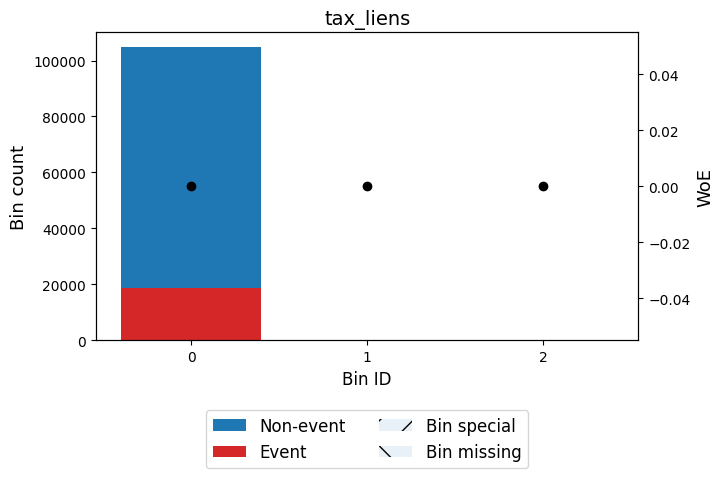


🔍 Feature: tot_hi_cred_lim
✅ Total IV for tot_hi_cred_lim: 0.0291
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 46920.50)       │   22829 │             0.1895 │ -0.07254656927084646 │ 0.00117326  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [46920.50, 111203.50)  │   26015 │             0.2084 │ -0.1914018828597841  │ 0.00965841  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [111203.50, 244077.00) │   30562 │             0.1753 │ 0.022290587141250207 │ 0.000143856 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [244077.00, 481131.50) │   20102 │             0.1475 │ 0.22784591617351047 

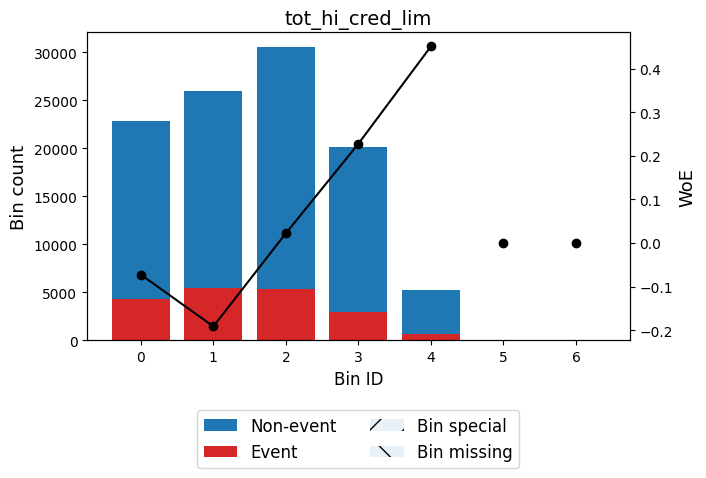


🔍 Feature: total_bal_ex_mort
✅ Total IV for total_bal_ex_mort: 0.0100
╒═══════════════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                    │          IV │
╞═══════════════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 9589.50)       │    7761 │             0.1446 │ 0.2517271888203758     │ 0.00432011  │
├───────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [9589.50, 18598.50)   │   13041 │             0.1634 │ 0.1069670929123574     │ 0.00137516  │
├───────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [18598.50, 40964.50)  │   38520 │             0.1748 │ 0.026095229933231323   │ 0.000248187 │
├───────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [40964.50, 116224.50) │   38683 │             0.1942 │ -0.10346

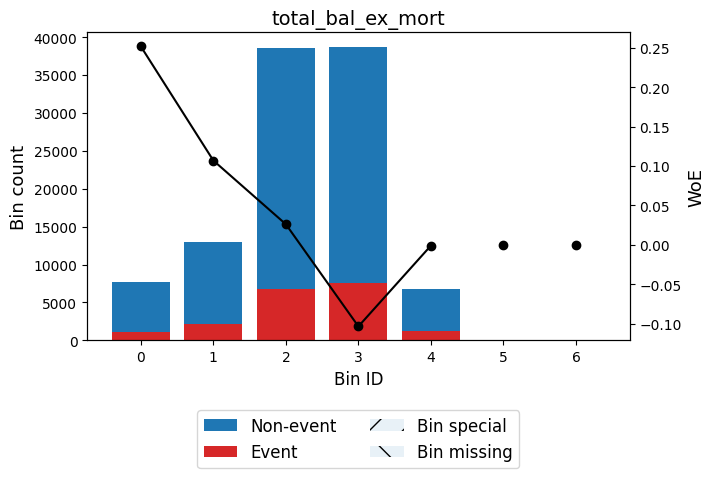


🔍 Feature: total_bc_limit
✅ Total IV for total_bc_limit: 0.0285
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 11041.00)     │   38173 │             0.2031 │ -0.1591009322218171  │ 0.00969523  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11041.00, 14717.50) │   11629 │             0.1869 │ -0.05614644040473871 │ 0.000356125 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14717.50, 41223.00) │   42128 │             0.1693 │ 0.06468951266771139  │ 0.00164731  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [41223.00, 52309.50) │    5244 │             0.1384 │ 0.3021533283870106   │ 0.00413511  │
├────

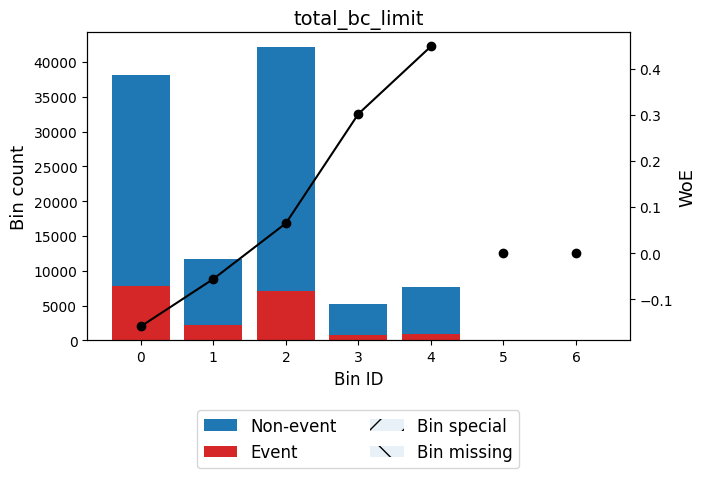


🔍 Feature: total_il_high_credit_limit
✅ Total IV for total_il_high_credit_limit: 0.0080
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 30337.50)     │   47869 │             0.1739 │ 0.03217500162385045   │ 0.000467959 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [30337.50, 31297.00) │    7756 │             0.1423 │ 0.26985625965963567   │ 0.00493154  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [31297.00, 41458.50) │   12045 │             0.1813 │ -0.018691828348608386 │ 4.03959e-05 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [41458.50, 73537.00) │   22112 │             0.1906 │ -0.079844

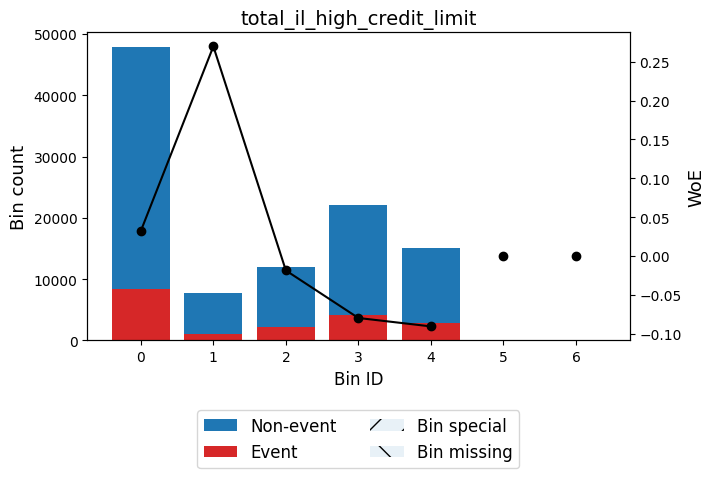


🔍 Feature: credit_history_years
✅ Total IV for credit_history_years: 0.0062
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │         IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪════════════╡
│ (-inf, 9.50)   │   17713 │             0.1845 │ -0.039951196895700036 │ 0.00027323 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [9.50, 10.50)  │    6425 │             0.2033 │ -0.16013127719493503  │ 0.00165356 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [10.50, 14.50) │   29007 │             0.1876 │ -0.060505433801502306 │ 0.00103302 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼────────────┤
│ [14.50, 20.50) │   28372 │             0.1735 │ 0.03503418910728229   │ 0.00032854 │
├────────────────┼─────────┼────────────────────┼────

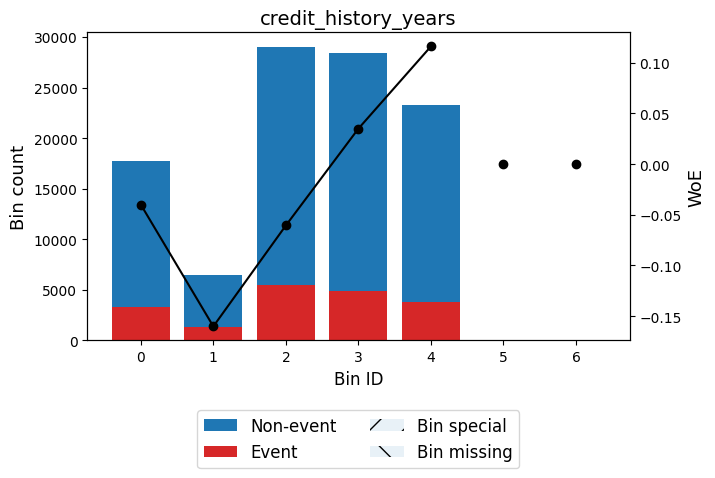


🔍 Feature: fico_score
✅ Total IV for fico_score: 0.1153
╒══════════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 679.50)   │   36036 │             0.2264 │ -0.2974409901774262 │ 0.0333644  │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [679.50, 699.50) │   28618 │             0.1896 │ -0.073288744236218  │ 0.00150138 │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [699.50, 719.50) │   19444 │             0.1542 │ 0.17601553305215556 │ 0.00542686 │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [719.50, 739.50) │   10135 │             0.126  │ 0.4106860746344623  │ 0.0142322  │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼

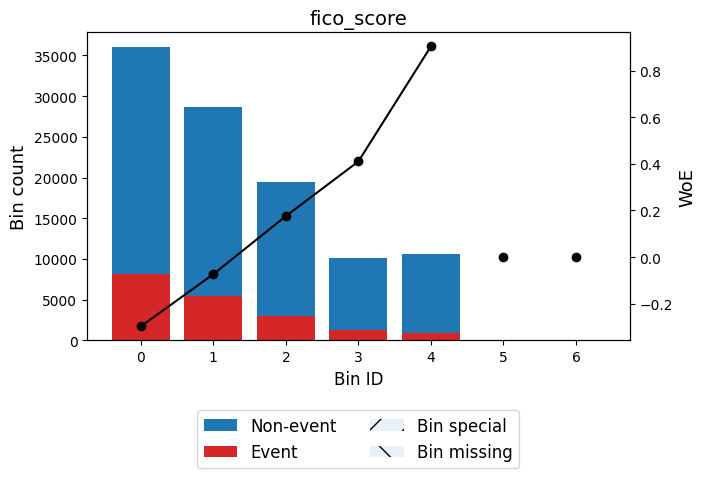


🔍 Feature: fico_score/delinq_2yrs_invalid
✅ Total IV for fico_score/delinq_2yrs_invalid: 0.0022
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   20355 │             0.1928 │ -0.09437877300133724 │ 0.00178274  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   84449 │             0.1751 │ 0.023621249937080924 │ 0.000446187 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────

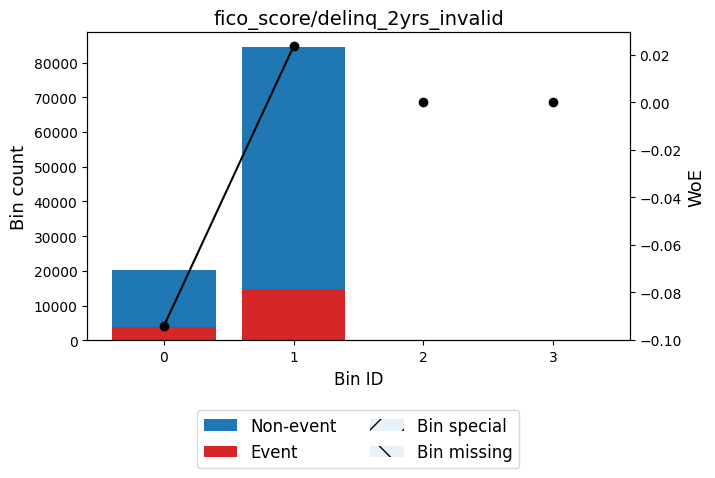


🔍 Feature: fico_score/delinq_2yrs
✅ Total IV for fico_score/delinq_2yrs: 0.0064
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 40.31)    │   84453 │             0.1751 │ 0.023678670051362927 │ 0.000448372 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [40.31, 398.50)  │    6935 │             0.1993 │ -0.13531475690215    │ 0.00126468  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [398.50, 684.50) │    7610 │             0.2126 │ -0.21688692623752348 │ 0.00365623  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [684.50, inf)    │    5806 │             0.1593 │ 0.13719030455858028  │ 0.000997133 │
├──────────────────┼─────────

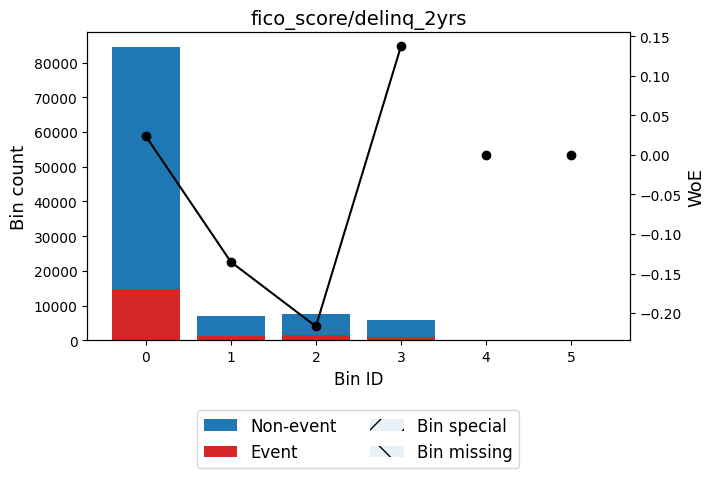


🔍 Feature: fico_score/acc_now_delinq_invalid
✅ Total IV for fico_score/acc_now_delinq_invalid: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


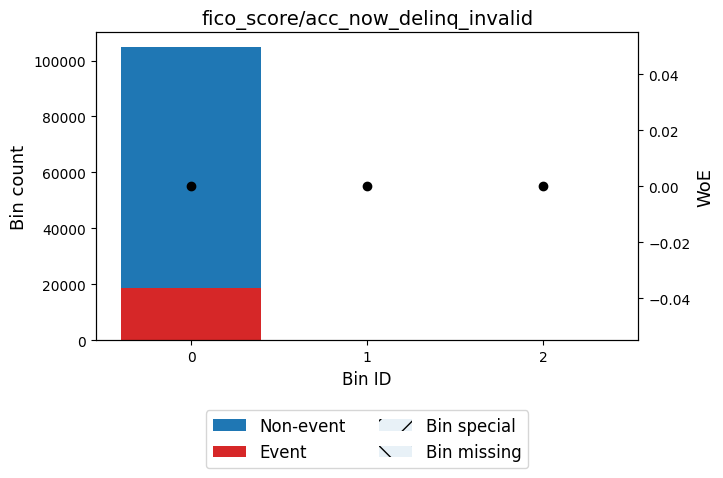


🔍 Feature: fico_score/acc_now_delinq
✅ Total IV for fico_score/acc_now_delinq: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


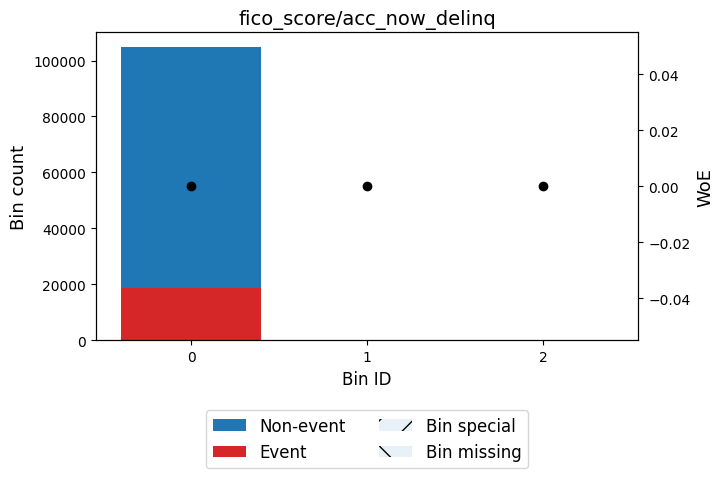


🔍 Feature: fico_score/inq_last_6mths_invalid
✅ Total IV for fico_score/inq_last_6mths_invalid: 0.0233
╒══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │        IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 0.50) │   45407 │             0.2043 │ -0.1662650630220437 │ 0.0126225 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [0.50, inf)  │   59397 │             0.1589 │ 0.1402112562715041  │ 0.0106445 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special      │       0 │             0      │ 0.0                 │ 0         │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing      │       0 │             0      │ 0.0                 │ 0         │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────

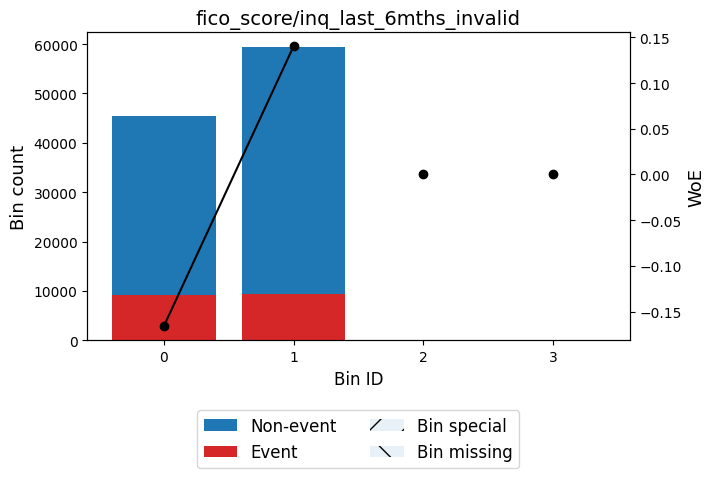


🔍 Feature: fico_score/inq_last_6mths
✅ Total IV for fico_score/inq_last_6mths: 0.0536
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 112.42)   │   59430 │             0.1589 │ 0.140367891525212    │ 0.0106737  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [112.42, 344.75) │   11788 │             0.2489 │ -0.4216186992269826  │ 0.0227401  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [344.75, 684.50) │   17811 │             0.216  │ -0.23726391265954438 │ 0.0103045  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [684.50, 704.50) │    7126 │             0.1896 │ -0.07342815638634659 │ 0.00037529 │
├──────────────────┼─────────┼───

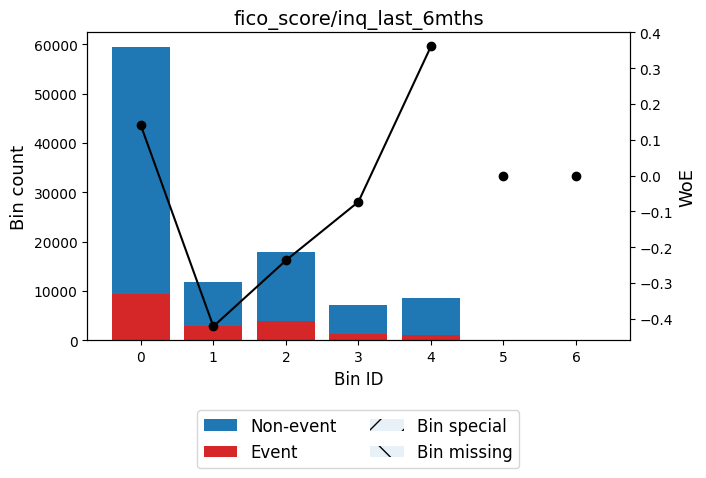


🔍 Feature: delinq_2yrs/credit_history_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: delinq_2yrs/credit_history
✅ Total IV for delinq_2yrs/credit_history: 0.0033
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 0.04) │   85962 │             0.1752 │ 0.023296084192024225  │ 0.000441809 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.04, 0.07) │    7435 │             0.1817 │ -0.021304038397157443 │ 3.24186e-05 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.07, 0.12) │    5742 │             0.1968 │ -0.11967738413357853  │ 0.000815094 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [0.12, inf)  │    5665 │             0.2074 │ -0.1855

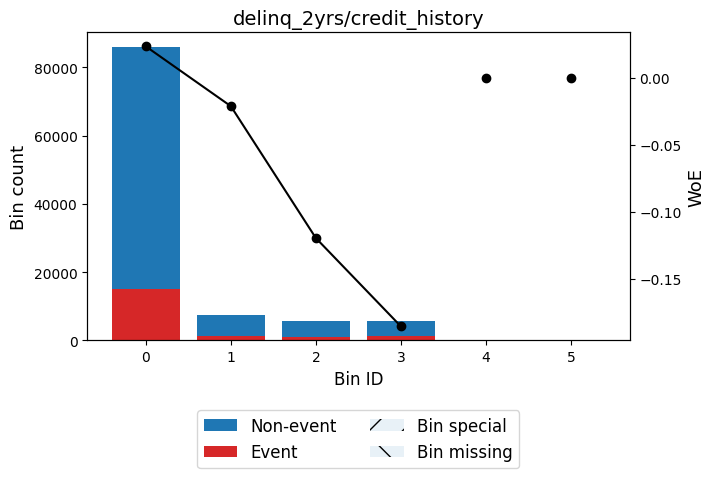


🔍 Feature: late_pymt_hist_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: late_pymt_hist
✅ Total IV for late_pymt_hist: 0.0042
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.06) │   86345 │             0.1741 │ 0.030776023063922908 │ 0.000772636 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.06, 0.10) │    8292 │             0.2021 │ -0.1530403981546431  │ 0.00194496  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, inf)  │   10167 │             0.1973 │ -0.12289733286877991 │ 0.00152348  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────

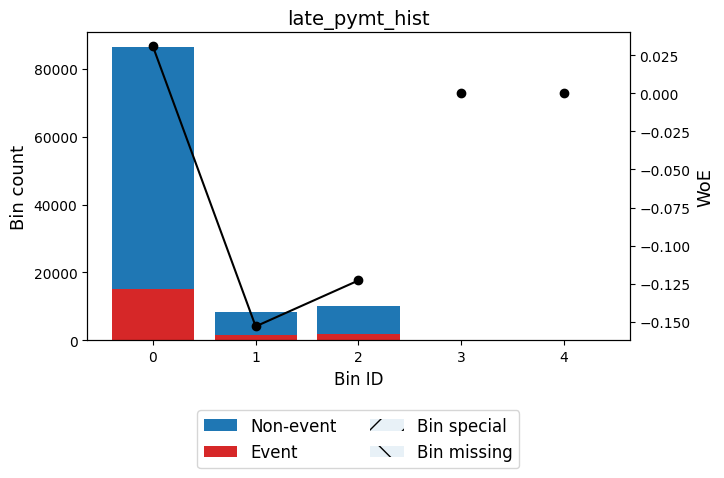


🔍 Feature: loan_amnt/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/annual_inc
✅ Total IV for loan_amnt/annual_inc: 0.1285
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.10) │   15722 │             0.1127 │ 0.5372493022683433   │ 0.0361844   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, 0.17) │   25566 │             0.1366 │ 0.31780445355719444  │ 0.0221852   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.17, 0.26) │   30216 │             0.1715 │ 0.04868956141038705  │ 0.000672825 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.26, 0.33) │   16143 │             0.2231 │ -0.27824992636205104 │ 0.0130049  

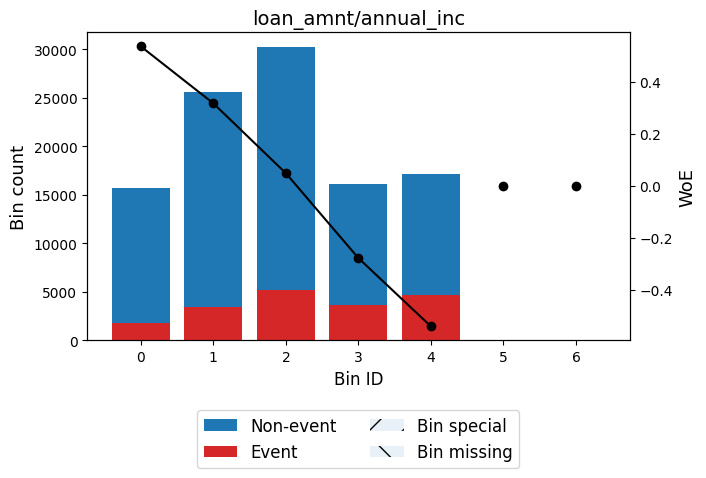


🔍 Feature: revol_util/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: revol_util/annual_inc
✅ Total IV for revol_util/annual_inc: 0.0455
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │   15371 │             0.1278 │ 0.394672394871008    │ 0.0200431   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   19597 │             0.1513 │ 0.1979328261561204   │ 0.00686641  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   23719 │             0.1783 │ 0.001526856965558654 │ 5.27354e-07 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   25971 │             0.196  │ -0.11480386572190282 │ 0.003387

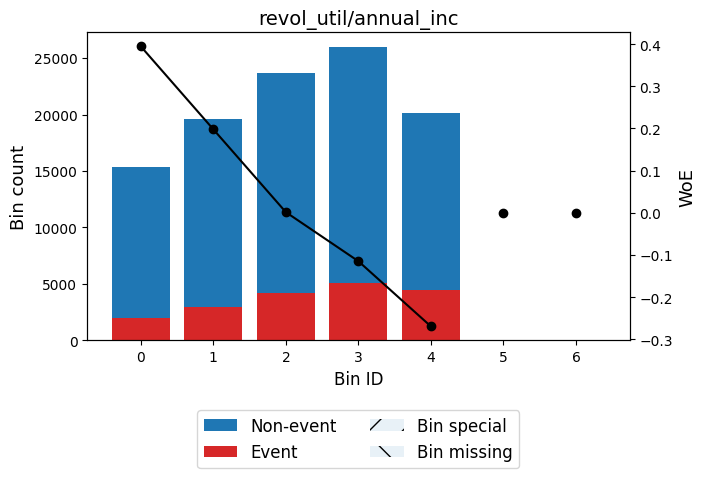


🔍 Feature: acc_op_past_24mths/total_acc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: acc_op_past_24mths/total_acc
✅ Total IV for acc_op_past_24mths/total_acc: 0.0660
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 0.07) │   12695 │             0.1187 │ 0.47859950187921285 │ 0.0236567  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.07, 0.11) │   13640 │             0.1408 │ 0.2828502442930343  │ 0.00948669 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.11, 0.19) │   32686 │             0.1659 │ 0.08898104575428945 │ 0.00239913 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.19, 0.31) │   27537 │             0.2015 │ -0.1494679119626623 │ 0.0061

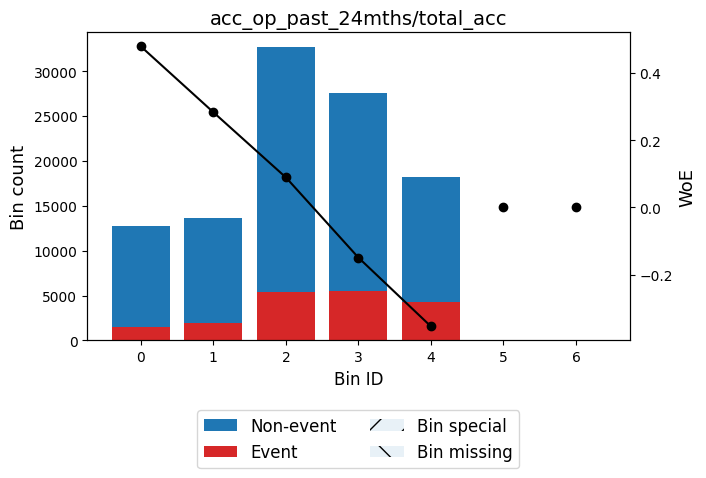


🔍 Feature: bc_open_to_buy/annual_inc_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: bc_open_to_buy/annual_inc
✅ Total IV for bc_open_to_buy/annual_inc: 0.0244
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5353 │             0.2341 │ -0.3406750560198113  │ 0.00658547  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.04) │   33719 │             0.1963 │ -0.11671989692924267 │ 0.00454865  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.18) │   41251 │             0.1748 │ 0.02563926691315177  │ 0.000256614 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.18, 0.42) │   17056 │             0.1566 │ 0.15761170905954547

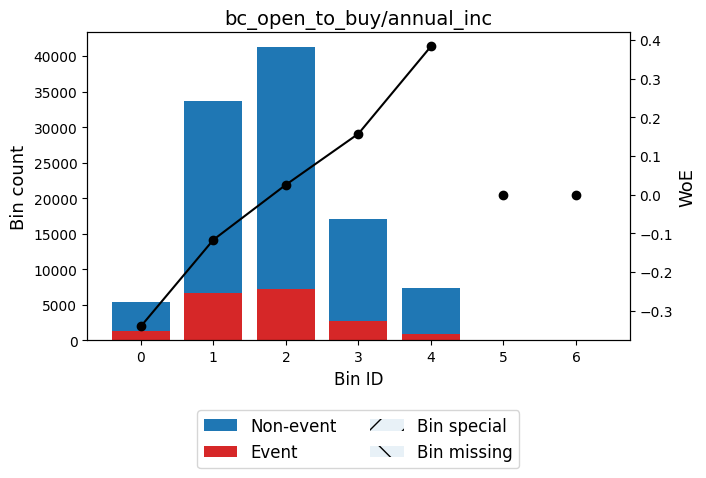


🔍 Feature: inq_last6mths_x_tl_op_past_12m
✅ Total IV for inq_last6mths_x_tl_op_past_12m: 0.0457
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   69035 │             0.159  │ 0.1397356458191068    │ 0.0122899   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 2.50) │   10171 │             0.1784 │ 0.0007730221613631016 │ 5.79778e-08 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 4.50) │   12222 │             0.2105 │ -0.2043396040775023   │ 0.00519232  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 8.50) │    7985 │             0.2361 │ -0.3517604035368507   │ 0.0105073   │
├──────────────┼─────────┼─────────────────

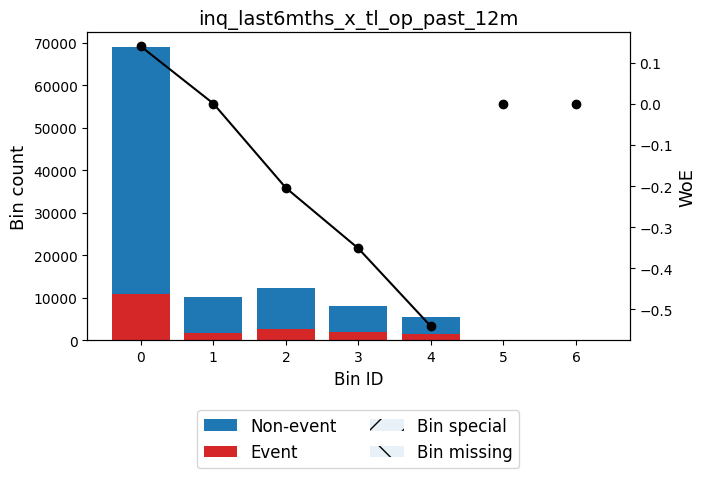


🔍 Feature: dti_x_revol_util
✅ Total IV for dti_x_revol_util: 0.0801
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 451.05)     │   24927 │             0.1261 │ 0.40951262068311745  │ 0.0348181  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [451.05, 902.94)   │   28578 │             0.1592 │ 0.1377098551590079   │ 0.00494444 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [902.94, 1314.82)  │   21007 │             0.1892 │ -0.0710521743312591  │ 0.00103511 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1314.82, 1965.88) │   19946 │             0.2182 │ -0.2501645207835541  │ 0.012879   │
├────────────────────┼─────────

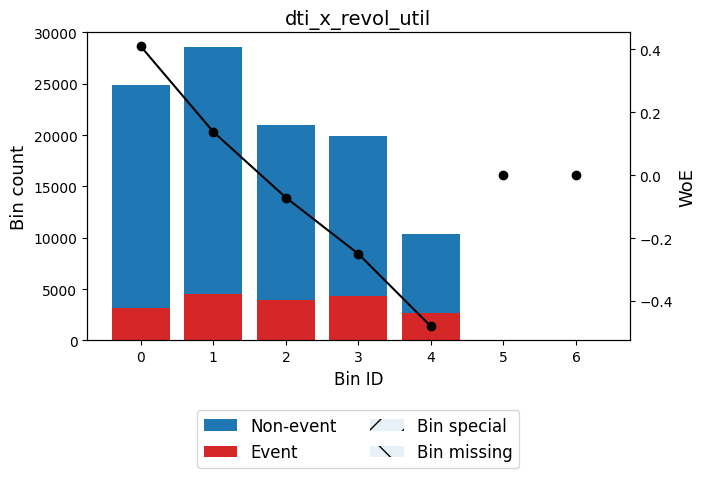


🔍 Feature: avail_ratio
✅ Total IV for avail_ratio: 0.0271
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, -96.85)   │    5422 │             0.2438 │ -0.3942801215353744  │ 0.00907543 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [-96.85, -91.15) │   10420 │             0.2063 │ -0.17895468692011351 │ 0.00336882 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [-91.15, -62.35) │   36159 │             0.19   │ -0.07625313404714573 │ 0.00205549 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [-62.35, -36.15) │   31788 │             0.1667 │ 0.08331655861795828  │ 0.00204939 │
├──────────────────┼─────────┼────────────────────┼──────────

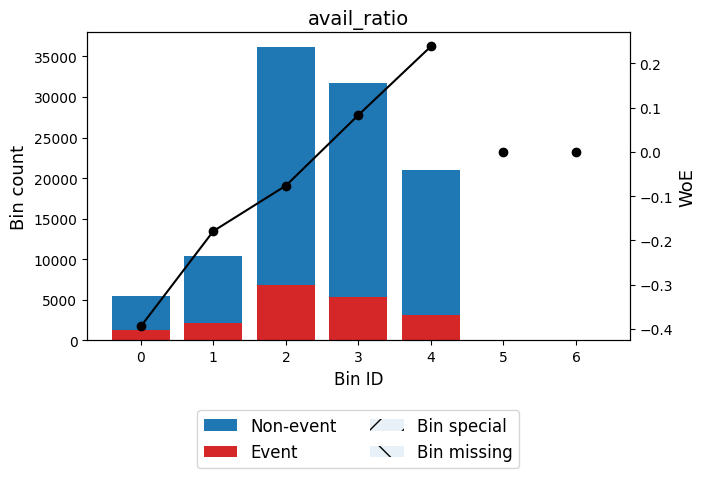


🔍 Feature: delinq2yrs_flag
✅ Total IV for delinq2yrs_flag: 0.0022
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   84449 │             0.1751 │ 0.023621249937080924 │ 0.000446187 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, inf)  │   20355 │             0.1928 │ -0.09437877300133724 │ 0.00178274  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0           │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────

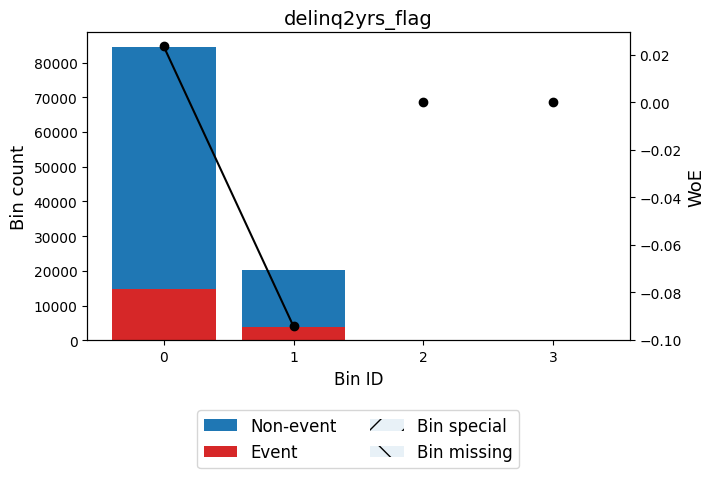


🔍 Feature: pubrec_flag
✅ Total IV for pubrec_flag: 0.0059
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   87730 │             0.1735 │ 0.034913284973516534 │ 0.00100893 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, inf)  │   17074 │             0.2046 │ -0.16821056251890565 │ 0.00486098 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Missing      │       0 │             0      │ 0.0                  │ 0          │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│              │ 

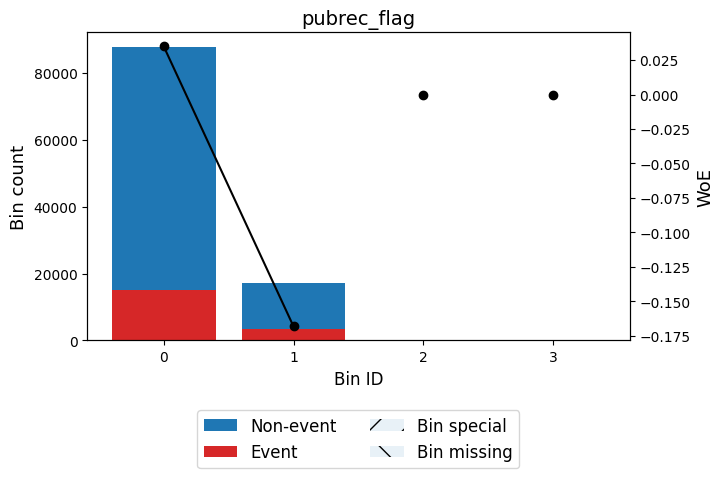


🔍 Feature: acc_now_delinq_flag
✅ Total IV for acc_now_delinq_flag: 0.0000
╒═════════════╤═════════╤════════════════════╤═══════╤══════╕
│ Bin         │   Count │   Default Rate (%) │ WOE   │   IV │
╞═════════════╪═════════╪════════════════════╪═══════╪══════╡
│ (-inf, inf) │  104804 │             0.1786 │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Special     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│ Missing     │       0 │             0      │ 0.0   │    0 │
├─────────────┼─────────┼────────────────────┼───────┼──────┤
│             │  104804 │             0.1786 │       │    0 │
╘═════════════╧═════════╧════════════════════╧═══════╧══════╛


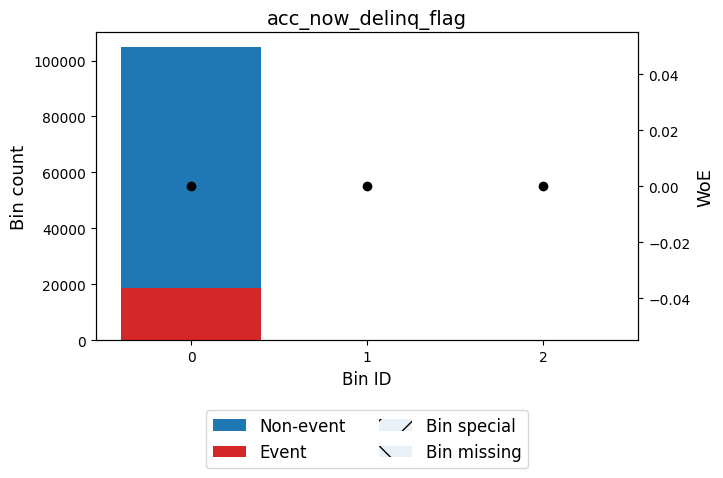


🔍 Feature: tl_op12m_x_inq6m
✅ Total IV for tl_op12m_x_inq6m: 0.0457
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   69035 │             0.159  │ 0.1397356458191068    │ 0.0122899   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 2.50) │   10171 │             0.1784 │ 0.0007730221613631016 │ 5.79778e-08 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 4.50) │   12222 │             0.2105 │ -0.2043396040775023   │ 0.00519232  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 8.50) │    7985 │             0.2361 │ -0.3517604035368507   │ 0.0105073   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼

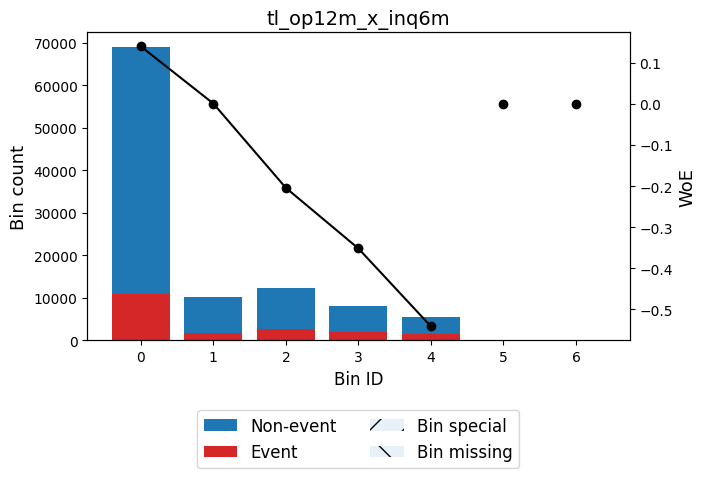


🔍 Feature: dti_x_inq
✅ Total IV for dti_x_inq: 0.0577
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 15.48)  │   72279 │             0.1572 │ 0.15332534581263357  │ 0.0154227   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [15.48, 23.56) │   11220 │             0.1881 │ -0.06402018691965261 │ 0.000447845 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23.56, 32.05) │    8543 │             0.2209 │ -0.26559091668364765 │ 0.00624648  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [32.05, 51.88) │    7360 │             0.2501 │ -0.42823357160971853 │ 0.0146748   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼───

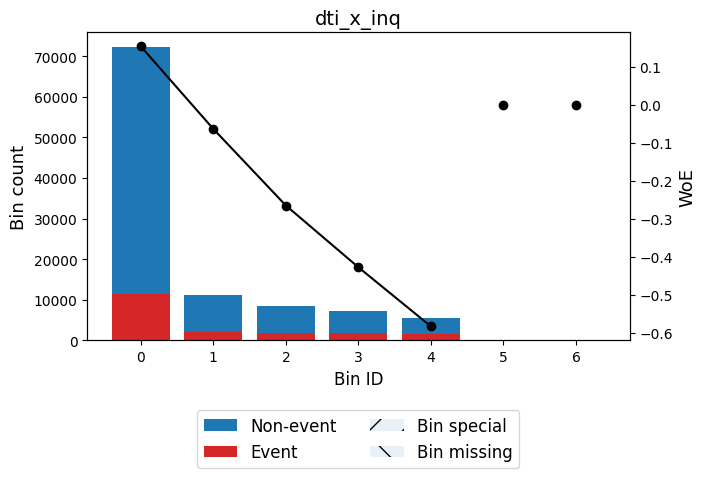


🔍 Feature: dti_x_term
✅ Total IV for dti_x_term: 0.2203
╒════════════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                 │         IV │
╞════════════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 549.90)     │   35842 │             0.1158 │ 0.5071071411427197  │ 0.0742569  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [549.90, 937.62)   │   38412 │             0.1609 │ 0.12513449830127987 │ 0.00551026 │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [937.62, 1220.58)  │   16835 │             0.2251 │ -0.2897419124787015 │ 0.0147565  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1220.58, 1460.10) │    6594 │             0.284  │ -0.6016421357139438 │ 0.0272228  │
├────────────────────┼─────────┼────────────────────┼

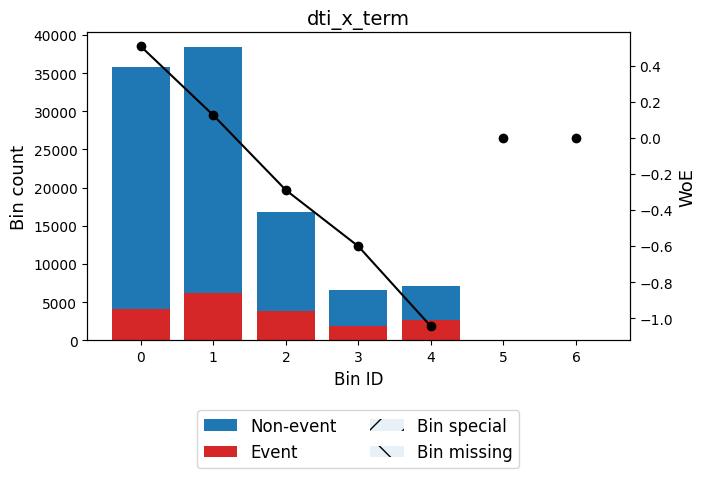


🔍 Feature: term_x_revol_util
✅ Total IV for term_x_revol_util: 0.1220
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 582.60)     │    6828 │             0.1134 │ 0.530781262175795    │ 0.0153727  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [582.60, 1829.40)  │   34976 │             0.1436 │ 0.25924831731314213  │ 0.020598   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1829.40, 2866.80) │   35057 │             0.1716 │ 0.048365354865761434 │ 0.00077034 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2866.80, 3598.20) │   16276 │             0.1942 │ -0.10286052243256094 │ 0.00169775 │
├────────────────────┼───────

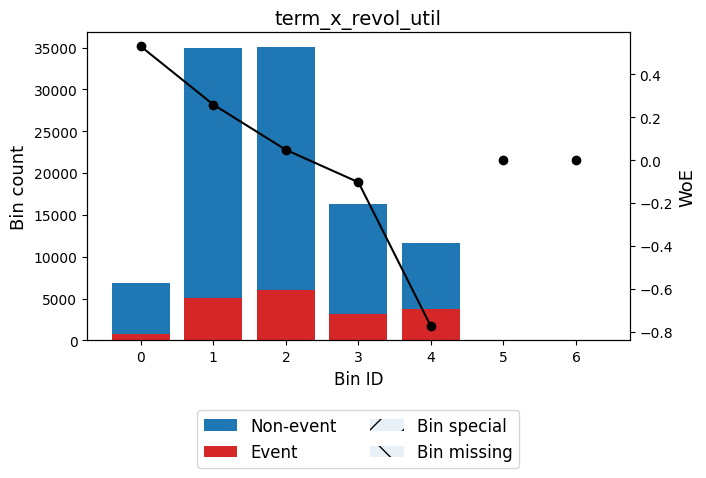


🔍 Feature: dti/fico_ratio_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: dti/fico_ratio
✅ Total IV for dti/fico_ratio: 0.1081
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.02) │   32170 │             0.1247 │ 0.42298993615522185  │ 0.0477223  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.02, 0.03) │   25414 │             0.1637 │ 0.10490868486118954  │ 0.00257946 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.04) │   29055 │             0.1982 │ -0.12838694908896175 │ 0.00475955 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.04, 0.05) │   12661 │             0.2478 │ -0.41599708291507365 │ 0.0237389  │
├──────────────┼─────────

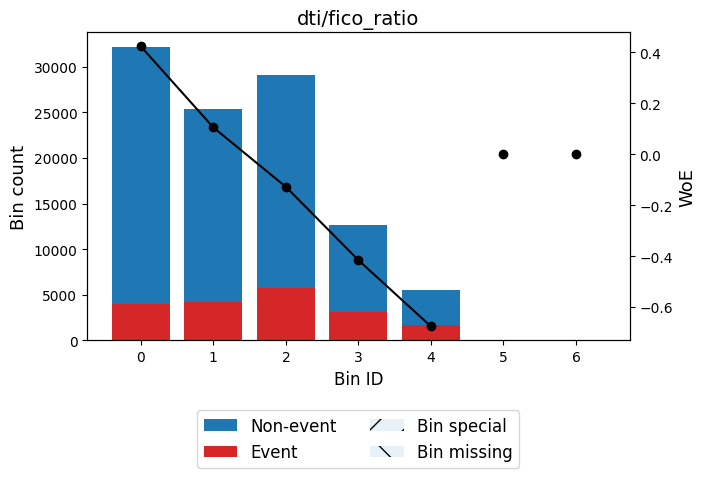


🔍 Feature: loan_amnt/tot_hi_cred_lim_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: loan_amnt/tot_hi_cred_lim
✅ Total IV for loan_amnt/tot_hi_cred_lim: 0.0703
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │    8417 │             0.1103 │ 0.5620374696470245   │ 0.0210212  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.06) │   18448 │             0.1311 │ 0.36492399619971194  │ 0.0207742  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.06, 0.11) │   27234 │             0.1682 │ 0.07251608483628624  │ 0.00133478 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.11, 0.23) │   24849 │             0.2006 │ -0.1433947460347318  │ 0.005

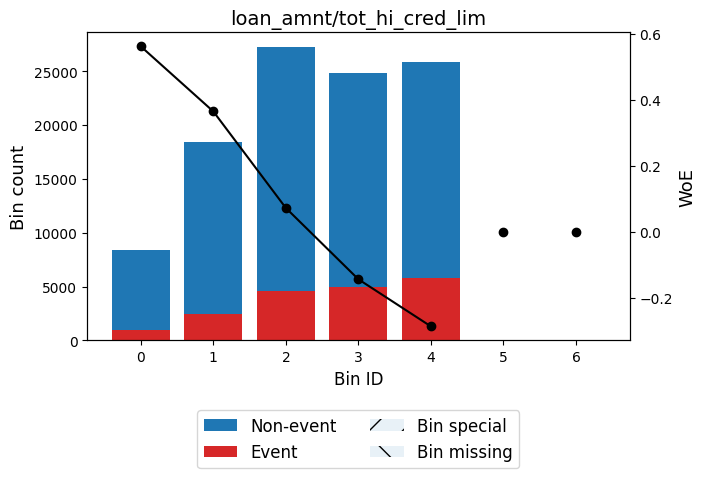


🔍 Feature: bc_open_to_buy/total_rev_hi_lim_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: bc_open_to_buy/total_rev_hi_lim
✅ Total IV for bc_open_to_buy/total_rev_hi_lim: 0.0394
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.01) │    6277 │             0.241  │ -0.37912813712930715 │ 0.00967199 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.01, 0.19) │   41588 │             0.2001 │ -0.14048811000854844 │ 0.00818824 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.19, 0.44) │   35951 │             0.1669 │ 0.08188195780808338  │ 0.0022397  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.44, 0.71) │   15740 │             0.1436 │ 0.25920437

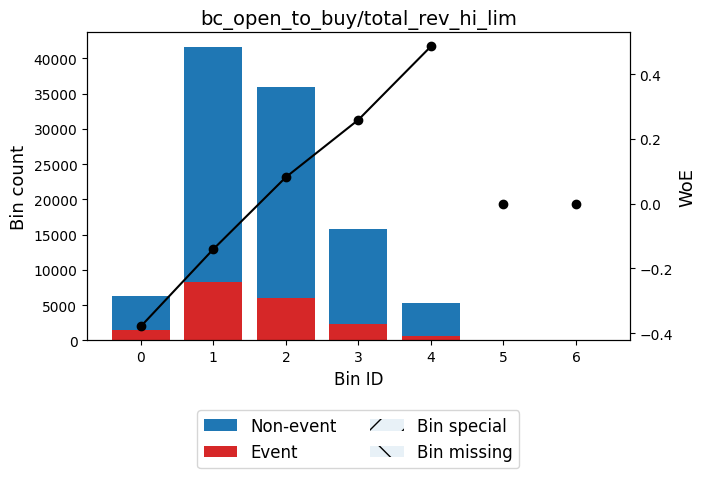


🔍 Feature: fico_score/int_rate_invalid
⚠️ Not enough variation. Skipping.

🔍 Feature: fico_score/int_rate
✅ Total IV for fico_score/int_rate: 0.4354
╒═════════════════╤═════════╤════════════════════╤══════════════════════╤═══════════╕
│ Bin             │   Count │   Default Rate (%) │ WOE                  │        IV │
╞═════════════════╪═════════╪════════════════════╪══════════════════════╪═══════════╡
│ (-inf, 40.76)   │   21094 │             0.3294 │ -0.8151433035812025  │ 0.168699  │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [40.76, 57.85)  │   37993 │             0.1966 │ -0.11836921576368487 │ 0.0052738 │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [57.85, 76.01)  │   21558 │             0.1273 │ 0.3986456914513574   │ 0.0286409 │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [76.01, 104.87) │   16670 │             0.0781 │ 0.942264527863736    │ 0.

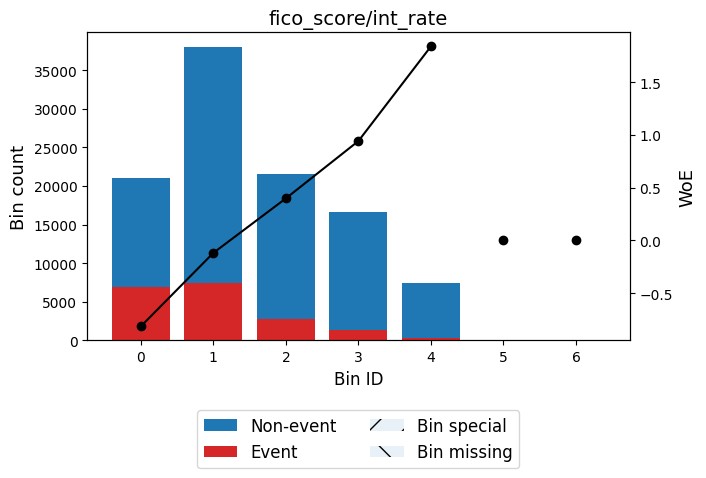


🔍 Feature: installment/annual_inc/12
✅ Total IV for installment/annual_inc/12: 0.0921
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │   10601 │             0.1092 │ 0.5724579933139866   │ 0.0273685  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.05) │   18263 │             0.1337 │ 0.34287223137223966  │ 0.0182913  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.05, 0.08) │   26479 │             0.1613 │ 0.12220409901808682  │ 0.00362612 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.08, 0.10) │   21761 │             0.1933 │ -0.09758931425460005 │ 0.00203982 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼───

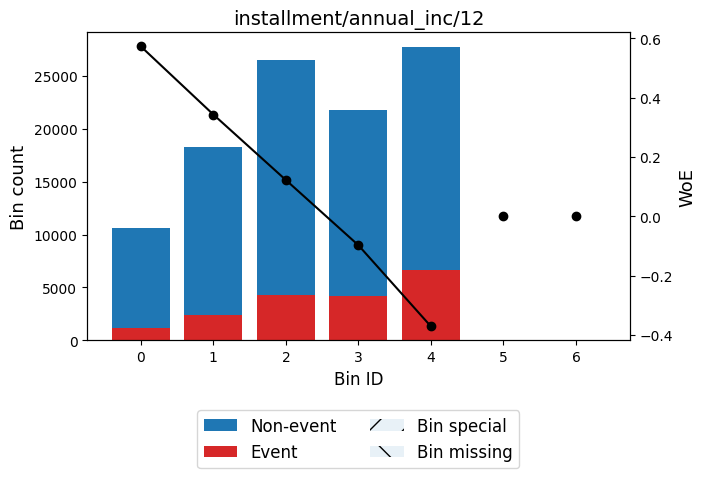


🔍 Feature: installment/annual_inc/12_x_term
✅ Total IV for installment/annual_inc/12_x_term: 0.2169
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 1.82) │   25704 │             0.1103 │ 0.5612225909157016  │ 0.0640269  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1.82, 3.40) │   35100 │             0.1439 │ 0.2573530638778061  │ 0.0203828  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [3.40, 4.56) │   18167 │             0.1894 │ -0.0722688416849604 │ 0.00092645 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [4.56, 6.85) │   20021 │             0.2563 │ -0.460732079080052  │ 0.0466359  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼

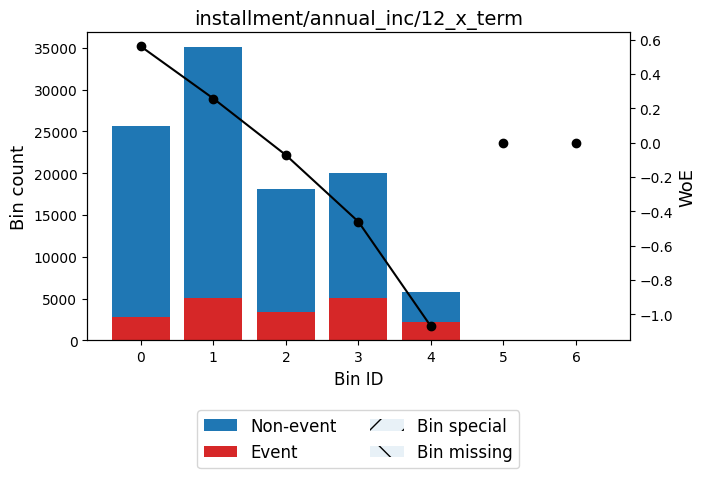

✅ Total IV for grade_numeric: 0.4525
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 1.50) │   18877 │             0.0546 │ 1.325128834626995   │ 0.201688   │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1.50, 2.50) │   31160 │             0.1206 │ 0.4609103760436568  │ 0.0541789  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [2.50, 3.50) │   28917 │             0.2002 │ -0.1412528792558112 │ 0.00575698 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [3.50, 4.50) │   15265 │             0.2702 │ -0.5326451391036483 │ 0.0484834  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [4.50, inf)  │   10585 │             0.3789 │ -1

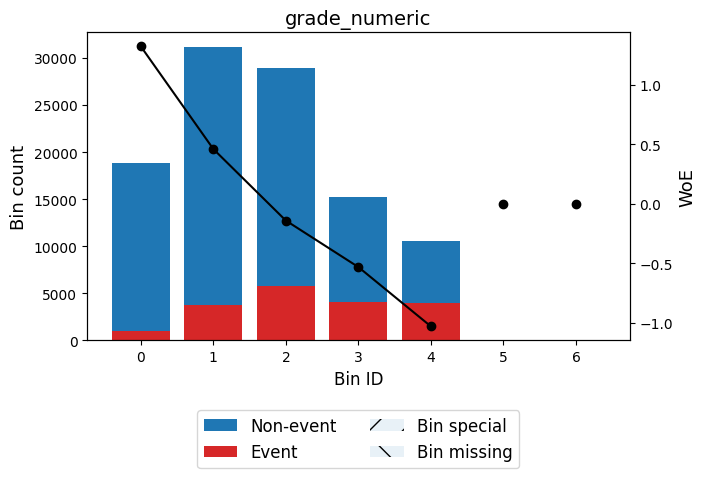

In [105]:
# ========================================== Train - Test Split ==========================================
numerical_cols1 = get_numerical_cols(df1, TARGET_COL)

train_df1 , test_df1 = sample_split_order(initial_df=df1, sample_frac=0.1, cut_off_date=CUT_DATE, date_col='issue_d')

# == Observe IV of Numerical Variables == 
for feature in numerical_cols1:
    if feature == "id":
        continue

    print(f"\n🔍 Feature: {feature}")

    if train_df1[feature].nunique() < 2:
        print("⚠️ Not enough variation. Skipping.")
        iv_categories["no_variation"].append(feature)
        continue

    x, y = train_df1[feature], train_df1[TARGET_COL]
    first_bin_and_classify_feature(feature=feature, x=x, y=y, monotonic_trend_type='auto')

    
train_df1 = tx_grade(train_df1)

first_bin_and_classify_feature('grade_numeric', train_df1['grade_numeric'], train_df1[TARGET_COL], dtype='numerical',monotonic_trend_type='auto' )


### 2.4  Display Feature Importance 

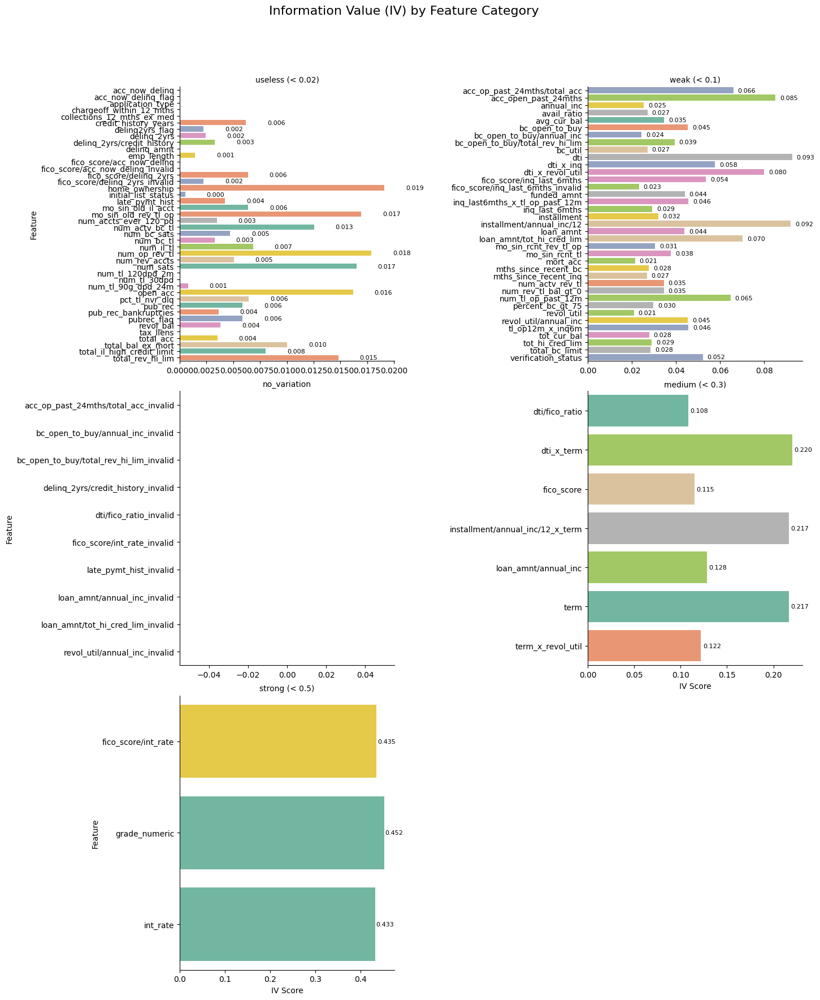

In [106]:
plot_iv_by_category(iv_categories)

In [107]:
# == Define columns to abandon & keep (Based on train_df1) == 
no_variation_columns = [
    item
    for category, feature_list in iv_categories.items()
    if category == 'no_variation'
    for item in feature_list
    
]

useless_cols = [
    feature
    for category, feature_list in iv_categories.items()
    if category == 'useless (< 0.02)'
    for feature, _ in feature_list
]

throw_cols = no_variation_columns + useless_cols
keep_cols = [c for c in train_df1.columns if c not in throw_cols]

train_df1 = train_df1.drop(columns=throw_cols)
print("✅ Dropped columns with IV < 0.02 and columns with no variation in TRAIN_DF1")


✅ Dropped columns with IV < 0.02 and columns with no variation in TRAIN_DF1


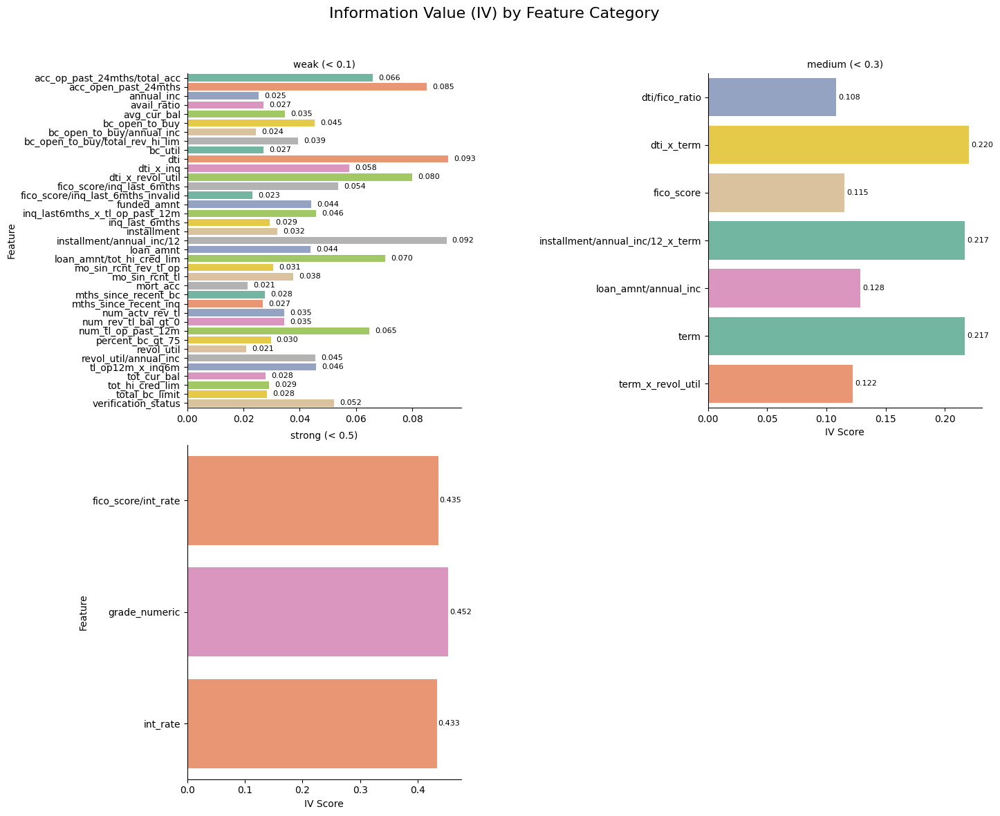

In [108]:
# == Leftover Columns IV in TRAIN_DF1 == 
updated_iv_categories = get_updated_iv_categories(iv_categories, train_df1)

plot_iv_by_category(updated_iv_categories)


### 2.5 Feature Filtering 

Now that we have identified the more relevant/important features for PD Modeling, lets observe the features' monotonicity of WoE. The following rules shall be implemented to counter different scenarios. 
- hello 

In [109]:
train_df1.columns

Index(['id', 'loan_amnt', 'funded_amnt', 'term', 'int_rate', 'installment',
       'grade', 'annual_inc', 'verification_status', 'issue_d',
       'default_status', 'dti', 'inq_last_6mths', 'revol_util', 'tot_cur_bal',
       'acc_open_past_24mths', 'avg_cur_bal', 'bc_open_to_buy', 'bc_util',
       'mo_sin_rcnt_rev_tl_op', 'mo_sin_rcnt_tl', 'mort_acc',
       'mths_since_recent_bc', 'mths_since_recent_inq', 'num_actv_rev_tl',
       'num_rev_tl_bal_gt_0', 'num_tl_op_past_12m', 'percent_bc_gt_75',
       'tot_hi_cred_lim', 'total_bc_limit', 'fico_score',
       'fico_score/inq_last_6mths_invalid', 'fico_score/inq_last_6mths',
       'loan_amnt/annual_inc', 'revol_util/annual_inc',
       'acc_op_past_24mths/total_acc', 'bc_open_to_buy/annual_inc',
       'inq_last6mths_x_tl_op_past_12m', 'dti_x_revol_util', 'avail_ratio',
       'tl_op12m_x_inq6m', 'dti_x_inq', 'dti_x_term', 'term_x_revol_util',
       'dti/fico_ratio', 'loan_amnt/tot_hi_cred_lim',
       'bc_open_to_buy/total_rev_hi_l

✅ Total IV for loan_amnt: 0.0439
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 9012.50)      │   32459 │             0.1393 │ 0.2953902145473486   │ 0.024518   │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [9012.50, 10012.50)  │    9914 │             0.1616 │ 0.12032605133461671  │ 0.00131706 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [10012.50, 16037.50) │   26433 │             0.1884 │ -0.06593414678660947 │ 0.00111978 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [16037.50, 28012.50) │   27131 │             0.2071 │ -0.1834396789296464  │ 0.00922948 │
├──────────────────────┼─────────┼─────────────

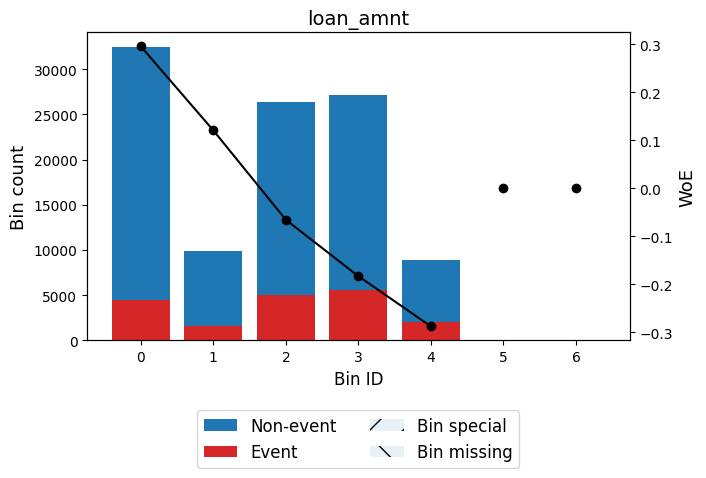

✅ Total IV for funded_amnt: 0.0440
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 9012.50)      │   32478 │             0.1392 │ 0.29555611794296244  │ 0.0245585  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [9012.50, 10012.50)  │    9912 │             0.1616 │ 0.12008540640504739  │ 0.00131164 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [10012.50, 16037.50) │   26464 │             0.1883 │ -0.0652318656606301  │ 0.00109709 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [16037.50, 28012.50) │   27106 │             0.2072 │ -0.18437789106601365 │ 0.00931823 │
├──────────────────────┼─────────┼───────────

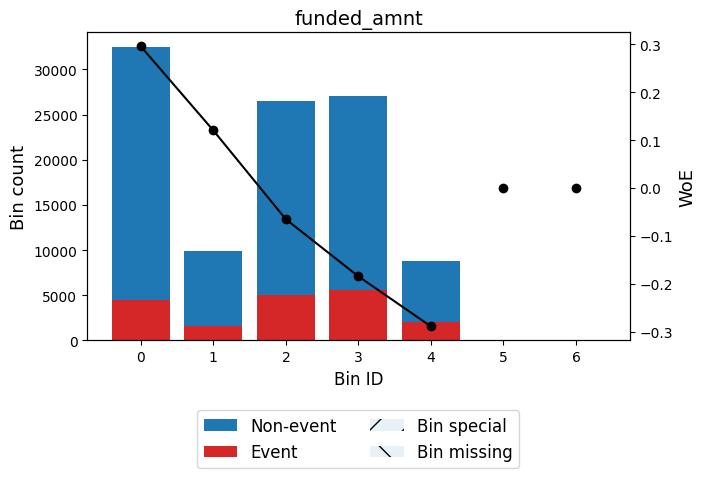

✅ Total IV for term: 0.2166
╒═══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                 │        IV │
╞═══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 48.00) │   79741 │             0.1378 │ 0.3073841596637701  │ 0.0649606 │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [48.00, inf)  │   25063 │             0.3082 │ -0.7174954188198741 │ 0.151631  │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing       │       0 │             0      │ 0.0                 │ 0         │
├───────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│               │  104804 │             0.1786 │           

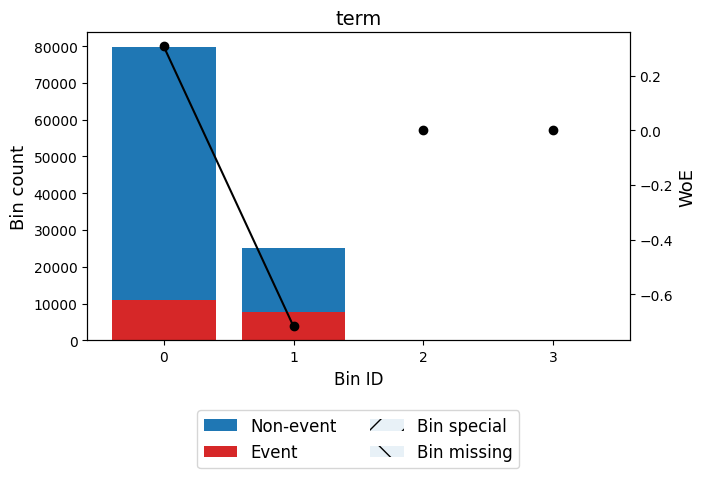

✅ Total IV for int_rate: 0.4326
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 8.12)   │   16382 │             0.0508 │ 1.4005966108748313   │ 0.190623    │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [8.12, 11.47)  │   23054 │             0.1106 │ 0.5584052760752933   │ 0.0569058   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.47, 14.44) │   29390 │             0.1721 │ 0.04493867784232952  │ 0.000558164 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14.44, 18.82) │   24231 │             0.2461 │ -0.40654416863435827 │ 0.0432733   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [18.82, i

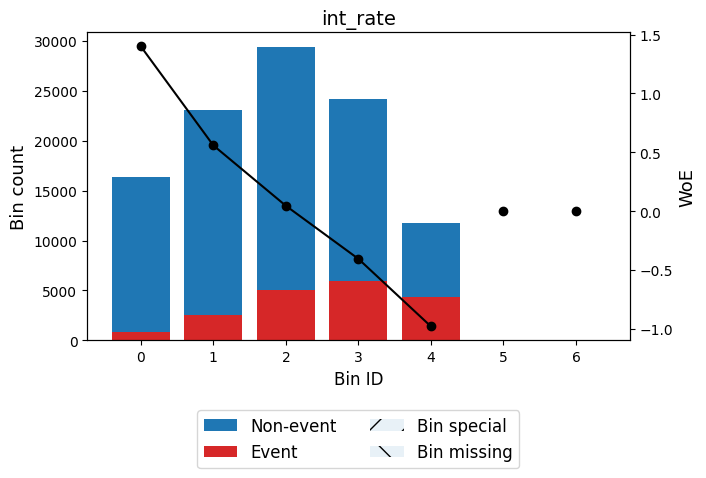

✅ Total IV for installment: 0.0320
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 193.38)   │   16132 │             0.131  │ 0.3656389768139452   │ 0.018233    │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [193.38, 251.58) │    9826 │             0.1502 │ 0.20680445886834153  │ 0.00374731  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [251.58, 337.48) │   18833 │             0.1732 │ 0.03731917912488525  │ 0.000247273 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [337.48, 877.63) │   52881 │             0.1962 │ -0.11575526149515092 │ 0.00701403  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼─

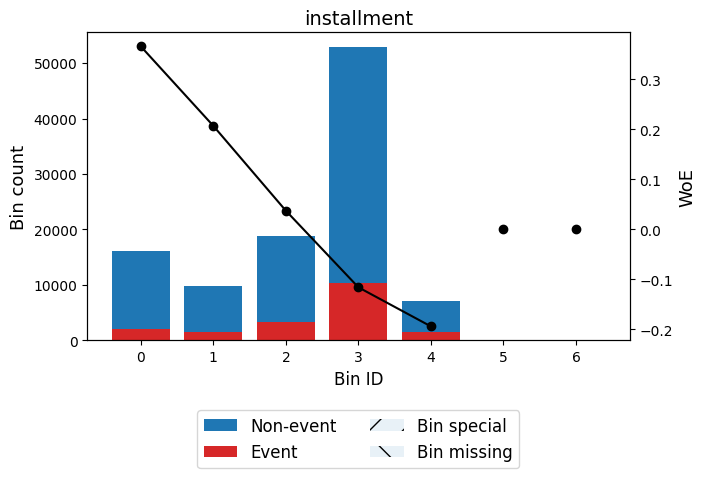

✅ Total IV for grade: 0.4525
╒═══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                 │         IV │
╞═══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ ['A']         │   18877 │             0.0546 │ 1.325128834626995   │ 0.201688   │
├───────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ ['B']         │   31160 │             0.1206 │ 0.4609103760436568  │ 0.0541789  │
├───────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ ['C']         │   28917 │             0.2002 │ -0.1412528792558112 │ 0.00575698 │
├───────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ ['D']         │   15265 │             0.2702 │ -0.5326451391036483 │ 0.0484834  │
├───────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ ['E' 'F' 'G'] │   10585 │             0.3789 

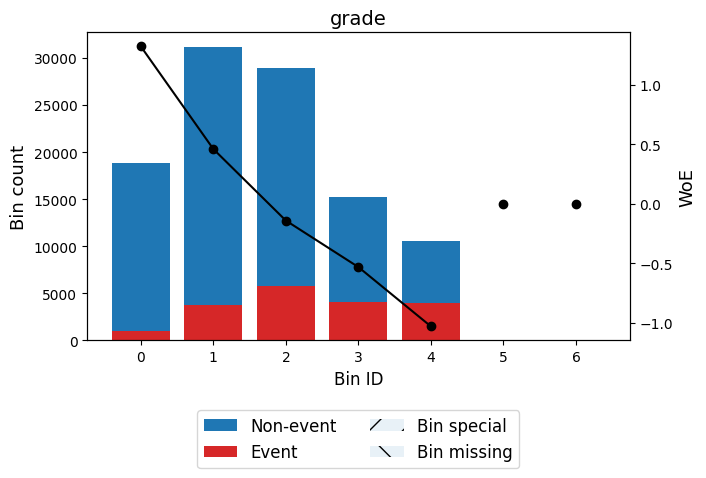

✅ Total IV for annual_inc: 0.0254
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 45752.50)      │   26224 │             0.2046 │ -0.16846653812055346 │ 0.00748933 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [45752.50, 75642.10)  │   40181 │             0.1869 │ -0.05586898532613804 │ 0.00121826 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [75642.10, 96006.00)  │   16185 │             0.1648 │ 0.0964976706321714   │ 0.00139372 │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [96006.00, 125887.00) │   12394 │             0.152  │ 0.19280865491854637  │ 0.0041277  │
├───────────────────────┼─────────┼─

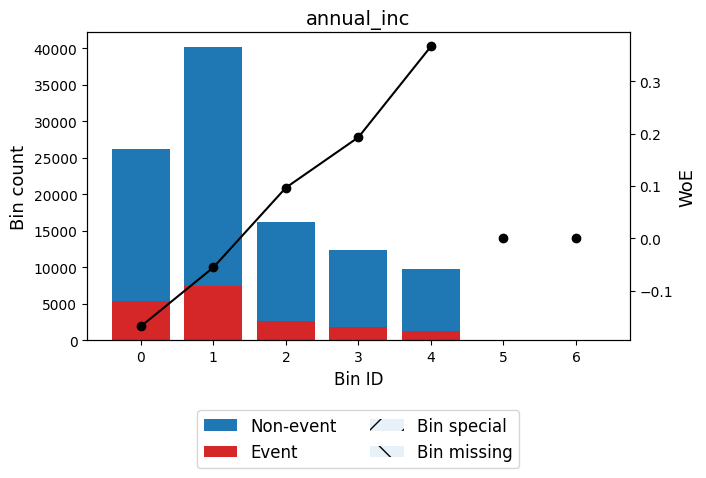

✅ Total IV for verification_status: 0.0523
╒═════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                 │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ ['Not Verified']    │   31272 │             0.131  │ 0.36592108062639706  │ 0.0353959  │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['Source Verified'] │   40129 │             0.1879 │ -0.06269531681687956 │ 0.00153549 │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ ['Verified']        │   33403 │             0.2118 │ -0.21205578570440453 │ 0.0153188  │
├─────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special             │       0 │             0      │ 0.0                  │ 0          │
├─────────────────────┼─────────┼──────────────

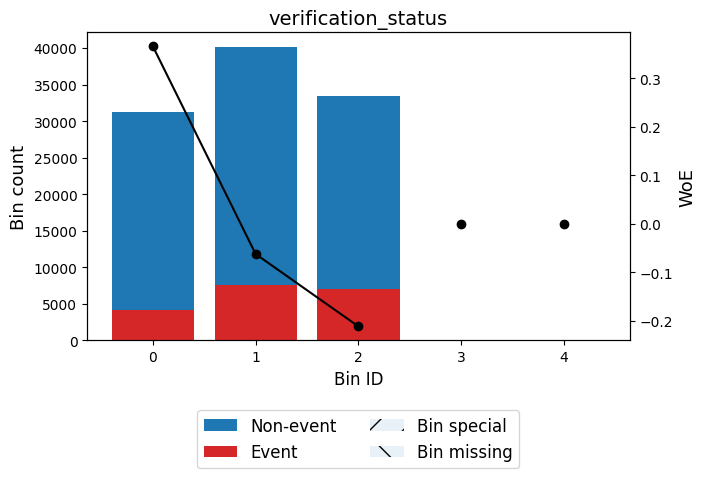

✅ Total IV for dti: 0.0927
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 12.78)  │   29974 │             0.1266 │ 0.4054535351527895   │ 0.0410986  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [12.78, 18.57) │   26632 │             0.1634 │ 0.10720723980058411  │ 0.00282071 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [18.57, 26.05) │   28396 │             0.1955 │ -0.11159107621802877 │ 0.00349571 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [26.05, 32.85) │   14516 │             0.2413 │ -0.38028839683951254 │ 0.0225118  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [32.85, inf)   │    5286 

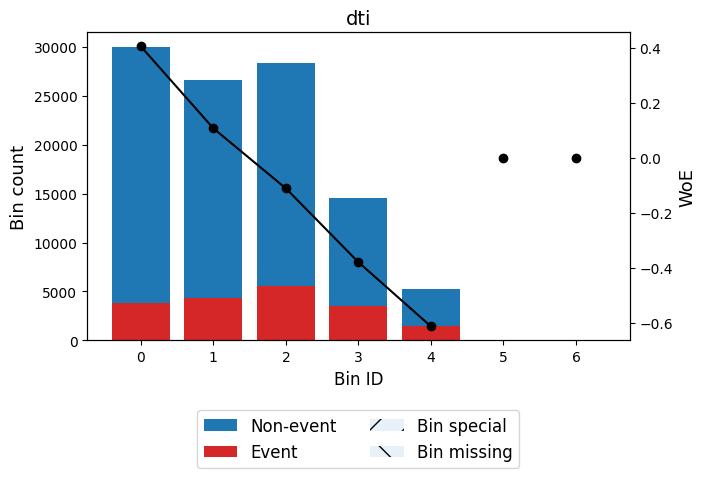

✅ Total IV for inq_last_6mths: 0.0293
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   59397 │             0.1589 │ 0.1402112562715041   │ 0.0106445  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   28829 │             0.1909 │ -0.08184613362490567 │ 0.00189138 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   10780 │             0.2191 │ -0.2552578012429336  │ 0.00725807 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, inf)  │    5798 │             0.2432 │ -0.3908375157932351  │ 0.00952657 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ Special      │       0 │            

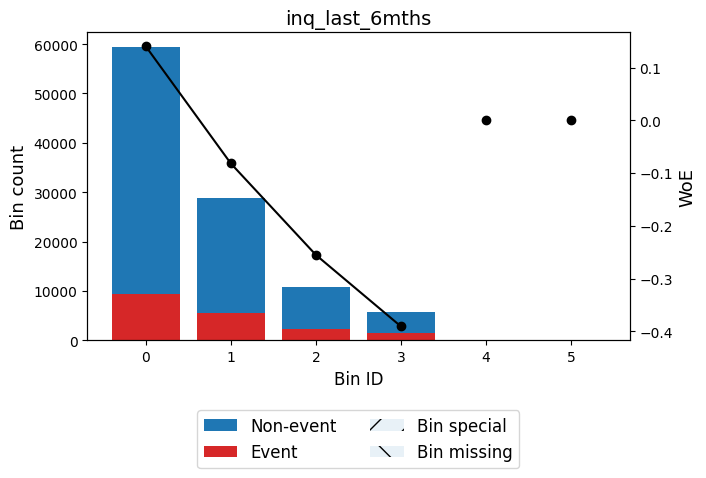

✅ Total IV for revol_util: 0.0209
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 17.85)  │    8679 │             0.131  │ 0.3659728302516243   │ 0.00982613  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [17.85, 33.95) │   15533 │             0.1546 │ 0.17304532858408805  │ 0.00419434  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [33.95, 48.45) │   20112 │             0.1726 │ 0.04095728477881666  │ 0.000317687 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [48.45, 62.65) │   21576 │             0.1859 │ -0.04925365488626743 │ 0.000507355 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [62.65,

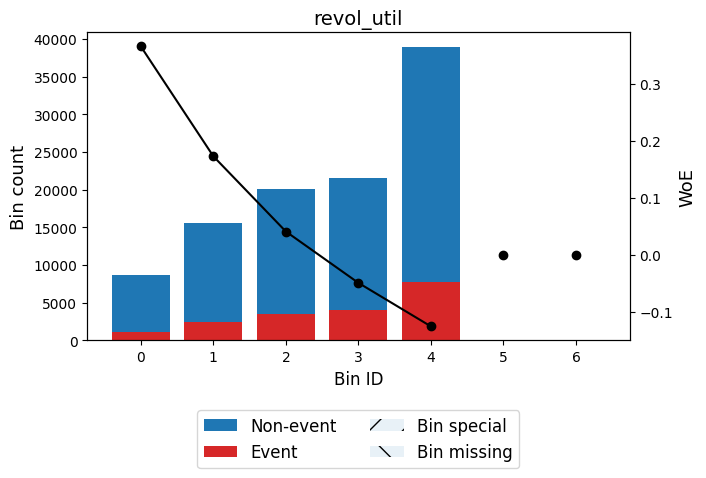

✅ Total IV for tot_cur_bal: 0.0278
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 14981.50)      │   10231 │             0.1639 │ 0.10327117314750311  │ 0.0010068   │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14981.50, 40964.50)  │   23042 │             0.1977 │ -0.12527910215775506 │ 0.00359053  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [40964.50, 76420.50)  │   14718 │             0.2192 │ -0.2557131924021159  │ 0.00994625  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [76420.50, 210670.50) │   32477 │             0.1764 │ 0.015009305991190658 │ 6.94738e-05 │
├───────────────────────┼

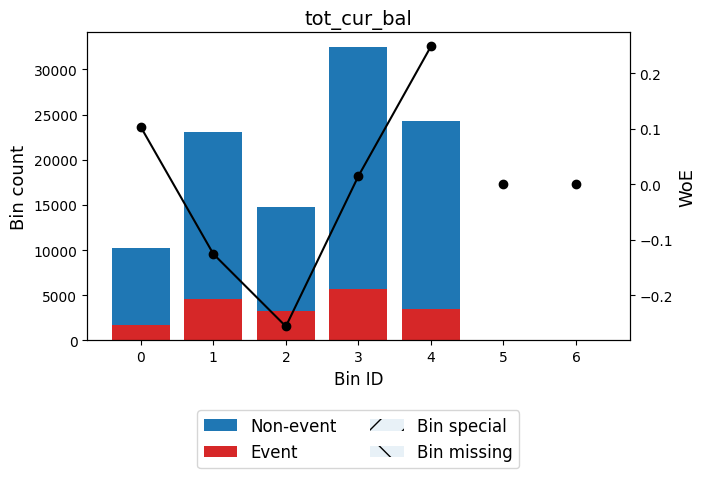

✅ Total IV for acc_open_past_24mths: 0.0852
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 2.50) │   26768 │             0.1293 │ 0.38107482616704424  │ 0.0326911  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 4.50) │   33553 │             0.1615 │ 0.12116625540619697  │ 0.00451869 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, 6.50) │   21897 │             0.1946 │ -0.10597432380455207 │ 0.00242683 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [6.50, 9.50) │   15685 │             0.23   │ -0.317972138723281   │ 0.0166978  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [9.50, inf)  │    6901 │      

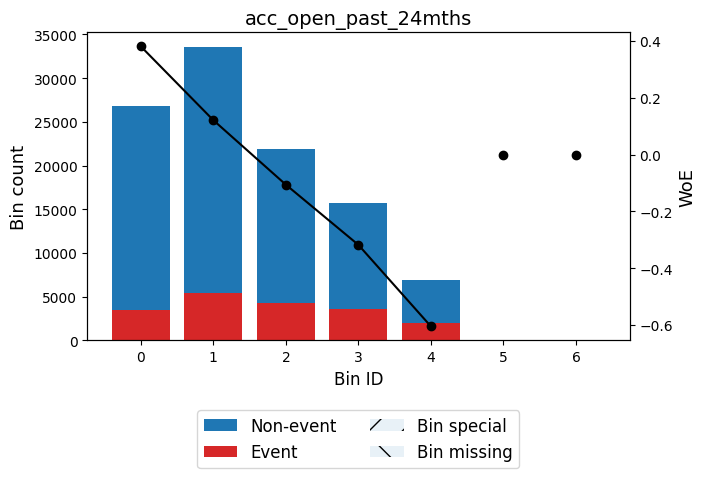

✅ Total IV for avg_cur_bal: 0.0347
╒══════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 7248.50)      │   48575 │             0.2006 │ -0.14329738859067453  │ 0.00995894  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7248.50, 13811.50)  │   22803 │             0.1807 │ -0.014360497699876573 │ 4.5077e-05  │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [13811.50, 20170.00) │   11389 │             0.1654 │ 0.092299445970079     │ 0.000898482 │
├──────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [20170.00, 41154.50) │   16787 │             0.1423 │ 0.27009308588729675   │ 0.0106917   │
├──────────────────────┼─

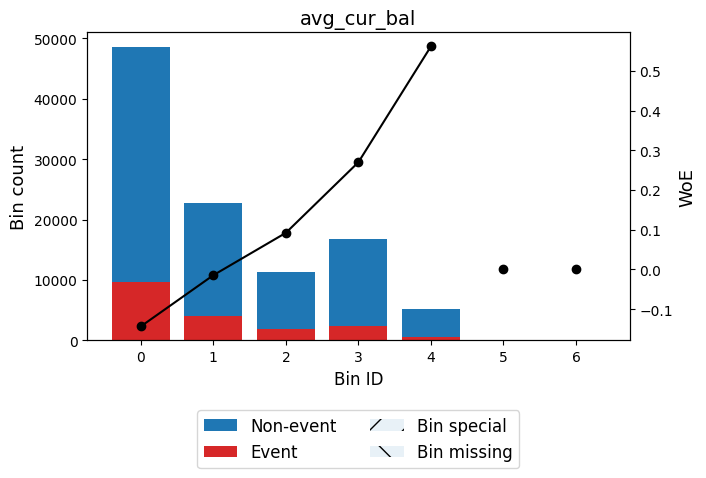

✅ Total IV for bc_open_to_buy: 0.0454
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 205.50)       │    6865 │             0.235  │ -0.3456081965186639  │ 0.00870457 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [205.50, 4606.50)    │   44276 │             0.1995 │ -0.13654885716582554 │ 0.00822536 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4606.50, 14251.50)  │   33576 │             0.1679 │ 0.07476340597623987  │ 0.00174791 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [14251.50, 26808.00) │   11357 │             0.1463 │ 0.2381722448796586   │ 0.00568499 │
├──────────────────────┼─────────┼────────

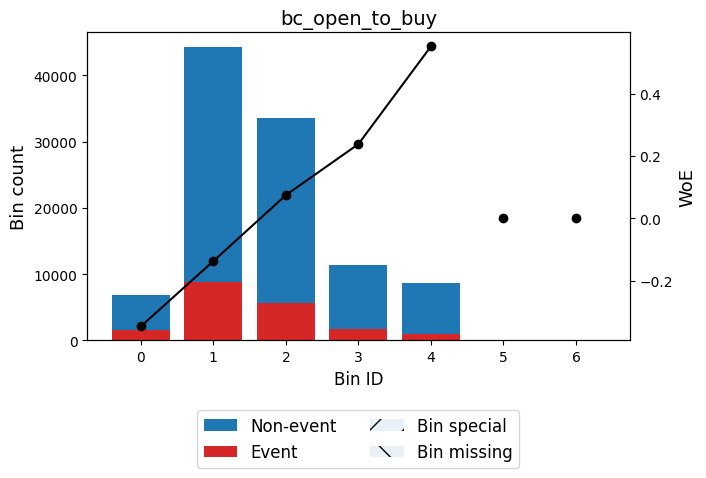

✅ Total IV for bc_util: 0.0271
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 37.15)  │   21015 │             0.1462 │ 0.23836869617260215  │ 0.0105362  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [37.15, 63.35) │   31788 │             0.1667 │ 0.08331655861795828  │ 0.00204939 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [63.35, 92.15) │   36159 │             0.19   │ -0.07625313404714573 │ 0.00205549 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [92.15, 97.85) │   10420 │             0.2063 │ -0.17895468692011351 │ 0.00336882 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [97.85, inf)   │    5

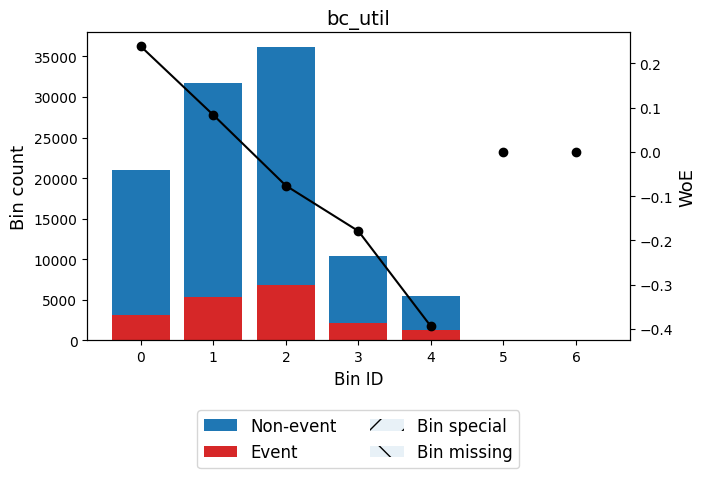

✅ Total IV for mo_sin_rcnt_rev_tl_op: 0.0305
╒════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 3.50)   │   23737 │             0.2114 │ -0.20936102826881187 │ 0.0106023  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 7.50)   │   23749 │             0.1898 │ -0.07493153105479244 │ 0.0013031  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [7.50, 21.50)  │   41073 │             0.1704 │ 0.056645994599805904 │ 0.00123471 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [21.50, 35.50) │    9070 │             0.1471 │ 0.2315814568414194   │ 0.00430184 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [35.50,

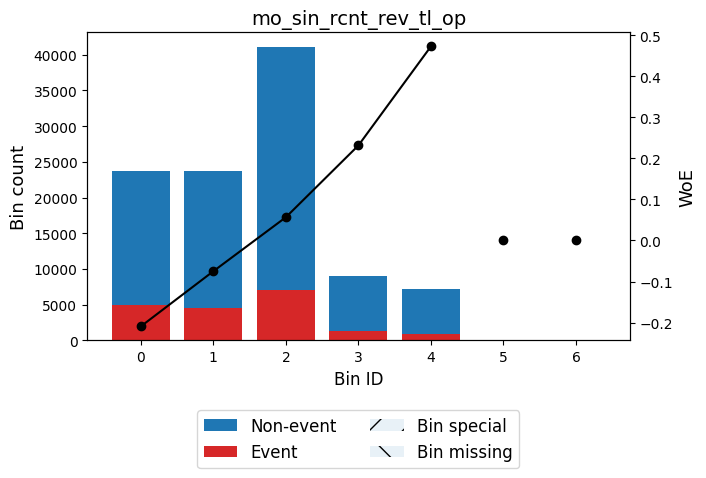

✅ Total IV for mo_sin_rcnt_tl: 0.0377
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50)   │   31665 │             0.2128 │ -0.2179329454495491  │ 0.0153655   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 4.50)   │    9466 │             0.1918 │ -0.08805198615679921 │ 0.000720191 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [4.50, 11.50)  │   44346 │             0.1703 │ 0.05724142054250536  │ 0.00136101  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11.50, 20.50) │   13261 │             0.1434 │ 0.26159699597057107  │ 0.00794555  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [20

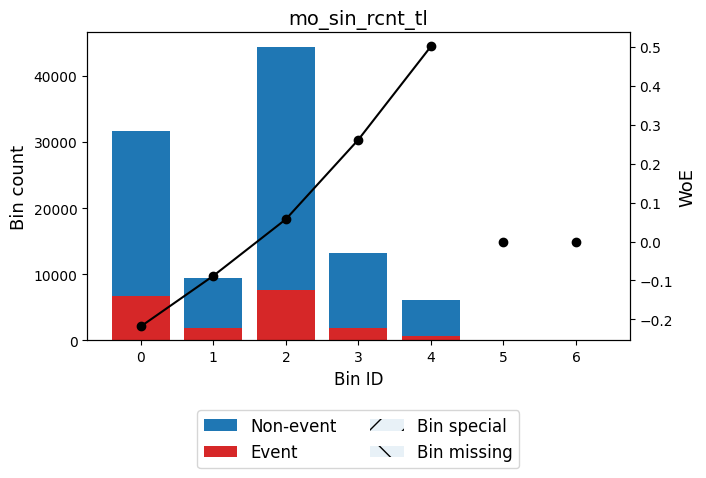

✅ Total IV for mort_acc: 0.0214
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.50) │   39685 │             0.203  │ -0.15830833312752235 │ 0.00997663  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.50, 2.50) │   36235 │             0.173  │ 0.03871102064305232  │ 0.000511676 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [2.50, 3.50) │   10892 │             0.1638 │ 0.10417376022753344  │ 0.00109034  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 5.50) │   12304 │             0.1465 │ 0.23589719268653409  │ 0.00604652  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [5.50, inf)  │    5688 │       

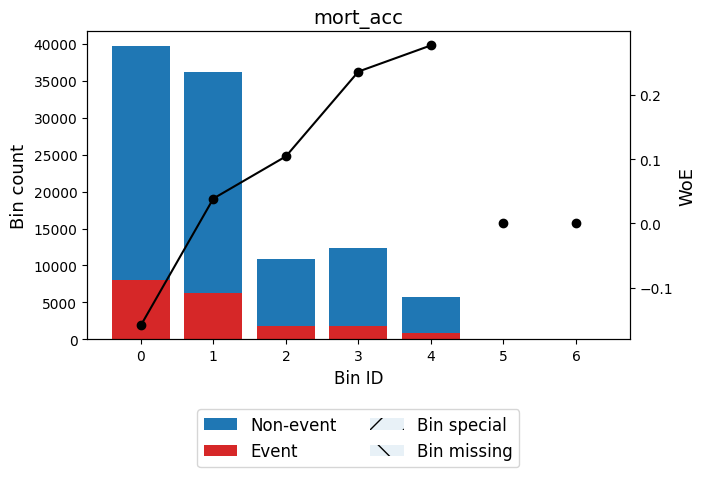

✅ Total IV for mths_since_recent_bc: 0.0277
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 3.50)   │   13533 │             0.2161 │ -0.2373711982265394  │ 0.00783685  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [3.50, 12.50)  │   33181 │             0.1945 │ -0.10533950375587864 │ 0.00363278  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [12.50, 28.50) │   32889 │             0.1723 │ 0.043244238906257504 │ 0.000578718 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [28.50, 56.50) │   14265 │             0.1568 │ 0.15598022880214812  │ 0.00314738  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤

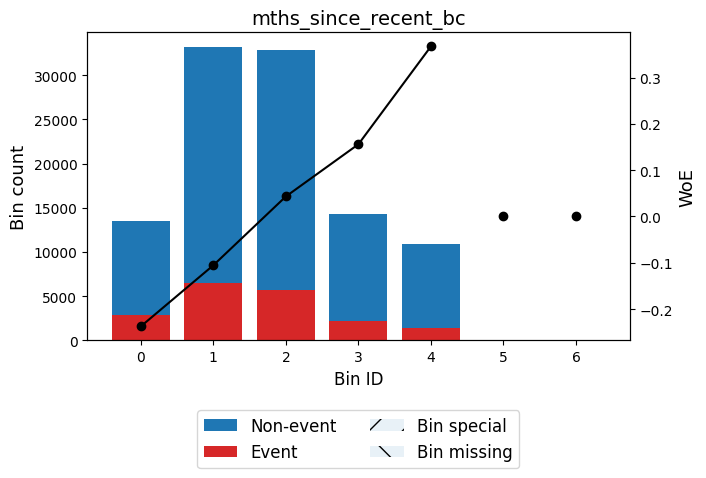

✅ Total IV for mths_since_recent_inq: 0.0268
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 1.50)  │   18634 │             0.2156 │ -0.2347888011331789  │ 0.010549   │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 3.50)  │   15400 │             0.2044 │ -0.16680016693110233 │ 0.0043093  │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [3.50, 4.50)  │    6788 │             0.1924 │ -0.09162038678978734 │ 0.00055978 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, 14.50) │   52731 │             0.163  │ 0.11025181727874012  │ 0.00590079 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [14.50, inf)  │   

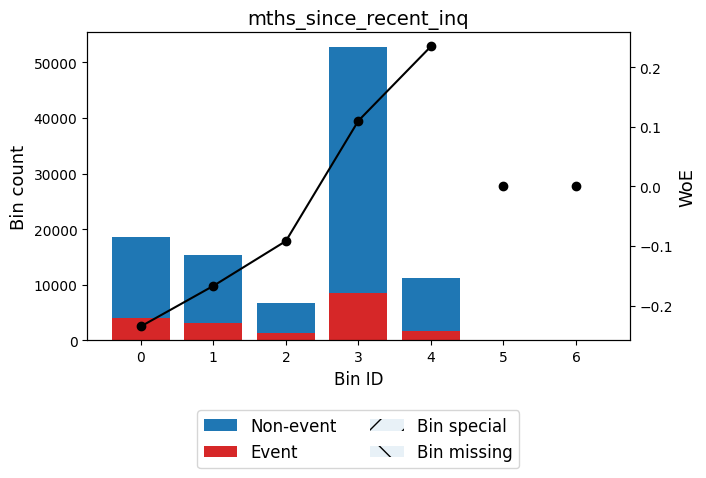

✅ Total IV for num_actv_rev_tl: 0.0345
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 3.50) │   25082 │             0.1499 │ 0.2088862692085265    │ 0.00975225  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [3.50, 5.50) │   36000 │             0.1664 │ 0.08511763975322362   │ 0.00242095  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [5.50, 7.50) │   20923 │             0.1855 │ -0.046849633437704874 │ 0.000444803 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [7.50, 9.50) │   11552 │             0.2014 │ -0.1487840482097058   │ 0.00255761  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [9.50, inf)  

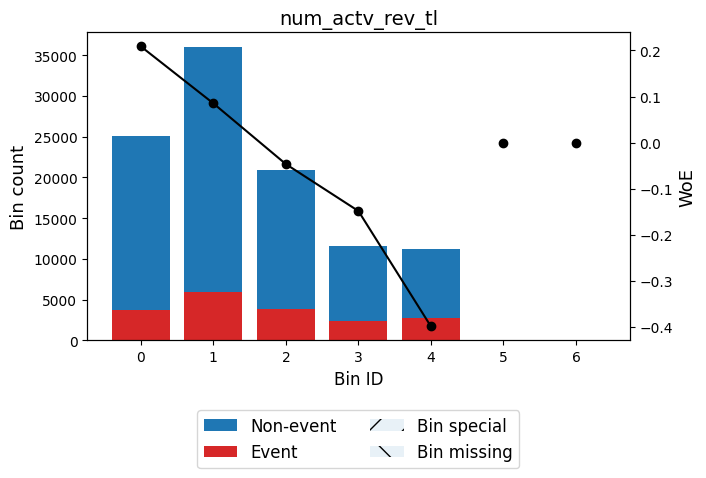

✅ Total IV for num_rev_tl_bal_gt_0: 0.0345
╒═══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin           │   Count │   Default Rate (%) │ WOE                  │         IV │
╞═══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 2.50)  │   11656 │             0.1432 │ 0.2629382487651575   │ 0.00705251 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 5.50)  │   49657 │             0.1638 │ 0.10436740591711624  │ 0.00498908 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [5.50, 8.50)  │   27838 │             0.189  │ -0.06927639972640542 │ 0.00130327 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [8.50, 10.50) │    8111 │             0.2127 │ -0.21724031000687472 │ 0.00391006 │
├───────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [10.50, inf)  │    7

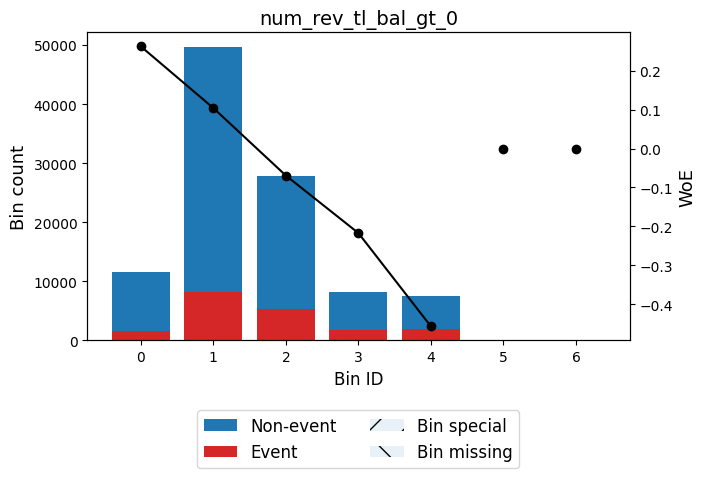

✅ Total IV for num_tl_op_past_12m: 0.0648
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.50) │   16652 │             0.1316 │ 0.36097595620318357  │ 0.0183727  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.50, 1.50) │   24475 │             0.1527 │ 0.1872474814661902   │ 0.00770192 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1.50, 2.50) │   29117 │             0.169  │ 0.06630969446027568  │ 0.00119566 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2.50, 4.50) │   25651 │             0.2164 │ -0.23937963045913624 │ 0.0151159  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [4.50, inf)  │    8909 │        

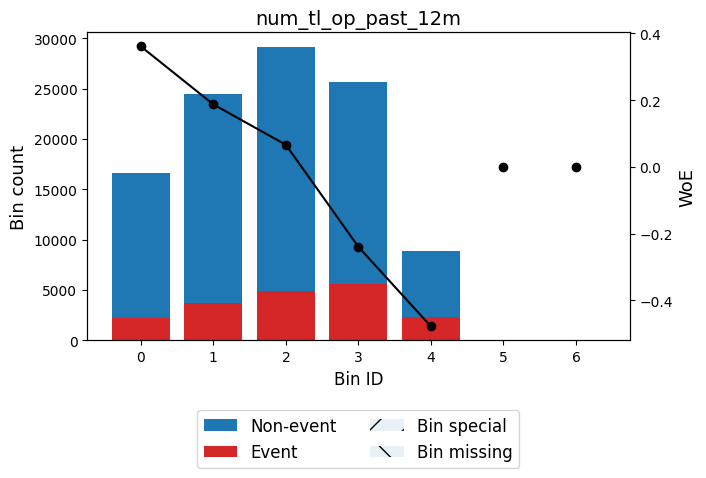

✅ Total IV for percent_bc_gt_75: 0.0297
╒════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 4.90)   │   21299 │             0.1422 │ 0.27090648452867305   │ 0.0136435   │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.90, 44.05)  │   31466 │             0.1658 │ 0.08981381059713889   │ 0.00235237  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [44.05, 52.75) │   11977 │             0.1823 │ -0.025051478103823133 │ 7.22978e-05 │
├────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [52.75, 67.70) │   11415 │             0.2005 │ -0.1431089122813609   │ 0.00233403  │
├────────────────┼─────────┼────────────────────┼───────────────────────┼───────

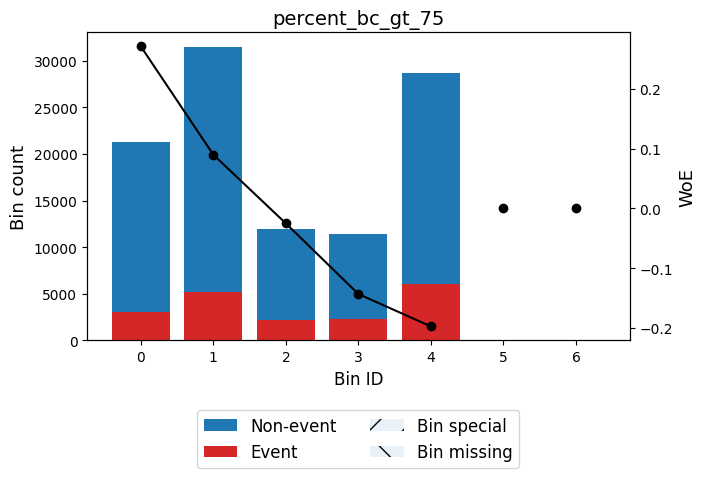

✅ Total IV for tot_hi_cred_lim: 0.0291
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 46920.50)       │   22829 │             0.1895 │ -0.07254656927084646 │ 0.00117326  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [46920.50, 111203.50)  │   26015 │             0.2084 │ -0.1914018828597841  │ 0.00965841  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [111203.50, 244077.00) │   30562 │             0.1753 │ 0.022290587141250207 │ 0.000143856 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [244077.00, 481131.50) │   20102 │             0.1475 │ 0.22784591617351047  │ 0.00924064  │
├──────────

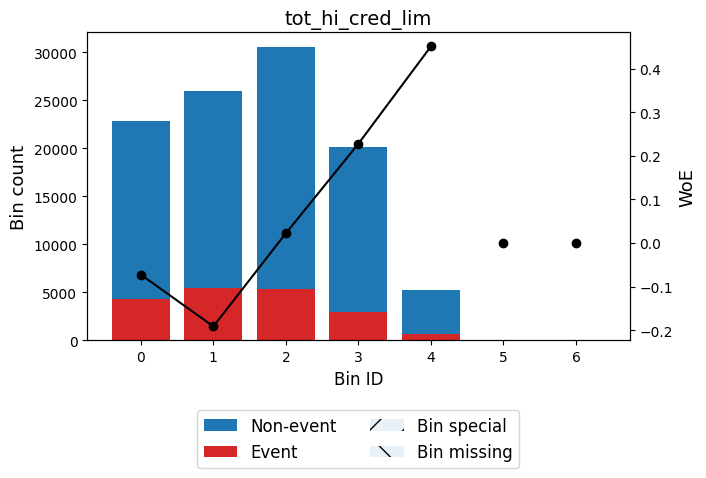

✅ Total IV for total_bc_limit: 0.0285
╒══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                  │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 11041.00)     │   38173 │             0.2031 │ -0.1591009322218171  │ 0.00969523  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [11041.00, 14717.50) │   11629 │             0.1869 │ -0.05614644040473871 │ 0.000356125 │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14717.50, 41223.00) │   42128 │             0.1693 │ 0.06468951266771139  │ 0.00164731  │
├──────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [41223.00, 52309.50) │    5244 │             0.1384 │ 0.3021533283870106   │ 0.00413511  │
├──────────────────────┼────────

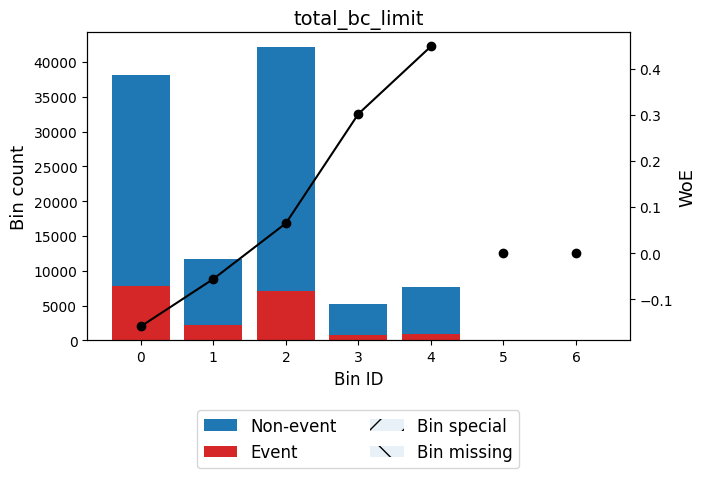

✅ Total IV for fico_score: 0.1153
╒══════════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 679.50)   │   36036 │             0.2264 │ -0.2974409901774262 │ 0.0333644  │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [679.50, 699.50) │   28618 │             0.1896 │ -0.073288744236218  │ 0.00150138 │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [699.50, 719.50) │   19444 │             0.1542 │ 0.17601553305215556 │ 0.00542686 │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [719.50, 739.50) │   10135 │             0.126  │ 0.4106860746344623  │ 0.0142322  │
├──────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [739.50

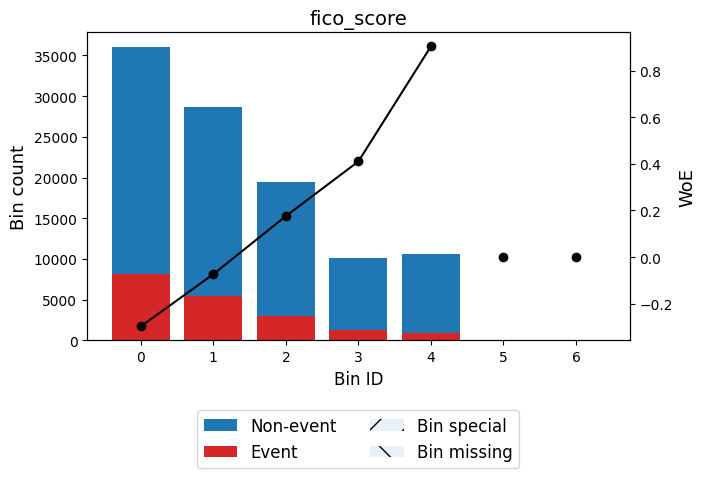

✅ Total IV for fico_score/inq_last_6mths_invalid: 0.0233
╒══════════════╤═════════╤════════════════════╤═════════════════════╤═══════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │        IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪═══════════╡
│ (-inf, 0.50) │   45407 │             0.2043 │ -0.1662650630220437 │ 0.0126225 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ [0.50, inf)  │   59397 │             0.1589 │ 0.1402112562715041  │ 0.0106445 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Special      │       0 │             0      │ 0.0                 │ 0         │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│ Missing      │       0 │             0      │ 0.0                 │ 0         │
├──────────────┼─────────┼────────────────────┼─────────────────────┼───────────┤
│              │  104804 │             0.

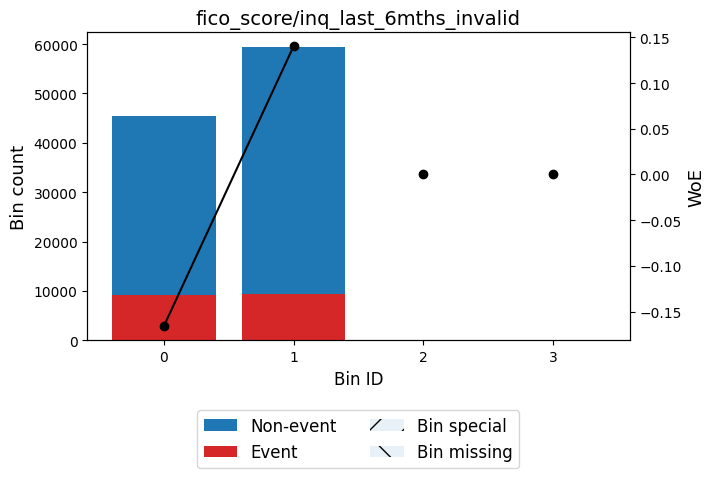

✅ Total IV for fico_score/inq_last_6mths: 0.0536
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 112.42)   │   59430 │             0.1589 │ 0.140367891525212    │ 0.0106737  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [112.42, 344.75) │   11788 │             0.2489 │ -0.4216186992269826  │ 0.0227401  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [344.75, 684.50) │   17811 │             0.216  │ -0.23726391265954438 │ 0.0103045  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [684.50, 704.50) │    7126 │             0.1896 │ -0.07342815638634659 │ 0.00037529 │
├──────────────────┼─────────┼────────────────────┼────────────────────

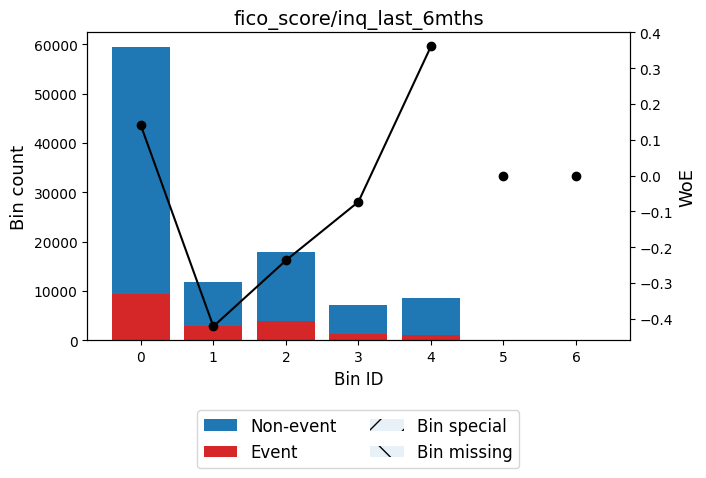

✅ Total IV for loan_amnt/annual_inc: 0.1285
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.10) │   15722 │             0.1127 │ 0.5372493022683433   │ 0.0361844   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.10, 0.17) │   25566 │             0.1366 │ 0.31780445355719444  │ 0.0221852   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.17, 0.26) │   30216 │             0.1715 │ 0.04868956141038705  │ 0.000672825 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.26, 0.33) │   16143 │             0.2231 │ -0.27824992636205104 │ 0.0130049   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.33, inf)  │   17

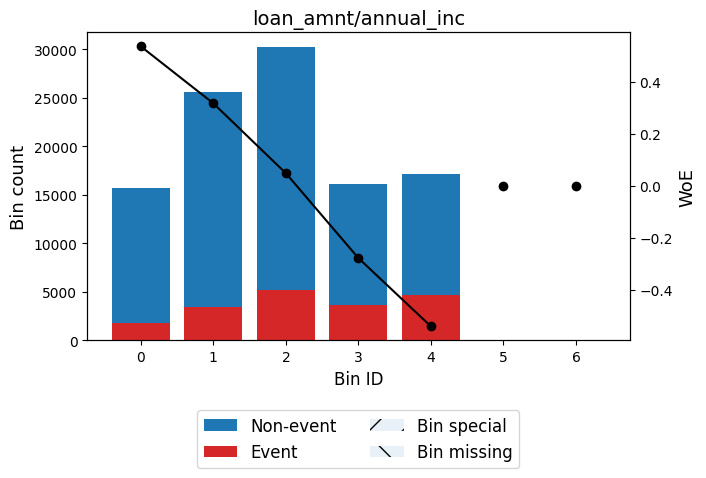

✅ Total IV for revol_util/annual_inc: 0.0455
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │   15371 │             0.1278 │ 0.394672394871008    │ 0.0200431   │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   19597 │             0.1513 │ 0.1979328261561204   │ 0.00686641  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   23719 │             0.1783 │ 0.001526856965558654 │ 5.27354e-07 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.00) │   25971 │             0.196  │ -0.11480386572190282 │ 0.00338734  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, inf)  │   2

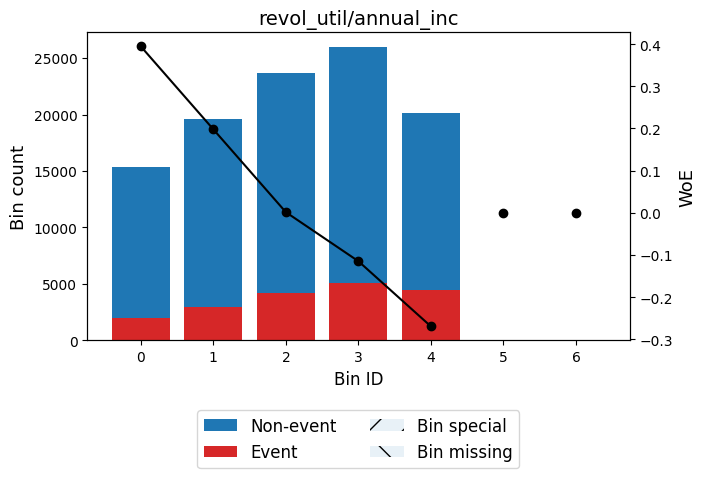

✅ Total IV for acc_op_past_24mths/total_acc: 0.0660
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 0.07) │   12695 │             0.1187 │ 0.47859950187921285 │ 0.0236567  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.07, 0.11) │   13640 │             0.1408 │ 0.2828502442930343  │ 0.00948669 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.11, 0.19) │   32686 │             0.1659 │ 0.08898104575428945 │ 0.00239913 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.19, 0.31) │   27537 │             0.2015 │ -0.1494679119626623 │ 0.00615418 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [0.31, inf)  │   18246 │         

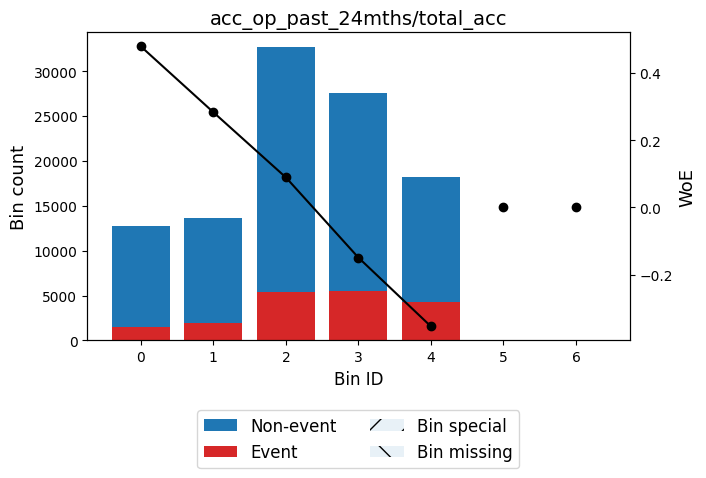

✅ Total IV for bc_open_to_buy/annual_inc: 0.0244
╒══════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │          IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 0.00) │    5353 │             0.2341 │ -0.3406750560198113  │ 0.00658547  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.00, 0.04) │   33719 │             0.1963 │ -0.11671989692924267 │ 0.00454865  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.04, 0.18) │   41251 │             0.1748 │ 0.02563926691315177  │ 0.000256614 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.18, 0.42) │   17056 │             0.1566 │ 0.15761170905954547  │ 0.00384024  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [0.42, inf)  │

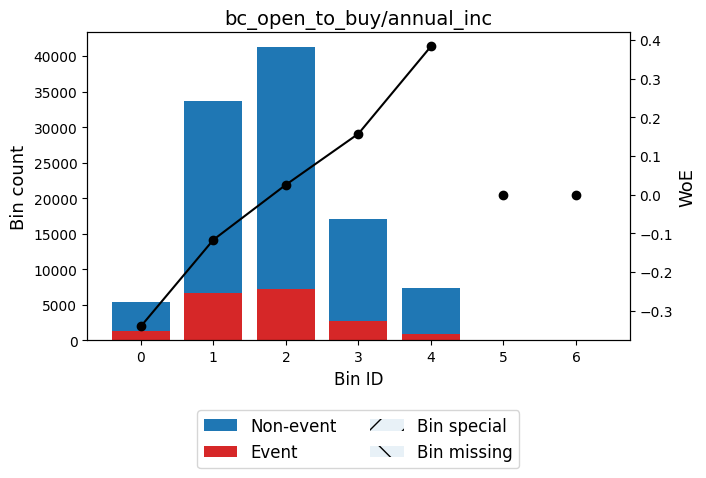

✅ Total IV for inq_last6mths_x_tl_op_past_12m: 0.0457
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   69035 │             0.159  │ 0.1397356458191068    │ 0.0122899   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 2.50) │   10171 │             0.1784 │ 0.0007730221613631016 │ 5.79778e-08 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 4.50) │   12222 │             0.2105 │ -0.2043396040775023   │ 0.00519232  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 8.50) │    7985 │             0.2361 │ -0.3517604035368507   │ 0.0105073   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤


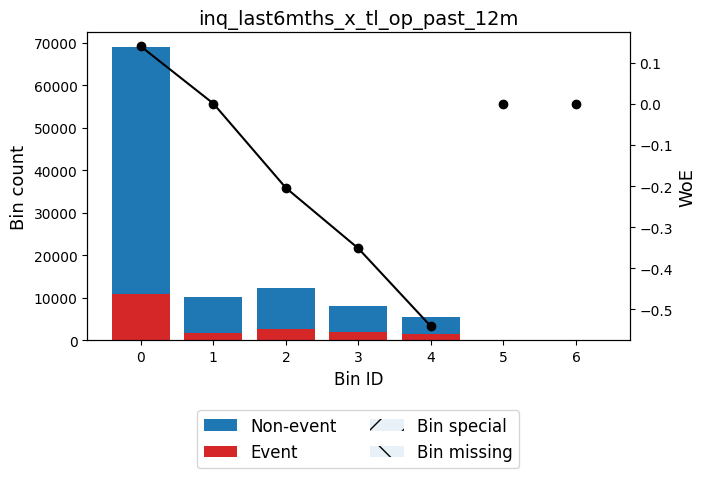

✅ Total IV for dti_x_revol_util: 0.0801
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 451.05)     │   24927 │             0.1261 │ 0.40951262068311745  │ 0.0348181  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [451.05, 902.94)   │   28578 │             0.1592 │ 0.1377098551590079   │ 0.00494444 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [902.94, 1314.82)  │   21007 │             0.1892 │ -0.0710521743312591  │ 0.00103511 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1314.82, 1965.88) │   19946 │             0.2182 │ -0.2501645207835541  │ 0.012879   │
├────────────────────┼─────────┼────────────────────┼───────

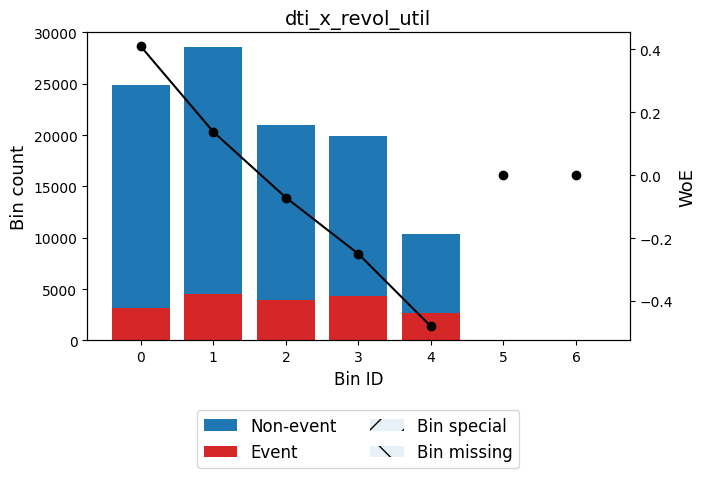

✅ Total IV for avail_ratio: 0.0271
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, -96.85)   │    5422 │             0.2438 │ -0.3942801215353744  │ 0.00907543 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [-96.85, -91.15) │   10420 │             0.2063 │ -0.17895468692011351 │ 0.00336882 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [-91.15, -62.35) │   36159 │             0.19   │ -0.07625313404714573 │ 0.00205549 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [-62.35, -36.15) │   31788 │             0.1667 │ 0.08331655861795828  │ 0.00204939 │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼───────────

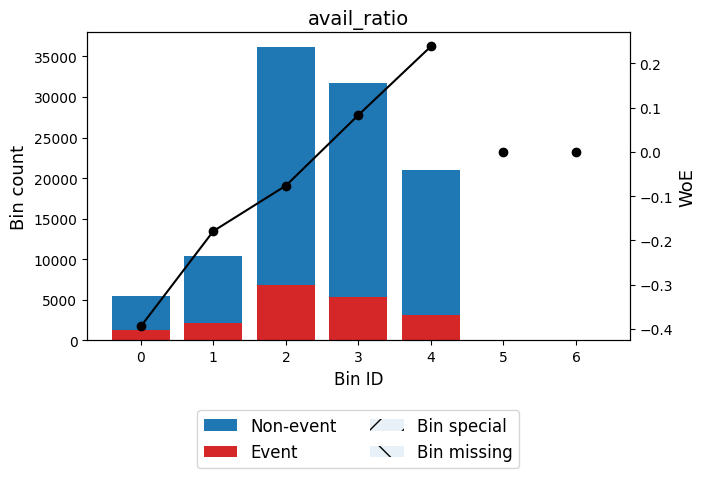

✅ Total IV for tl_op12m_x_inq6m: 0.0457
╒══════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                   │          IV │
╞══════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 1.50) │   69035 │             0.159  │ 0.1397356458191068    │ 0.0122899   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [1.50, 2.50) │   10171 │             0.1784 │ 0.0007730221613631016 │ 5.79778e-08 │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [2.50, 4.50) │   12222 │             0.2105 │ -0.2043396040775023   │ 0.00519232  │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [4.50, 8.50) │    7985 │             0.2361 │ -0.3517604035368507   │ 0.0105073   │
├──────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [8.50, inf) 

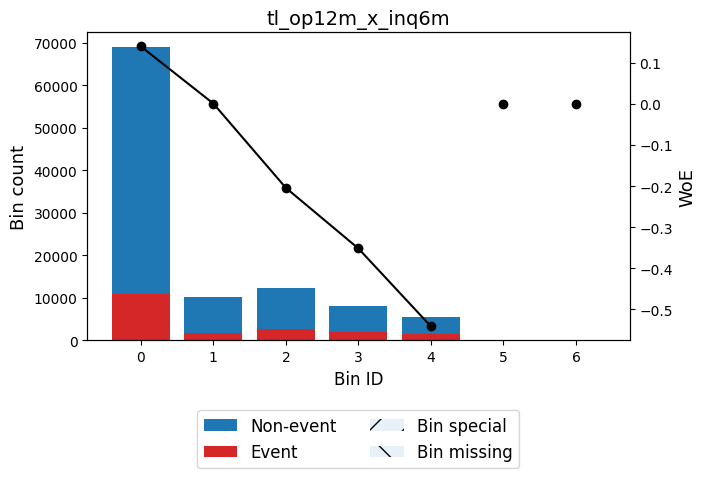

✅ Total IV for dti_x_inq: 0.0577
╒════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 15.48)  │   72279 │             0.1572 │ 0.15332534581263357  │ 0.0154227   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [15.48, 23.56) │   11220 │             0.1881 │ -0.06402018691965261 │ 0.000447845 │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [23.56, 32.05) │    8543 │             0.2209 │ -0.26559091668364765 │ 0.00624648  │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [32.05, 51.88) │    7360 │             0.2501 │ -0.42823357160971853 │ 0.0146748   │
├────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [51.88, 

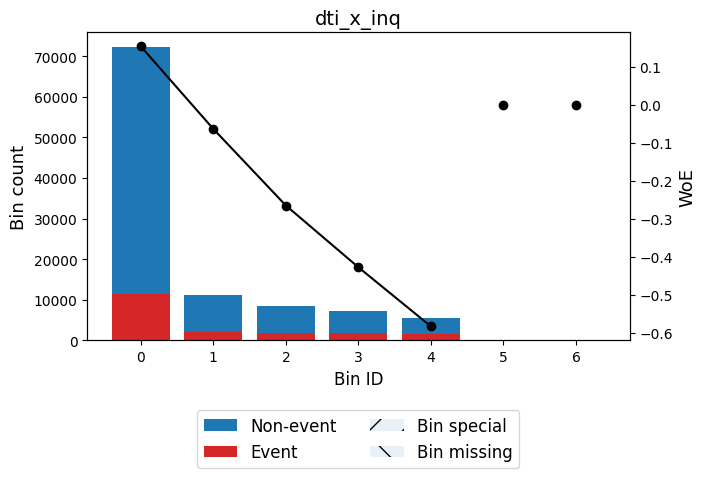

✅ Total IV for dti_x_term: 0.2203
╒════════════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                 │         IV │
╞════════════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 549.90)     │   35842 │             0.1158 │ 0.5071071411427197  │ 0.0742569  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [549.90, 937.62)   │   38412 │             0.1609 │ 0.12513449830127987 │ 0.00551026 │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [937.62, 1220.58)  │   16835 │             0.2251 │ -0.2897419124787015 │ 0.0147565  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1220.58, 1460.10) │    6594 │             0.284  │ -0.6016421357139438 │ 0.0272228  │
├────────────────────┼─────────┼────────────────────┼─────────────────────┼─

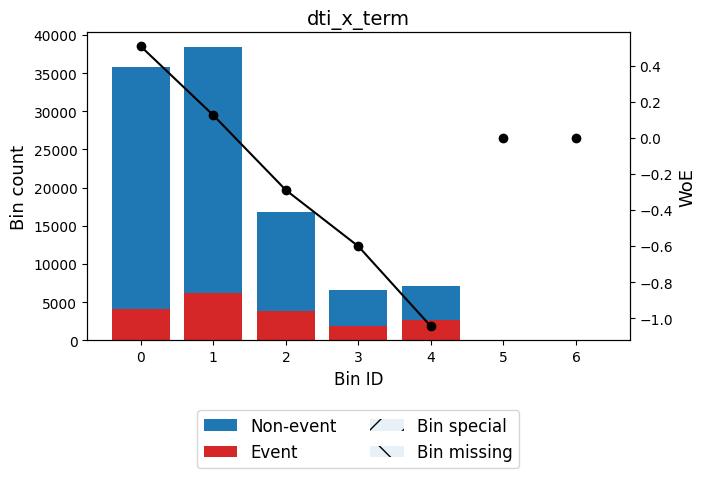

✅ Total IV for term_x_revol_util: 0.1220
╒════════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin                │   Count │   Default Rate (%) │ WOE                  │         IV │
╞════════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 582.60)     │    6828 │             0.1134 │ 0.530781262175795    │ 0.0153727  │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [582.60, 1829.40)  │   34976 │             0.1436 │ 0.25924831731314213  │ 0.020598   │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [1829.40, 2866.80) │   35057 │             0.1716 │ 0.048365354865761434 │ 0.00077034 │
├────────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [2866.80, 3598.20) │   16276 │             0.1942 │ -0.10286052243256094 │ 0.00169775 │
├────────────────────┼─────────┼────────────────────┼──────

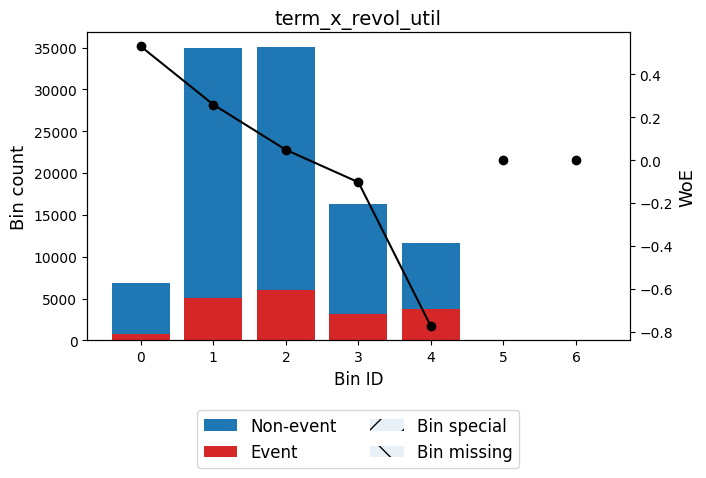

✅ Total IV for dti/fico_ratio: 0.1081
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.02) │   32170 │             0.1247 │ 0.42298993615522185  │ 0.0477223  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.02, 0.03) │   25414 │             0.1637 │ 0.10490868486118954  │ 0.00257946 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.04) │   29055 │             0.1982 │ -0.12838694908896175 │ 0.00475955 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.04, 0.05) │   12661 │             0.2478 │ -0.41599708291507365 │ 0.0237389  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.05, inf)  │    5504 │            

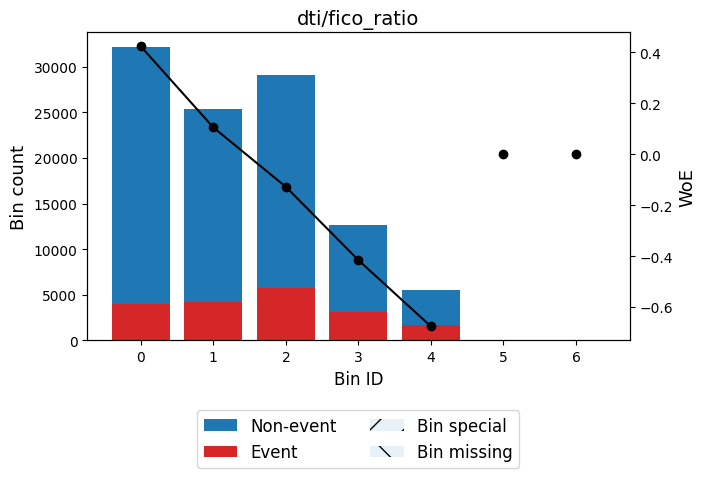

✅ Total IV for loan_amnt/tot_hi_cred_lim: 0.0703
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │    8417 │             0.1103 │ 0.5620374696470245   │ 0.0210212  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.06) │   18448 │             0.1311 │ 0.36492399619971194  │ 0.0207742  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.06, 0.11) │   27234 │             0.1682 │ 0.07251608483628624  │ 0.00133478 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.11, 0.23) │   24849 │             0.2006 │ -0.1433947460347318  │ 0.00510167 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.23, inf)  │   25856 │ 

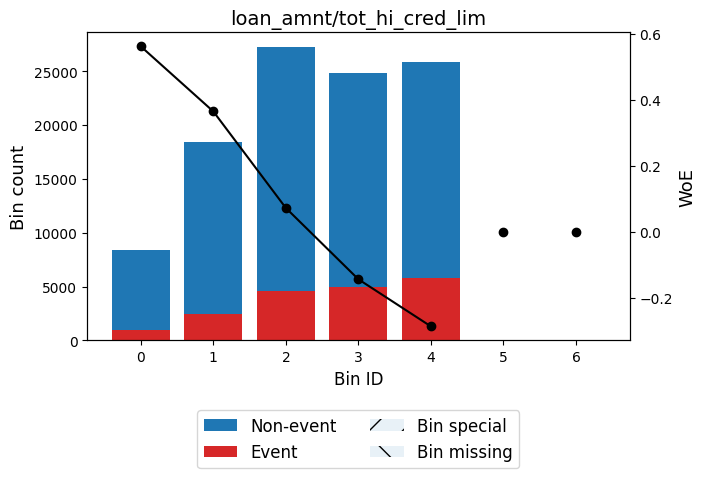

✅ Total IV for bc_open_to_buy/total_rev_hi_lim: 0.0394
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.01) │    6277 │             0.241  │ -0.37912813712930715 │ 0.00967199 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.01, 0.19) │   41588 │             0.2001 │ -0.14048811000854844 │ 0.00818824 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.19, 0.44) │   35951 │             0.1669 │ 0.08188195780808338  │ 0.0022397  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.44, 0.71) │   15740 │             0.1436 │ 0.25920437164415766  │ 0.00926657 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.71, inf)  │    5

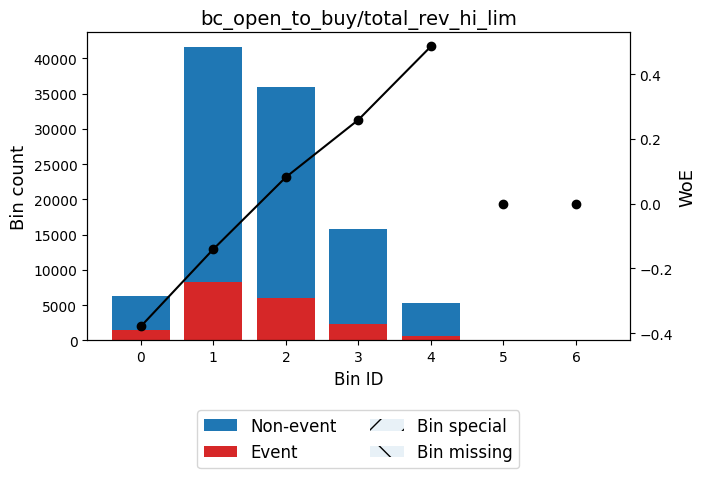

✅ Total IV for fico_score/int_rate: 0.4354
╒═════════════════╤═════════╤════════════════════╤══════════════════════╤═══════════╕
│ Bin             │   Count │   Default Rate (%) │ WOE                  │        IV │
╞═════════════════╪═════════╪════════════════════╪══════════════════════╪═══════════╡
│ (-inf, 40.76)   │   21094 │             0.3294 │ -0.8151433035812025  │ 0.168699  │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [40.76, 57.85)  │   37993 │             0.1966 │ -0.11836921576368487 │ 0.0052738 │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [57.85, 76.01)  │   21558 │             0.1273 │ 0.3986456914513574   │ 0.0286409 │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [76.01, 104.87) │   16670 │             0.0781 │ 0.942264527863736    │ 0.102648  │
├─────────────────┼─────────┼────────────────────┼──────────────────────┼───────────┤
│ [104.87, 

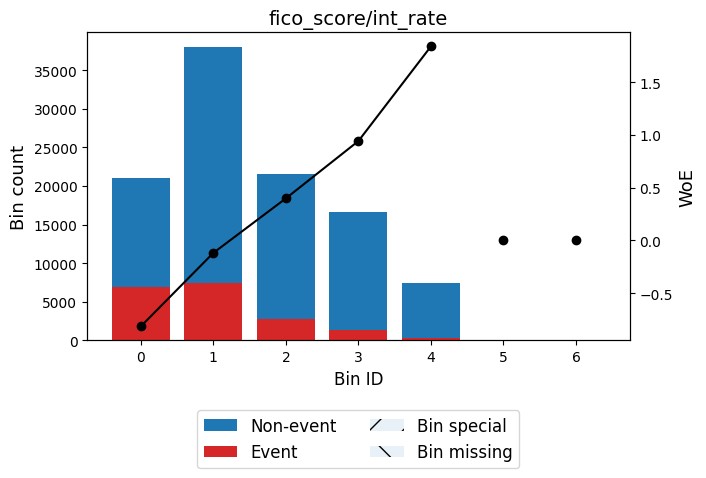

✅ Total IV for installment/annual_inc/12: 0.0921
╒══════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 0.03) │   10601 │             0.1092 │ 0.5724579933139866   │ 0.0273685  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.03, 0.05) │   18263 │             0.1337 │ 0.34287223137223966  │ 0.0182913  │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.05, 0.08) │   26479 │             0.1613 │ 0.12220409901808682  │ 0.00362612 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.08, 0.10) │   21761 │             0.1933 │ -0.09758931425460005 │ 0.00203982 │
├──────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [0.10, inf)  │   27700 │ 

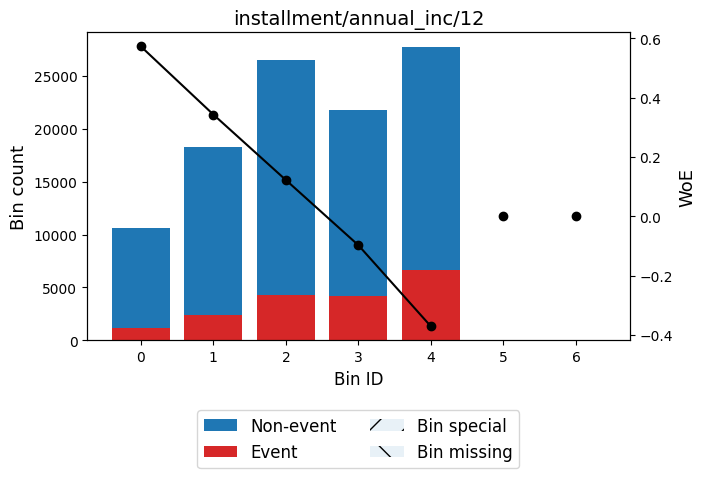

✅ Total IV for installment/annual_inc/12_x_term: 0.2169
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 1.82) │   25704 │             0.1103 │ 0.5612225909157016  │ 0.0640269  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1.82, 3.40) │   35100 │             0.1439 │ 0.2573530638778061  │ 0.0203828  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [3.40, 4.56) │   18167 │             0.1894 │ -0.0722688416849604 │ 0.00092645 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [4.56, 6.85) │   20021 │             0.2563 │ -0.460732079080052  │ 0.0466359  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [6.85, inf)  │    5812 │     

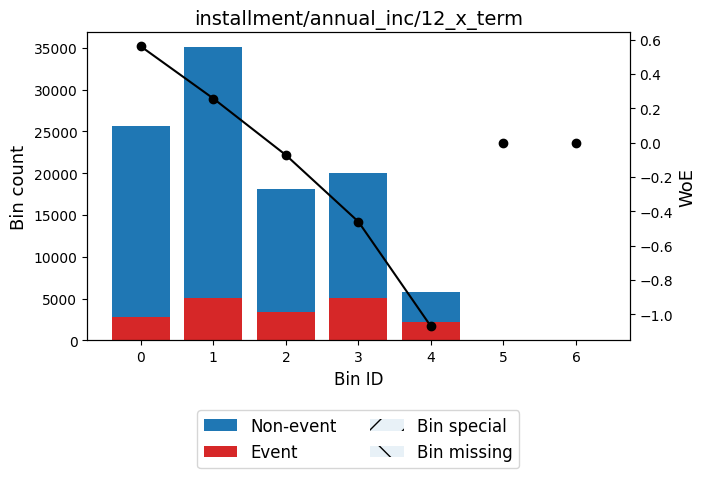

✅ Total IV for grade_numeric: 0.4525
╒══════════════╤═════════╤════════════════════╤═════════════════════╤════════════╕
│ Bin          │   Count │   Default Rate (%) │ WOE                 │         IV │
╞══════════════╪═════════╪════════════════════╪═════════════════════╪════════════╡
│ (-inf, 1.50) │   18877 │             0.0546 │ 1.325128834626995   │ 0.201688   │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [1.50, 2.50) │   31160 │             0.1206 │ 0.4609103760436568  │ 0.0541789  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [2.50, 3.50) │   28917 │             0.2002 │ -0.1412528792558112 │ 0.00575698 │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [3.50, 4.50) │   15265 │             0.2702 │ -0.5326451391036483 │ 0.0484834  │
├──────────────┼─────────┼────────────────────┼─────────────────────┼────────────┤
│ [4.50, inf)  │   10585 │             0.3789 │ -1

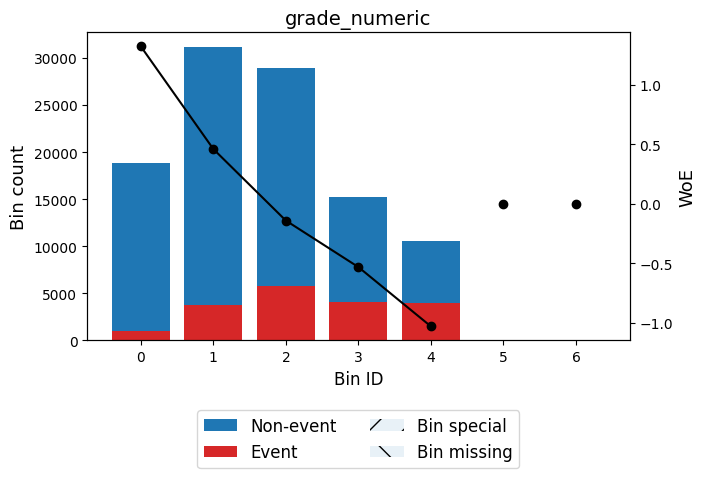

In [110]:
for feature in train_df1.columns: 
    excluded_columns = ['id', 'issue_d', 'default_status']
    x, y = train_df1[feature], train_df1[TARGET_COL]
    if feature in excluded_columns: 
        continue
    
    if train_df1[feature].dtype == 'object': 
        first_bin_and_classify_feature(feature=feature, x=x, y=y, monotonic_trend_type='auto', dtype='categorical', max_n_bins=5)
    else: 
        first_bin_and_classify_feature(feature=feature, x=x, y=y, monotonic_trend_type='auto', max_n_bins=5)


✅ Total IV for tot_cur_bal: 0.0278
╒═══════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                   │   Count │   Default Rate (%) │ WOE                  │          IV │
╞═══════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 14981.50)      │   10231 │             0.1639 │ 0.10327117314750311  │ 0.0010068   │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [14981.50, 40964.50)  │   23042 │             0.1977 │ -0.12527910215775506 │ 0.00359053  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [40964.50, 76420.50)  │   14718 │             0.2192 │ -0.2557131924021159  │ 0.00994625  │
├───────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [76420.50, 210670.50) │   32477 │             0.1764 │ 0.015009305991190658 │ 6.94738e-05 │
├───────────────────────┼

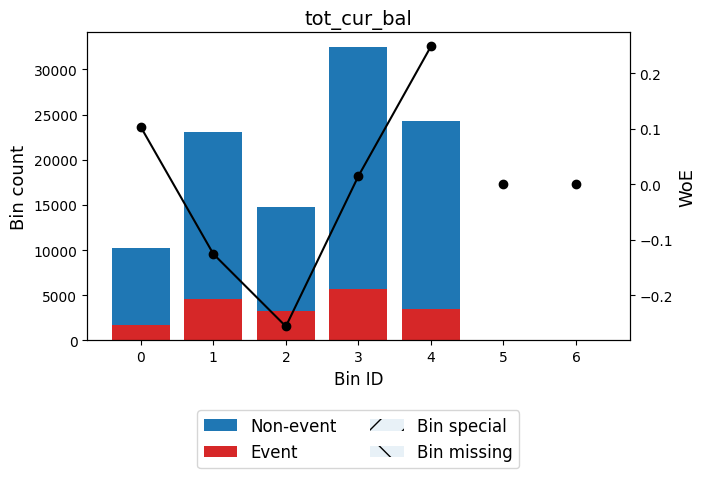

✅ Total IV for tot_hi_cred_lim: 0.0291
╒════════════════════════╤═════════╤════════════════════╤══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                  │          IV │
╞════════════════════════╪═════════╪════════════════════╪══════════════════════╪═════════════╡
│ (-inf, 46920.50)       │   22829 │             0.1895 │ -0.07254656927084646 │ 0.00117326  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [46920.50, 111203.50)  │   26015 │             0.2084 │ -0.1914018828597841  │ 0.00965841  │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [111203.50, 244077.00) │   30562 │             0.1753 │ 0.022290587141250207 │ 0.000143856 │
├────────────────────────┼─────────┼────────────────────┼──────────────────────┼─────────────┤
│ [244077.00, 481131.50) │   20102 │             0.1475 │ 0.22784591617351047  │ 0.00924064  │
├──────────

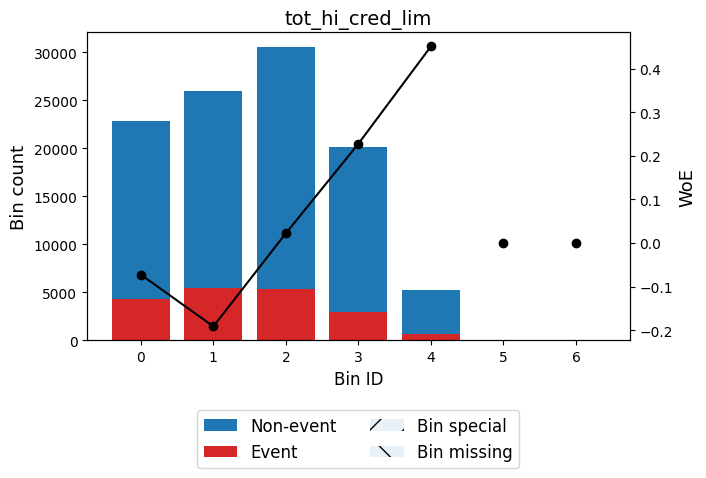

✅ Total IV for fico_score/inq_last_6mths: 0.0536
╒══════════════════╤═════════╤════════════════════╤══════════════════════╤════════════╕
│ Bin              │   Count │   Default Rate (%) │ WOE                  │         IV │
╞══════════════════╪═════════╪════════════════════╪══════════════════════╪════════════╡
│ (-inf, 112.42)   │   59430 │             0.1589 │ 0.140367891525212    │ 0.0106737  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [112.42, 344.75) │   11788 │             0.2489 │ -0.4216186992269826  │ 0.0227401  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [344.75, 684.50) │   17811 │             0.216  │ -0.23726391265954438 │ 0.0103045  │
├──────────────────┼─────────┼────────────────────┼──────────────────────┼────────────┤
│ [684.50, 704.50) │    7126 │             0.1896 │ -0.07342815638634659 │ 0.00037529 │
├──────────────────┼─────────┼────────────────────┼────────────────────

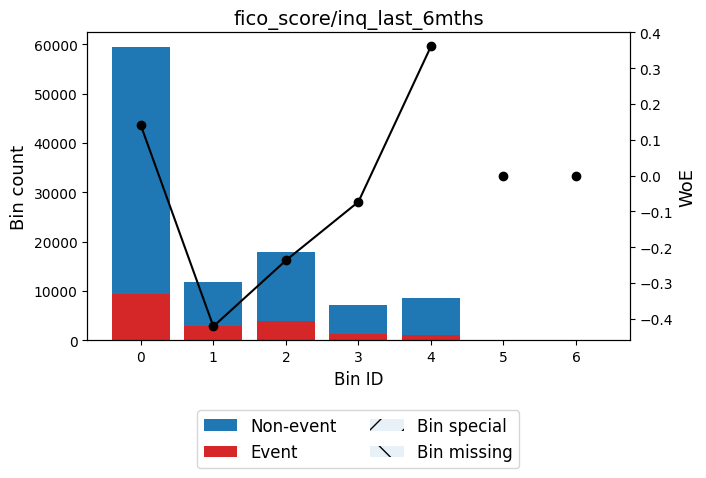

In [111]:
# == Non Monotonic Features == 

non_monotonic_features = ['tot_cur_bal', 'tot_hi_cred_lim', 'fico_score/inq_last_6mths']

for feature in non_monotonic_features: 
    first_bin_and_classify_feature(feature, x=train_df1[feature], y=train_df1[TARGET_COL])

For these non-monotonic features, we shall use piecewise binning from the `optbinning` library. For context, these features have a spot where risk is the lowest, and rises on both sides. For example, for `tot_hi_cred_lim`, risk is the lower on the 2 tails, compared to the middle. Piecewise WoE binning allows me to adhere to monotonicity of WoE, while still capturing the true pattern instead of enforcing a strict monotonic constraint. 

✅ Total IV for tot_cur_bal: 0.0220
╒════════════════════════╤═════════╤════════════════════╤════════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                    │          IV │
╞════════════════════════╪═════════╪════════════════════╪════════════════════════╪═════════════╡
│ (-inf, 76420.50)       │   47991 │             0.1971 │ -0.12146728102410576   │ 0.0070217   │
├────────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [76420.50, 173972.50)  │   25933 │             0.1791 │ -0.0035069102581857248 │ 3.04659e-06 │
├────────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [173972.50, 210670.50) │    6544 │             0.1656 │ 0.09066953292321722    │ 0.000498451 │
├────────────────────────┼─────────┼────────────────────┼────────────────────────┼─────────────┤
│ [210670.50, 403482.50) │   18437 │             0.1502 │ 0.20658791539596089    │ 0.0070170

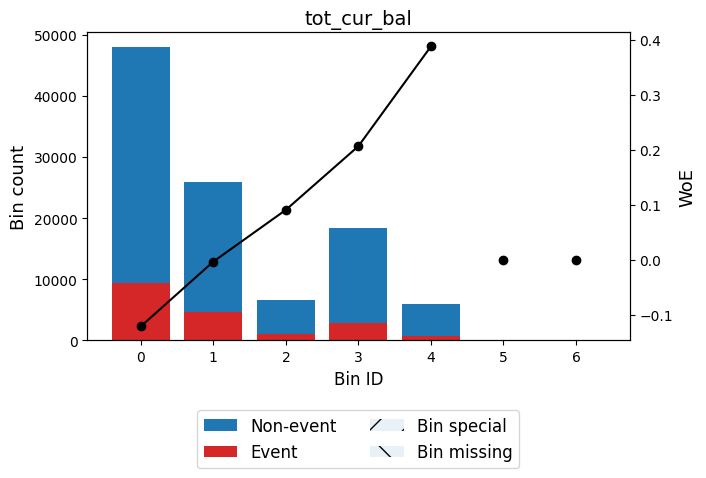

✅ Total IV for tot_hi_cred_lim: 0.0279
╒════════════════════════╤═════════╤════════════════════╤═══════════════════════╤═════════════╕
│ Bin                    │   Count │   Default Rate (%) │ WOE                   │          IV │
╞════════════════════════╪═════════╪════════════════════╪═══════════════════════╪═════════════╡
│ (-inf, 111203.50)      │   48844 │             0.1995 │ -0.13690698344952867  │ 0.00912265  │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [111203.50, 206988.50) │   24489 │             0.1784 │ 0.0013374535269639054 │ 4.17796e-07 │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [206988.50, 244077.00) │    6073 │             0.163  │ 0.10983062050212489   │ 0.000674502 │
├────────────────────────┼─────────┼────────────────────┼───────────────────────┼─────────────┤
│ [244077.00, 481131.50) │   20102 │             0.1475 │ 0.22784591617351047   │ 0.00924064  │
├

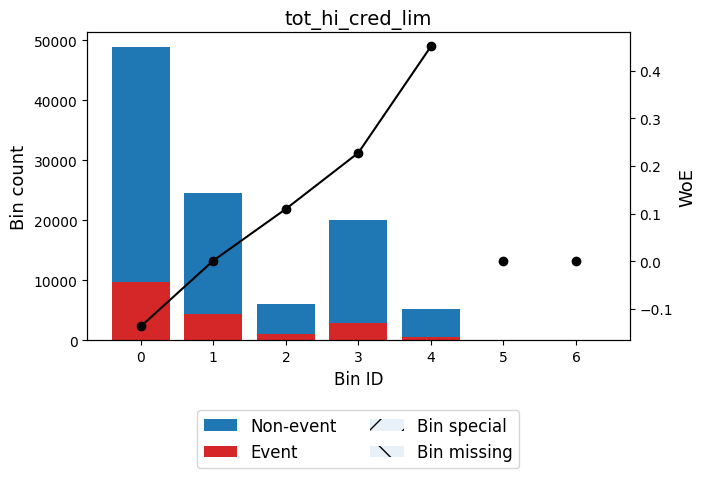

✅ Total IV for fico_score/inq_last_6mths: 0.0103
╒════════════════╤═════════╤════════════════════╤═════════════════════╤═════════════╕
│ Bin            │   Count │   Default Rate (%) │ WOE                 │          IV │
╞════════════════╪═════════╪════════════════════╪═════════════════════╪═════════════╡
│ (-inf, 704.50) │   96155 │             0.1828 │ -0.0285512007335611 │ 0.000754774 │
├────────────────┼─────────┼────────────────────┼─────────────────────┼─────────────┤
│ [704.50, inf)  │    8649 │             0.1316 │ 0.3609749231835935  │ 0.00954267  │
├────────────────┼─────────┼────────────────────┼─────────────────────┼─────────────┤
│ Special        │       0 │             0      │ 0.0                 │ 0           │
├────────────────┼─────────┼────────────────────┼─────────────────────┼─────────────┤
│ Missing        │       0 │             0      │ 0.0                 │ 0           │
├────────────────┼─────────┼────────────────────┼─────────────────────┼─────────────┤
│    

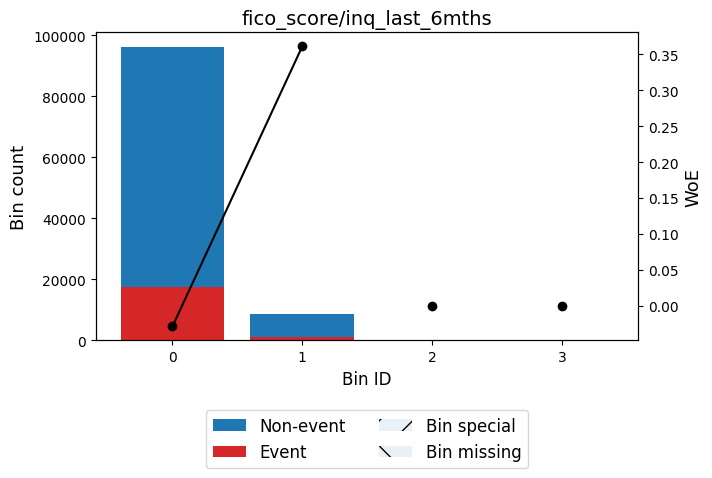

In [112]:
for non_mono in ['tot_cur_bal', 'tot_hi_cred_lim', 'fico_score/inq_last_6mths']: 
    first_bin_and_classify_feature(non_mono, train_df1[non_mono], train_df1[TARGET_COL], monotonic_trend_type='auto_asc_desc')


As seen, enforcing monotonicity constraint caused `fico_score/inq_last_6mths` resulted in a drop of 0.04 in IV. This variable should be dropped, since monotonicity constraint is important for Logistic Regression. 

In [113]:
train_df1 = train_df1.drop('fico_score/inq_last_6mths', axis=1)
train_df1 = train_df1.drop('fico_score/inq_last_6mths_invalid', axis=1)

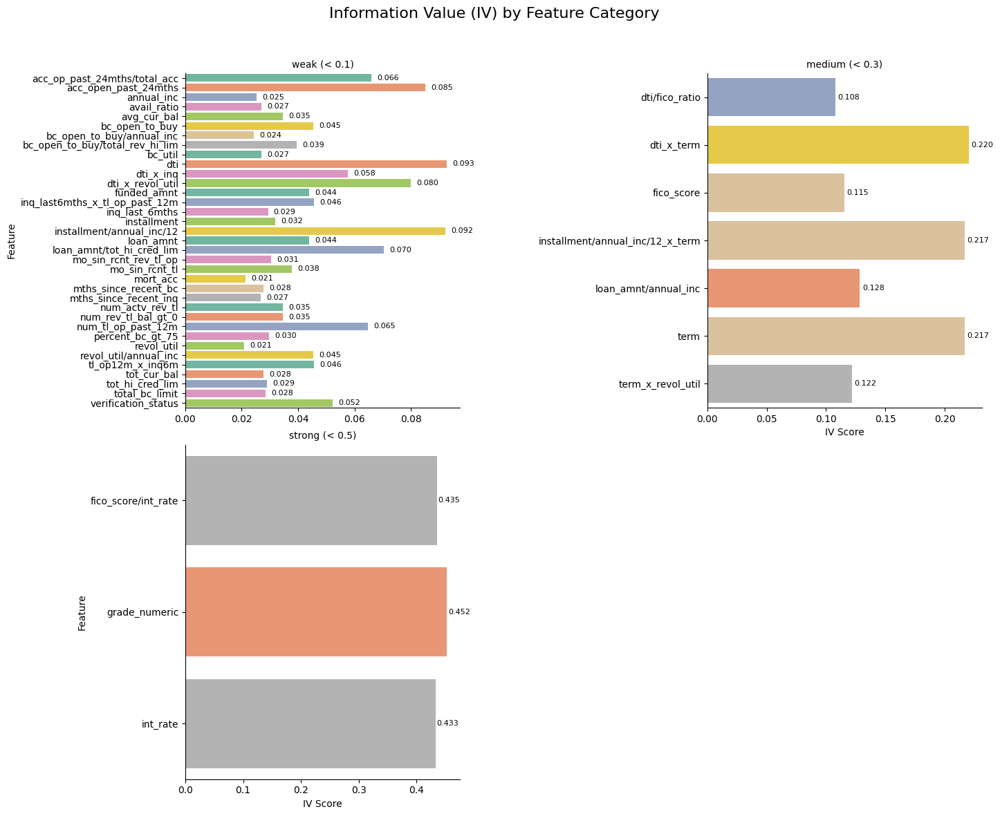

In [114]:
updated_iv_categories = get_updated_iv_categories(updated_iv_categories, train_df1)
plot_iv_by_category(updated_iv_categories)

In [115]:
# == Before WoE Binning Transformation == 
train_df1.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,annual_inc,verification_status,issue_d,...,dti_x_inq,dti_x_term,term_x_revol_util,dti/fico_ratio,loan_amnt/tot_hi_cred_lim,bc_open_to_buy/total_rev_hi_lim,fico_score/int_rate,installment/annual_inc/12,installment/annual_inc/12_x_term,grade_numeric
0,106360,2700.0,2700.0,36,15.96,94.88,F,52200.0,Not Verified,2007-07-01,...,12.57,452.52,3322.8,0.020048,0.024247,0.193983,39.285714,0.021811,0.785214,6
1,98982,5000.0,5000.0,36,9.01,159.03,B,73000.0,Not Verified,2007-07-01,...,0.00,358.56,1353.6,0.013795,0.044903,0.193983,80.133185,0.026142,0.941109,2
2,92440,5000.0,5000.0,36,7.43,155.38,A,95000.0,Not Verified,2007-07-01,...,0.00,137.88,244.8,0.004961,0.044903,0.193983,103.903096,0.019627,0.706570,1
3,117863,8000.0,8000.0,36,9.96,257.99,B,48000.0,Not Verified,2007-08-01,...,45.39,544.68,1720.8,0.020956,0.071844,0.193983,72.489960,0.064497,2.321910,2
4,122637,4000.0,4000.0,36,7.75,124.89,A,61800.0,Not Verified,2007-08-01,...,0.00,124.56,615.6,0.004632,0.035922,0.193983,96.387097,0.024250,0.873017,1


In [116]:
# == Ensure Same Columns between train_df and test_df == 
test_df1 = tx_grade(test_df1)
test_df1 = test_df1[train_df1.columns]
test_df1.head()

,id,loan_amnt,funded_amnt,term,int_rate,installment,grade,annual_inc,verification_status,issue_d,...,dti_x_inq,dti_x_term,term_x_revol_util,dti/fico_ratio,loan_amnt/tot_hi_cred_lim,bc_open_to_buy/total_rev_hi_lim,fico_score/int_rate,installment/annual_inc/12,installment/annual_inc/12_x_term,grade_numeric
106040,94087501,10450.0,10450.0,36,13.49,354.58,C,44000.0,Not Verified,2016-11-01,...,0.00,687.24,2001.6,0.028621,0.069298,0.365067,49.444033,0.096704,3.481331,3
106039,91958855,3600.0,3600.0,36,12.74,120.85,C,55000.0,Source Verified,2016-11-01,...,13.46,484.56,565.2,0.018019,0.110875,0.338768,58.634223,0.026367,0.949222,3
106041,92851040,35000.0,35000.0,60,14.99,832.47,C,130000.0,Source Verified,2016-11-01,...,0.00,836.40,2556.0,0.019858,0.197031,0.214922,46.831221,0.076843,4.610603,3
106042,92832689,5500.0,5500.0,36,11.39,181.09,B,65500.0,Not Verified,2016-11-01,...,1.28,46.08,1317.6,0.001850,0.033283,0.347857,60.755048,0.033177,1.194365,2
106046,92542404,21400.0,21400.0,36,14.99,741.74,C,75000.0,Verified,2016-11-01,...,0.00,609.48,1191.6,0.025574,0.045997,0.591135,44.162775,0.118678,4.272422,3


In [117]:
# == Exact Same Columns == 
set(test_df1.columns) - set(train_df1.columns)

set()

In [118]:
# == 1. WoE binning Transformation on train_df == 
non_monotonic_cols = ['tot_cur_bal', 'tot_hi_cred_lim']

# == 2. Transform Train Dataset == 
train_df1 , optb_dict = woe_bin_transform(train_df1, non_monotonic_features, TARGET_COL)

train_df1.head()

,id,issue_d,default_status,loan_amnt_woe,funded_amnt_woe,term_woe,int_rate_woe,installment_woe,grade_woe,annual_inc_woe,...,dti_x_inq_woe,dti_x_term_woe,term_x_revol_util_woe,dti/fico_ratio_woe,loan_amnt/tot_hi_cred_lim_woe,bc_open_to_buy/total_rev_hi_lim_woe,fico_score/int_rate_woe,installment/annual_inc/12_woe,installment/annual_inc/12_x_term_woe,grade_numeric_woe
0,106360,2007-07-01,0,0.29539,0.295556,0.307384,-0.406544,0.365639,-1.032039,-0.055869,...,0.153325,0.507107,-0.102861,0.104909,0.562037,0.081882,-0.815143,0.572458,0.561223,-1.032039
1,98982,2007-07-01,0,0.29539,0.295556,0.307384,0.558405,0.365639,0.460910,-0.055869,...,0.153325,0.507107,0.259248,0.422990,0.364924,0.081882,0.942265,0.572458,0.561223,0.460910
2,92440,2007-07-01,0,0.29539,0.295556,0.307384,1.400597,0.365639,1.325129,0.096498,...,0.153325,0.507107,0.530781,0.422990,0.364924,0.081882,0.942265,0.572458,0.561223,1.325129
3,117863,2007-08-01,0,0.29539,0.295556,0.307384,0.558405,0.037319,0.460910,-0.055869,...,-0.428234,0.507107,0.259248,0.104909,0.072516,0.081882,0.398646,0.122204,0.257353,0.460910
4,122637,2007-08-01,0,0.29539,0.295556,0.307384,1.400597,0.365639,1.325129,-0.055869,...,0.153325,0.507107,0.259248,0.422990,0.364924,0.081882,0.942265,0.572458,0.561223,1.325129


In [119]:
# == Transform Test Dataset == 
test_df1 = apply_woe_transform(test_df1,optb_dict)

In [120]:
# == Evaluate Model Performance upon WoE Transformation == 
run_model_checkpoint(train_df1, test_df1, run_name='WoE Feature Selection', model_type='Logistic Regression', run_group='Feature Engineering') 


✅ Best F1 Score = 0.4115 at threshold = 0.47

📄 Classification Report (Optimized Threshold):
              precision    recall  f1-score   support

 Non-Default     0.8885    0.6032    0.7186     20627
     Default     0.2939    0.6858    0.4115      4968

    accuracy                         0.6192     25595
   macro avg     0.5912    0.6445    0.5650     25595
weighted avg     0.7731    0.6192    0.6590     25595



Accuracy,▁
Best Threshold,▁
F1 Score,▁
Gini,▁
Precision,▁
Recall,▁
Accuracy,0.61922
Best Threshold,0.47376
F1 Score,0.41147
Gini,0.3945
Model Type,Logistic Regression


In [121]:
train_df2 = train_df1
test_df2 = test_df1

# 3. Multicollinearity Handling

In [124]:
train_df2.columns

Index(['id', 'issue_d', 'default_status', 'loan_amnt_woe', 'funded_amnt_woe',
       'term_woe', 'int_rate_woe', 'installment_woe', 'grade_woe',
       'annual_inc_woe', 'verification_status_woe', 'dti_woe',
       'inq_last_6mths_woe', 'revol_util_woe', 'tot_cur_bal_woe',
       'acc_open_past_24mths_woe', 'avg_cur_bal_woe', 'bc_open_to_buy_woe',
       'bc_util_woe', 'mo_sin_rcnt_rev_tl_op_woe', 'mo_sin_rcnt_tl_woe',
       'mort_acc_woe', 'mths_since_recent_bc_woe', 'mths_since_recent_inq_woe',
       'num_actv_rev_tl_woe', 'num_rev_tl_bal_gt_0_woe',
       'num_tl_op_past_12m_woe', 'percent_bc_gt_75_woe', 'tot_hi_cred_lim_woe',
       'total_bc_limit_woe', 'fico_score_woe', 'loan_amnt/annual_inc_woe',
       'revol_util/annual_inc_woe', 'acc_op_past_24mths/total_acc_woe',
       'bc_open_to_buy/annual_inc_woe', 'inq_last6mths_x_tl_op_past_12m_woe',
       'dti_x_revol_util_woe', 'avail_ratio_woe', 'tl_op12m_x_inq6m_woe',
       'dti_x_inq_woe', 'dti_x_term_woe', 'term_x_revol_util_

In [125]:
excluded_columns = ['id', 'issue_d', 'default_status']
numeric_cols2 = [feature for feature in train_df2.columns if feature not in excluded_columns]
keep_cols , drop_cols = calculate_vif_pandas(train_df2, numeric_cols2)


print("✅ Features to Keep (VIF <= 5.0):")
for feature, vif in keep_cols:
    print(f" - {feature}: {vif}")
    
print("\n❌ Features to Drop (VIF > 5.0):")
for feature, vif in drop_cols:
    print(f" - {feature}: {vif}")

/Users/lunlun/Downloads/Github/Credit-Risk-Modeling-PySpark/venv/lib/python3.11/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


✅ Features to Keep (VIF <= 5.0):
 - installment_woe: 4.9210565454640385
 - annual_inc_woe: 4.867004908419802
 - verification_status_woe: 1.143378728406438
 - acc_open_past_24mths_woe: 3.44739441318283
 - mo_sin_rcnt_rev_tl_op_woe: 2.5627121313243437
 - mo_sin_rcnt_tl_woe: 2.46739105201868
 - mort_acc_woe: 1.7419224368517434
 - mths_since_recent_bc_woe: 1.837483842231805
 - mths_since_recent_inq_woe: 1.7978642358996064
 - num_tl_op_past_12m_woe: 3.720445148005486
 - percent_bc_gt_75_woe: 2.5986189322488538
 - total_bc_limit_woe: 3.5914612571820266
 - fico_score_woe: 2.093949997832689
 - acc_op_past_24mths/total_acc_woe: 2.4491769366966216
 - dti_x_inq_woe: 4.4871361410375
 - term_x_revol_util_woe: 4.412732246119231
 - loan_amnt/tot_hi_cred_lim_woe: 4.955481338749756
 - bc_open_to_buy/total_rev_hi_lim_woe: 3.993879336021409

❌ Features to Drop (VIF > 5.0):
 - loan_amnt_woe: 1582.5204827568027
 - funded_amnt_woe: 1584.9287763695538
 - term_woe: 5.244799244829715
 - int_rate_woe: 10.447869

In [ ]:
'funded_amnt_woe' , 'int_rate', 'fico_score/int_rate', 'grade_woe', 


['funded_amnt_woe', 'installment_woe', 'grade_woe', 'avg_cur_bal_woe', 'num_rev_tl_bal_gt_0_woe', 'tot_hi_cred_lim_woe', 'bc_open_to_buy/annual_inc_woe', 'inq_last6mths_x_tl_op_past_12m_woe', 'avail_ratio_woe', 'tl_op12m_x_inq6m_woe', 'dti_x_inq_woe', 'dti/fico_ratio_woe', 'fico_score/int_rate_woe', 'installment/annual_inc/12_woe', 'installment/annual_inc/12_x_term_woe', 'grade_numeric_woe']


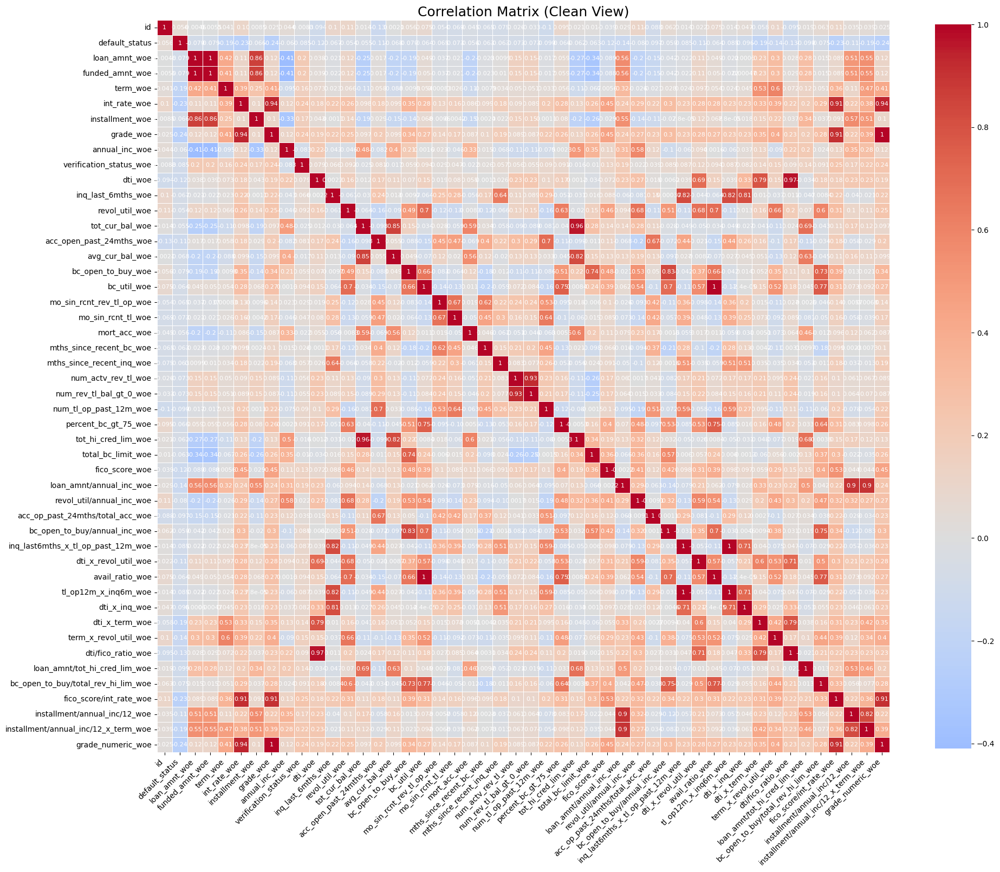

In [127]:
# == Determine which variables to remove == 
threshold = 0.5
corr_matrix = train_df2.corr(numeric_only=True)
# strong_corrs = corr_matrix[abs(corr_matrix) > threshold]


plt.figure(figsize=(20, 20))

sns.heatmap(
    corr_matrix,
    cmap='coolwarm',
    center=0,
    square=True,
    linewidths=0.5,
    annot_kws={"size": 8, "color": "white"},  
    cbar_kws={"shrink": 0.7},
    annot=True
)

plt.title("Correlation Matrix (Clean View)", fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()